#  **MODELING Z BOSON DECAY EVENTS WITH GENERATIVE MODELS**

## **1. INTRODUCTION**

### **SCIENTIFIC BACKGROUND**

#### Z Boson Decays in High-Energy Physics

The Z boson is a neutral, massive gauge boson mediating the weak nuclear force. At the Large Hadron Collider (LHC), Z bosons are predominantly produced through Drell-Yan processes, where quark-antiquark pairs annihilate to form a Z boson, which subsequently decays into fermion-antifermion pairs. Notably, decays into charged lepton pairs, such as Z → e⁺e⁻ and Z → μ⁺μ⁻, provide clean signatures in detectors due to minimal background noise and well-understood final states.

These decay channels are instrumental for:

- *Detector calibration*: Ensuring accurate measurements by comparing known decay signatures to detector responses.
- *Standard Model validation*: Testing the consistency of observed decay rates and kinematic distributions with theoretical predictions.
- *Parton distribution function (PDF) constraints*: Refining our understanding of the momentum distribution of quarks and gluons within protons.
- *New physics searches*: Identifying deviations from expected decay patterns that could hint at physics beyond the Standard Model.

#### Challenges in Data Generation and Simulation

Traditional event simulations in particle physics rely on Monte Carlo (MC) methods, which involve:

1. *Matrix element calculations*: Computing probabilities for specific particle interactions.
2. *Parton shower modeling*: Simulating the emission of quarks and gluons.
3. *Hadronization*: Modeling the formation of hadrons from quarks and gluons.
4. *Detector simulation*: Emulating the detector's response to particles.

While MC simulations are highly detailed, they are computationally intensive, especially when high-statistics samples are required for rare processes or extensive parameter scans. This computational demand can limit the scope and speed of analyses.

#### The Role of Generative Models

Generative models, such as Variational Autoencoders (VAEs) and Wasserstein Generative Adversarial Networks (WGANs), offer a data-driven alternative to traditional simulations. These models learn the underlying data distribution from real events and can generate new, statistically similar events with significantly reduced computational overhead.

Benefits include:

- *Accelerated data generation*: Producing large datasets quickly for training or analysis purposes.
- *Data augmentation*: Enhancing limited datasets to improve machine learning model performance.
- *Anomaly detection*: Identifying events that deviate from learned patterns, potentially signaling new physics.
- *Unsupervised learning*: Discovering latent structures in data without explicit labels.

Recent studies have demonstrated the efficacy of generative models in replicating complex particle physics data, suggesting their potential as complementary tools alongside traditional MC simulations.


### **DATA:  Z-BOSON DECAYS INTO PAIRS OF LEPTONS**

We utilize the data set from Kaggle: https://www.kaggle.com/datasets/omidbaghchehsaraei/identification-of-two-modes-of-z-boson, which comprises data coming from experiments conducted at CERN (Geneva) of simulated events of Z boson decays into electron and muon pairs.

There are two types of events in this dataset: Zee and Zmumu events. By the word "event" we mean a collision of particles occurring in the detector. This particular experiment was conducted in the Large Hadron Collider (LHC) of CERN, where collisions are usually forced between protons (and sometimes ions).

A brief description of the data set semantics follows.

- *Run*: the run number of the event.

- *Event*: the event number.

- *pt*: the transverse momentum of the lepton (in units of GeV), either a muon or an electron; it is a probability distribution of the component of the momentum of the particle which is parallel to the beam axis.

- *eta*: the pseudorapidity of the lepton, i.e. the coordinate describing the angle of the particle produced in the event, relative to the beam axis; it is computed as $$\eta=-ln\left(\tan\frac{\theta}{2}\right),$$ with $\theta$ the angle between the momentum vector and the beam axis.

- *phi*: the angle of the lepton (rad).

- *Q*: the charge of the lepton (+1 if it is a muon or an electron, -1 if it is an anti-muon or a positron).

- *Class*: indicates whether the decay is: 
    +   Z → e⁺e⁻ (an event where an electron and a positron with invariant mass near the mass of Z-boson were observed), or
    +   Z → μ⁺μ⁻ (an event where two muon candidates with invariant mass near the mass of Z-boson were observed).

By training separate generative models for each decay mode, we aim at capturing the distinct characteristics of each channel, facilitating more accurate simulations and analyses.

### **PROJECT OBJECTIVES**

The main objectives of our work are:

- *Data Augmentation*

- *Modeling*: Train VAEs and WGANs to learn the distributions of Z boson decay events for each decay mode.

- *Evaluation*: Assess the quality of generated events through statistical comparisons and checks for physical consistency (e.g., invariant mass distributions).


Before getting our hands dirty with data, in the next couple of sections we will deal with theorical details and mathemtical notions which will be widely used throughout the project.

### **STATISTICAL MEASURES FOR PERFORMANCE EVALUATION**

In our project, we aim at assessing how closely the synthetic data generated by our models (e.g., WGANs, VAEs) resemble the real Z boson decay events. 

To achieve this, we employ several statistical measures, each capturing different aspects of distributional similarity. Each of these statistical measures captures different aspects of the data distributions:

+    *Wasserstein Distance*: Sensitive to differences in the overall shape and location of the distributions.

+    *KS Statistic*: Focuses on the maximum discrepancy between the cumulative distributions.

+    *Energy Distance*: Accounts for differences in both location and dispersion.

+    *MMD*: Effective for high-dimensional data and captures differences in all moments of the distributions.

By employing a combination of these measures, we obtain a comprehensive evaluation of the similarity between real and synthetic datasets, ensuring that our generative models accurately capture the underlying data distribution.

#### 1. Wasserstein Distance (Earth Mover’s Distance)

The Wasserstein distance quantifies the minimal "cost" required to transform one probability distribution into another. For one-dimensional distributions, the first Wasserstein distance (also known as the Earth Mover's Distance) is defined as:

$$
W(P, Q) = \int_{-\infty}^{\infty} |F_P(x) - F_Q(x)| \, dx,
$$

where $ F_P(x) $ and $ F_Q(x) $ are the cumulative distribution functions of $ P $ and $ Q $, respectively.

In practice, for empirical distributions, the Wasserstein distance can be computed using sorted samples:

$$
W(P, Q) = \frac{1}{n} \sum_{i=1}^n |x_i - y_i|,
$$

where $ x_i $, $ y_i $ are the sorted samples from distributions $P$ and $Q$, respectively.

A lower Wasserstein distance indicates that the synthetic data distribution closely matches the real data distribution. This measure is particularly useful for evaluating the performance of WGANs, as it aligns with their training objective.


#### 2. Kolmogorov–Smirnov (KS) Statistic

The KS statistic measures the maximum vertical difference between the empirical distribution functions (EDFs) of two samples. It is defined as:

$$
D_{n,m} = \sup_x |F_n(x) - G_m(x)|,
$$

where $ F_n(x) $, $ G_m(x) $ are empirical CDFs of two samples.

The KS statistic helps identify the largest discrepancy between the real and synthetic data distributions for each feature. It is sensitive to differences in both location and shape of the distributions.

#### 3. Energy Distance

The energy distance is a statistical distance between the distributions of random vectors. It is defined as:

$$
D^2(F, G) = 2 \, \mathbb{E}\|X - Y\| - \mathbb{E}\|X - X'\| - \mathbb{E}\|Y - Y'\|,
$$

where $ X, X' \sim F $ and $ Y, Y' \sim G $.

Energy distance captures differences in both the mean and the spread of the distributions, making it effective for multivariate comparisons.

#### 4. Maximum Mean Discrepancy (MMD)

MMD is a kernel-based statistical test used to determine whether two distributions $P$ and $Q$ are the same. It is defined as:

$$
\text{MMD}^2(P, Q) = \mathbb{E}_{x,x'}[k(x,x')] + \mathbb{E}_{y,y'}[k(y,y')] - 2\mathbb{E}_{x,y}[k(x,y)],
$$

where $ x, x' \sim P $ and $ y, y' \sim Q $, and $ k(\cdot, \cdot) $ is a positive-definite kernel function (typically a Gaussian kernel).

### **PHYSICS-SPECIFIC CONSTRAINTS: INVARIANT MASS CONSISTENCY**

In high-energy physics, the *invariant mass* of two particles is a fundamental quantity that remains constant across reference frames. When a Z boson decays into two leptons (electrons or muons), the invariant mass of the lepton pair is expected to peak around the *Z boson rest mass*, which is approximately:

$$
m_Z \approx 91.2 \, \text{GeV}.
$$

This makes invariant mass an essential physics-based constraint for evaluating the *physical realism* of synthetic events generated by models like VAEs and WGANs.

By checking whether the synthetic data reconstructs the Z boson mass distribution correctly, we validate whether the generator has learned not just statistical patterns, but actual *underlying physical laws*.

#### How is invariant mass computed?

Given the transverse momentum $ p_T $, pseudorapidity $ \eta $, and azimuthal angle $ \phi $ of two massless leptons (valid approximation for electrons and muons), we can reconstruct their 4-momentum components. For each lepton $ i \in \{1, 2\} $:

$$
\begin{aligned}
p_{x}^{(i)} &= p_T^{(i)} \cdot \cos(\phi^{(i)}),\\
p_{y}^{(i)} &= p_T^{(i)} \cdot \sin(\phi^{(i)}), \\
p_{z}^{(i)} &= p_T^{(i)} \cdot \sinh(\eta^{(i)}), \\
E^{(i)}     &= p_T^{(i)} \cdot \cosh(\eta^{(i)}).
\end{aligned}
$$

The *invariant mass* of the lepton pair is then:

$$
m_{\text{inv}} = \sqrt{(E_1 + E_2)^2 - (\vec{p}_1 + \vec{p}_2)^2}.
$$

Or, explicitly:

$$
m_{\text{inv}} = \sqrt{(E_1 + E_2)^2 - (p_{x1} + p_{x2})^2 - (p_{y1} + p_{y2})^2 - (p_{z1} + p_{z2})^2}.
$$

#### How can we check invariant mass consistency?

We evaluate the invariant mass consistency by comparing the distribution of reconstructed invariant masses for:

- Real Z boson events (from the dataset);
- Synthetic Z boson events (from the generative model).

We use the following steps:

1. Compute invariant mass for each event using $ p_T $, $ \eta $, and $ \phi $.
2. Plot the histogram of invariant masses for real vs synthetic events.
3. Visually check if the synthetic distribution:
   - Peaks around 91.2 GeV
   - Has similar shape and width as the real data
4. Optionally, compute numerical similarity metrics (e.g., Wasserstein distance, KS test) on the invariant mass distributions.

Overall, checking invariant mass consistency is especially powerful because it is *model-agnostic* and *domain-informed*. Unlike purely statistical metrics, it enforces known conservation laws and resonance behavior.

Many generative models can learn statistical noise or superficial correlations. But to be useful in physics applications, they must also *respect conservation laws and kinematic constraints*.

Invariant mass consistency serves as a physics-grounded benchmark of model quality. It is not only a proxy for realism—but also a test of physical validity.



## **2. EXPLORATORY DATA ANALYSIS**

In this first section of data analysis, we will first give a general look at the dataset at hand, and then get into the details, selecting those data which are most useful to our purpose, and normalizing them appropriately. 

More details will follow as we get on with the work.

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from PreprocessingPipeline import invert_preprocessing

# Load the data
file_path = 'Z_boson.csv'
df = pd.read_csv(file_path)
# Drop the first column by index
df = df.drop(df.columns[0], axis=1)

In [5]:
# First, let's check the unique values in the 'label' column
unique_labels = df['class'].unique()
unique_labels

array(['Zmumu', 'Zee'], dtype=object)

In [6]:
# Ensure no missing labels
missing_labels = df['class'].isnull().sum()
missing_labels == 0

True

In [7]:
# Split the dataset, drop the 'class' column
df_zmumu = df[df['class'] == 'Zmumu'].drop(columns=['class'])
df_zee = df[df['class'] == 'Zee'].drop(columns=['class'])

# Save the split datasets
df_zmumu.to_csv('df_zmumu.csv', index=False)
df_zee.to_csv('df_zee.csv', index=False)

Notice that, in most of our work, we will treat separately the data of the Z-to-muons decay from those of the Z-to-electrons decay. 

In [8]:
df.head()

,Run,Event,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,166784,20257329,42.9130,-1.3248,-3.0057,-1,42.2897,-0.6624,0.3485,1,Zmumu
1,163261,64679856,39.8744,-0.0057,-0.7744,-1,36.3997,1.3710,2.2952,1,Zee
2,165570,196860468,72.9296,-0.4162,0.9198,1,39.5410,-0.2680,-1.4629,1,Zee
3,172163,497791581,33.4436,0.3063,-1.6034,1,27.2395,-1.6182,1.5315,-1,Zee
4,173692,550966077,43.9826,0.4276,-0.3876,-1,29.7856,-0.3080,2.8965,1,Zmumu


In [9]:
df.describe()

,Run,Event,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
count,20000.000000,2.000000e+04,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000
mean,168782.055750,3.494086e+08,39.111617,-0.141467,-0.122530,-0.005800,40.007759,0.044079,0.139683,0.015500
std,3587.431353,2.915383e+08,13.108715,1.289593,1.815062,1.000008,14.213177,1.188976,1.804080,0.999905
min,160873.000000,8.348700e+04,3.463700,-2.574400,-3.141600,-1.000000,3.266200,-2.628800,-3.141500,-1.000000
25%,166438.000000,1.338026e+08,31.168650,-1.245625,-1.703350,-1.000000,31.830575,-0.785225,-1.391750,-1.000000
50%,167807.000000,2.910758e+08,38.619350,-0.193100,-0.243200,-1.000000,39.355550,0.061100,0.233050,1.000000
75%,172952.000000,4.534393e+08,45.029300,1.007900,1.454625,1.000000,45.784175,0.902825,1.693375,1.000000
max,173692.000000,1.245305e+09,269.080000,2.618900,3.141400,1.000000,528.434000,2.604700,3.141400,1.000000


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Run     20000 non-null  int64  
 1   Event   20000 non-null  int64  
 2   pt1     20000 non-null  float64
 3   eta1    20000 non-null  float64
 4   phi1    20000 non-null  float64
 5   Q1      20000 non-null  int64  
 6   pt2     20000 non-null  float64
 7   eta2    20000 non-null  float64
 8   phi2    20000 non-null  float64
 9   Q2      20000 non-null  int64  
 10  class   20000 non-null  object 
dtypes: float64(6), int64(4), object(1)
memory usage: 1.7+ MB


Considering our final objective of generating new data, we drop the `Event` and `Run` features from the training data, since they have no physical meaning (they only codify for the CERN experiment generating these data).

In [11]:
X = df.drop(columns=['class', 'Event', 'Run'])

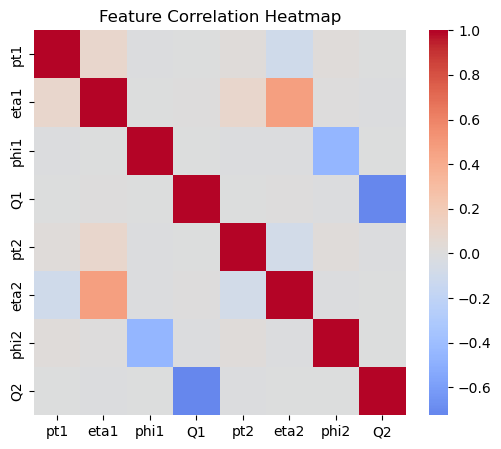

In [12]:
# Correlation matrix
correlation_matrix = X.corr()
# Correlation heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(correlation_matrix, cmap='coolwarm', center=0)
plt.title('Feature Correlation Heatmap')
plt.show()

Notice there is s slight correlation between `Q1` and `Q2`. We may take it into consideration if we had to classify our data, bit for the main goal (i.e., generation), correlation coeffiecients are of little use.

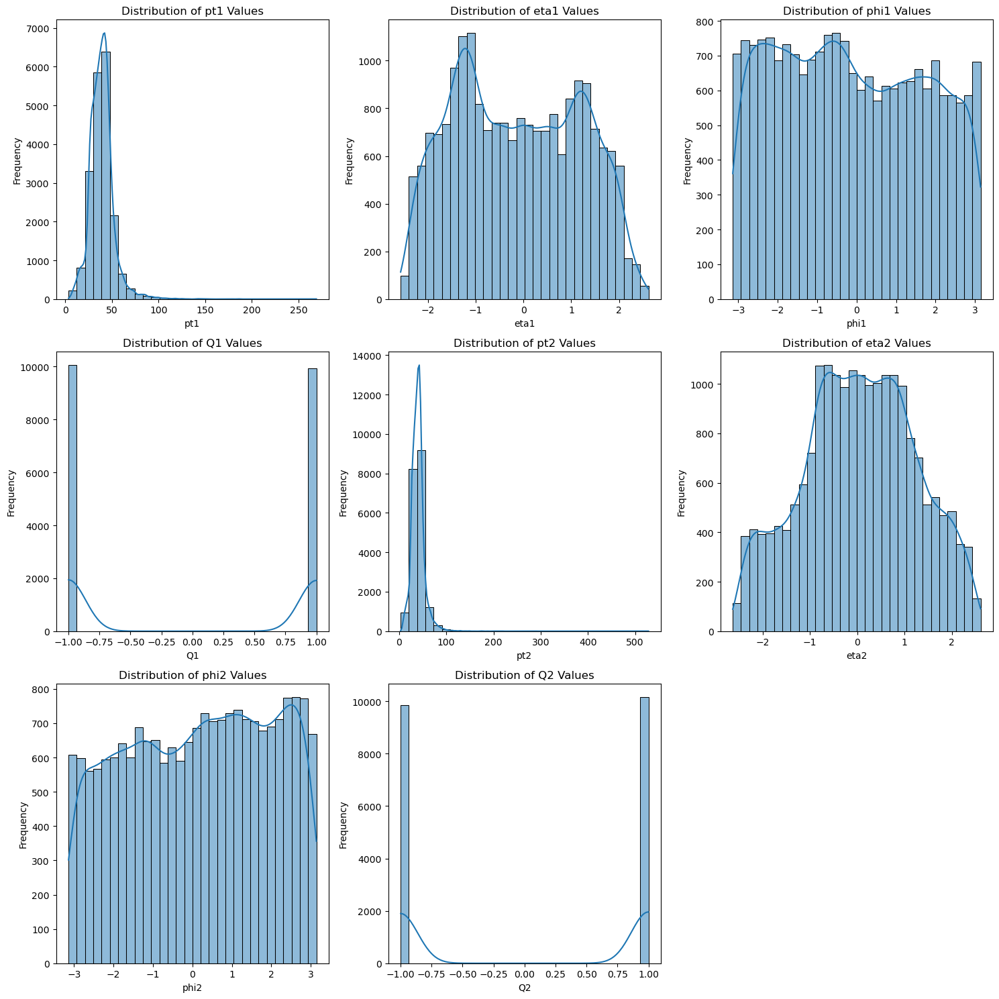

In [13]:
# Histogram of features values in a single multiplot
num_columns = len(X.columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + (num_columns % 3 > 0), ncols=3, figsize=(15, 5 * ((num_columns // 3) + (num_columns % 3 > 0))))

axes = axes.flatten()

for i, col in enumerate(X.columns):
    sns.histplot(df[col], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f'Distribution of {col} Values')
    axes[i].set_xlabel(f'{col}')
    axes[i].set_ylabel('Frequency')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

It is very important to notice that `Q1` and `Q2` only take on $\pm 1$ values. To preserve this characteristic and have the best possible training data, we will not apply any transformation to these features.

In [14]:
# Outlier detection using IQR
Q1 = X.quantile(0.25)
Q3 = X.quantile(0.75)
IQR = Q3 - Q1
outliers = ((X < (Q1 - 1.5 * IQR)) | (X > (Q3 + 1.5 * IQR))).sum()
outliers

pt1     706
eta1      0
phi1      0
Q1        0
pt2     829
eta2      0
phi2      0
Q2        0
dtype: int64

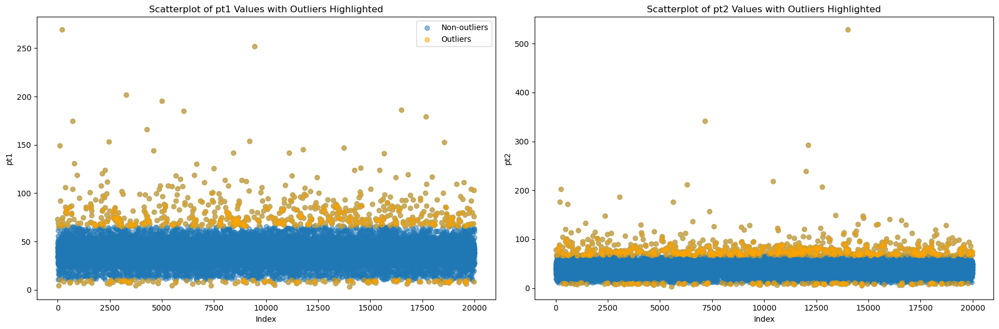

In [15]:
# Scatterplots for Event, pt1, and pt2 with outliers highlighted
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=False)

columns = ['pt1', 'pt2']
for i, col in enumerate(columns):
    # Identify outliers based on IQR
    outlier_indices = ((df[col] < (Q1[col] - 1.5 * IQR[col])) | 
                       (df[col] > (Q3[col] + 1.5 * IQR[col])))
    
    # Plot all points
    axes[i].scatter(df.index, df[col], label='Non-outliers', alpha=0.5)
    
    # Highlight outliers
    axes[i].scatter(df.index[outlier_indices], df[col][outlier_indices], color='orange', label='Outliers', alpha=0.5)
    
    axes[i].set_title(f'Scatterplot of {col} Values with Outliers Highlighted')
    axes[i].set_xlabel('Index')
    axes[i].set_ylabel(col)

axes[0].legend()  # Add legend to the first subplot
plt.tight_layout()
plt.show()

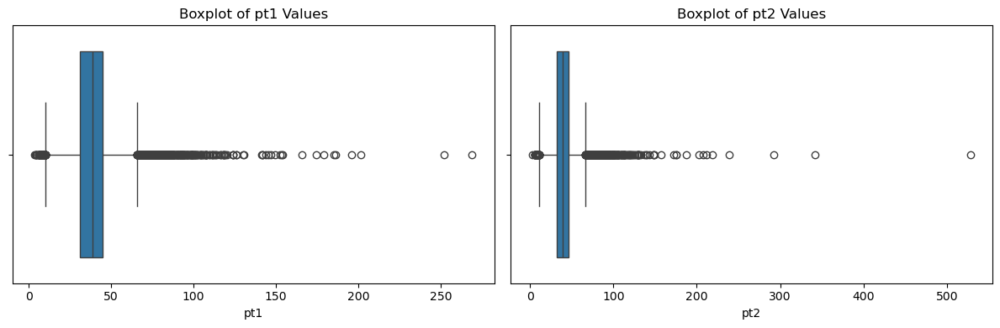

In [16]:
# Boxplot of outliers values
fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

columns = ['pt1', 'pt2']
for i, col in enumerate(columns):
    sns.boxplot(x=df[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col} Values')
    axes[i].set_xlabel(f'{col}')

plt.tight_layout()
plt.show()

In [17]:
# Outlier detection using Z-score
from scipy.stats import zscore
z_scores = np.abs(zscore(X))
outliers_z = (z_scores > 3).sum(axis=0)
outliers_z

pt1     269
eta1      0
phi1      0
Q1        0
pt2     227
eta2      0
phi2      0
Q2        0
dtype: int64

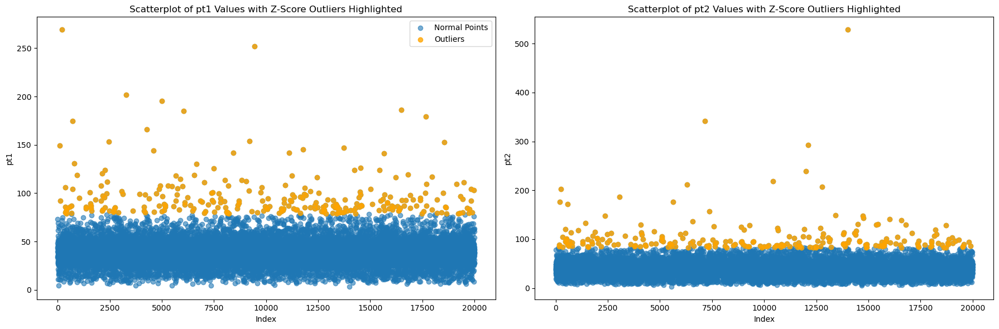

In [18]:
# Scatterplots for Event, pt1, and pt2 with Z-score outliers highlighted
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=False)

# Convert z_scores to a DataFrame for easier indexing
z_scores_df = pd.DataFrame(z_scores, columns=X.columns)

columns = ['pt1', 'pt2']
for i, col in enumerate(columns):
    # Identify outliers based on Z-score
    outlier_indices = z_scores_df[col] > 3
    
    # Plot all points
    axes[i].scatter(df.index, df[col], label='Normal Points', alpha=0.6)
    
    # Highlight outliers
    axes[i].scatter(df.index[outlier_indices], df[col][outlier_indices], color='orange', label='Outliers', alpha=0.8)
    
    axes[i].set_title(f'Scatterplot of {col} Values with Z-Score Outliers Highlighted')
    axes[i].set_xlabel('Index')
    axes[i].set_ylabel(col)

axes[0].legend()  # Add legend to the first subplot
plt.tight_layout()
plt.show()

Notice how there are some significant outliers for the features `pt1` and `pt2`. We will properly deal with them in the final paragraph of EDA, when performing the final preprocessing to get the ultimate training datasets.

In [19]:
# Sparsity
sparsity = (X == 0).sum() / len(df)
sparsity

pt1     0.00000
eta1    0.00005
phi1    0.00000
Q1      0.00000
pt2     0.00000
eta2    0.00000
phi2    0.00000
Q2      0.00000
dtype: float64

In [20]:
# Distribution and skewness
skewness = X.skew(numeric_only=True)
skewness

pt1     2.187370
eta1    0.085726
phi1    0.099141
Q1      0.011601
pt2     4.443899
eta2   -0.079096
phi2   -0.102844
Q2     -0.031006
dtype: float64

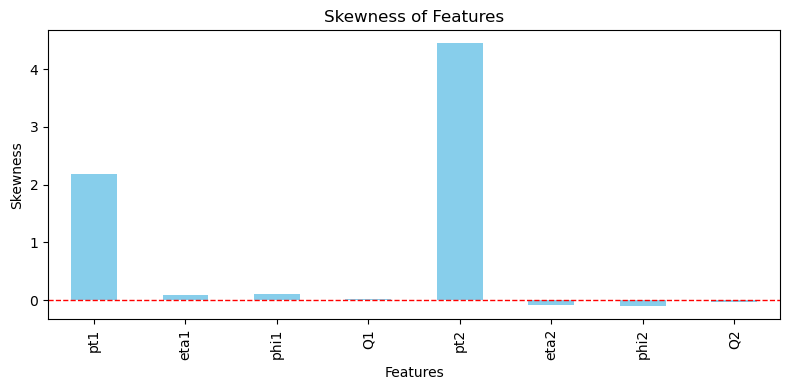

In [21]:
# Plot skewness
plt.figure(figsize=(8, 4))
skewness.plot(kind='bar', color='skyblue') # type: ignore
plt.title('Skewness of Features')
plt.xlabel('Features')
plt.ylabel('Skewness')
plt.axhline(0, color='red', linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()

Skewness is high for `pt1` and `pt2`. To properly reduce it, we will apply a logarithmic transformation to these features, as it is the most widely used method to deal wiht this issue.

In [22]:
# Data transformations
# Let's log-transform skewed features (where skewness > 1 or < -1)
highly_skewed = skewness[abs(skewness) > 1].index
df_log_transformed = X.copy()
for col in highly_skewed:
    if (X[col] > 0).all():
        df_log_transformed[col] = np.log1p(X[col])
    else:
        df_log_transformed[col] = X[col]  # log1p cannot be applied to non-positive values

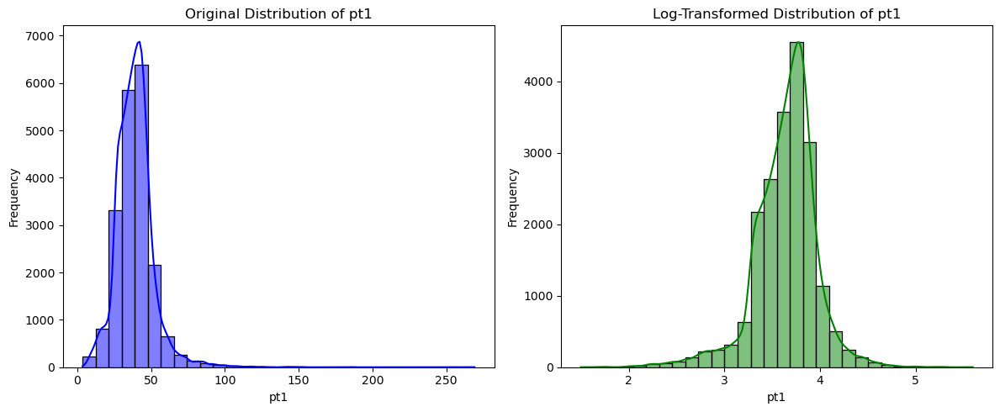

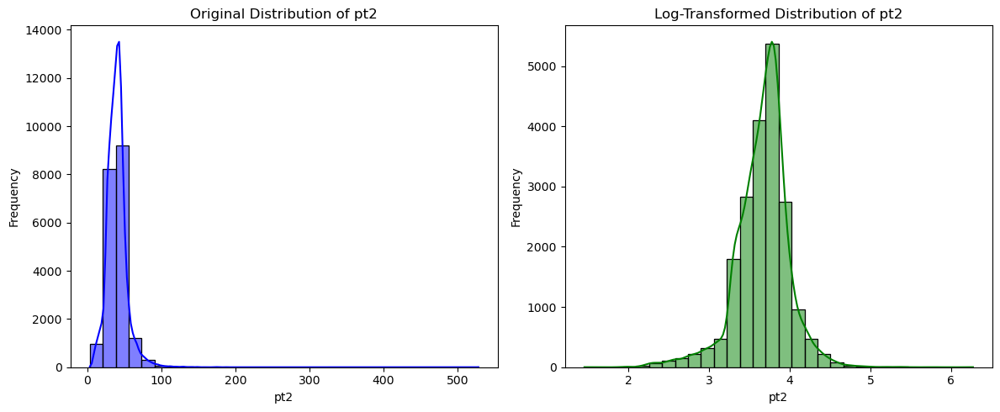

In [23]:
# Plot original vs log-transformed data for highly skewed features
for col in highly_skewed:
    plt.figure(figsize=(12, 5))
    
    # Original data
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], kde=True, bins=30, color='blue')
    plt.title(f'Original Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    
    # Log-transformed data
    plt.subplot(1, 2, 2)
    sns.histplot(df_log_transformed[col], kde=True, bins=30, color='green')
    plt.title(f'Log-Transformed Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

In summary, the final preprocessing we apply to the dataset is the following.

Notice that, when creating training datasets in the next paragraph, we will also apply outliers deletion, as suggested by our previois analysis.

Also, notice that in the file PreprocessingPipeline.py, we have defined a function which allows to reverse all these transormations, so that once synthetic data are generated, we can map them into physically relevant values (i.e., not subject to any normalization).

In [24]:
### Normalization with ColumnTransformer excluding Q1/Q2

original_columns = ['pt1', 'eta1','phi1', 'Q1', 'pt2', 'eta2','phi2', 'Q2']

# 1. Define columns to scale (exclude Q1/Q2)
numeric_features = ['pt1', 'eta1','phi1', 'pt2', 'eta2','phi2']
passthrough_features = ['Q1', 'Q2']

# 2. Create ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), numeric_features),  # Scale numeric features
        ('passthrough', 'passthrough', passthrough_features)  # Keep Q1/Q2 unchanged
    ],
    remainder='drop'  # Drop any unmentioned columns (if they exist)
)

# 3. Fit on training data and transform the dataset
df_normalized = preprocessor.fit_transform(df_log_transformed)

# 4. Get transformed column names (with prefixes like 'scaler_' and 'passthrough_')
transformed_columns = preprocessor.get_feature_names_out()

# 5. Clean column names by removing transformer prefixes
clean_columns = [col.split('__')[-1] for col in transformed_columns]

# 6. Convert scaled arrays back to DataFrames with cleaned column names
df_normalized = pd.DataFrame(df_normalized, columns=clean_columns)

# 7. Reorder columns to match the original order
df_normalized = df_normalized[original_columns]

# Verify results
print("Training set columns:", df_normalized.columns.tolist())
print("Training set scaled example:\n", df_normalized.head(1))
print("\nQ1/Q2 values remain unchanged:\n", df_normalized[['Q1', 'Q2']].head(1))

Training set columns: ['pt1', 'eta1', 'phi1', 'Q1', 'pt2', 'eta2', 'phi2', 'Q2']
Training set scaled example:
         pt1      eta1      phi1   Q1       pt2      eta2     phi2   Q2
0  0.431414 -0.917625 -1.588509 -1.0  0.322261 -0.594206  0.11575  1.0

Q1/Q2 values remain unchanged:
     Q1   Q2
0 -1.0  1.0


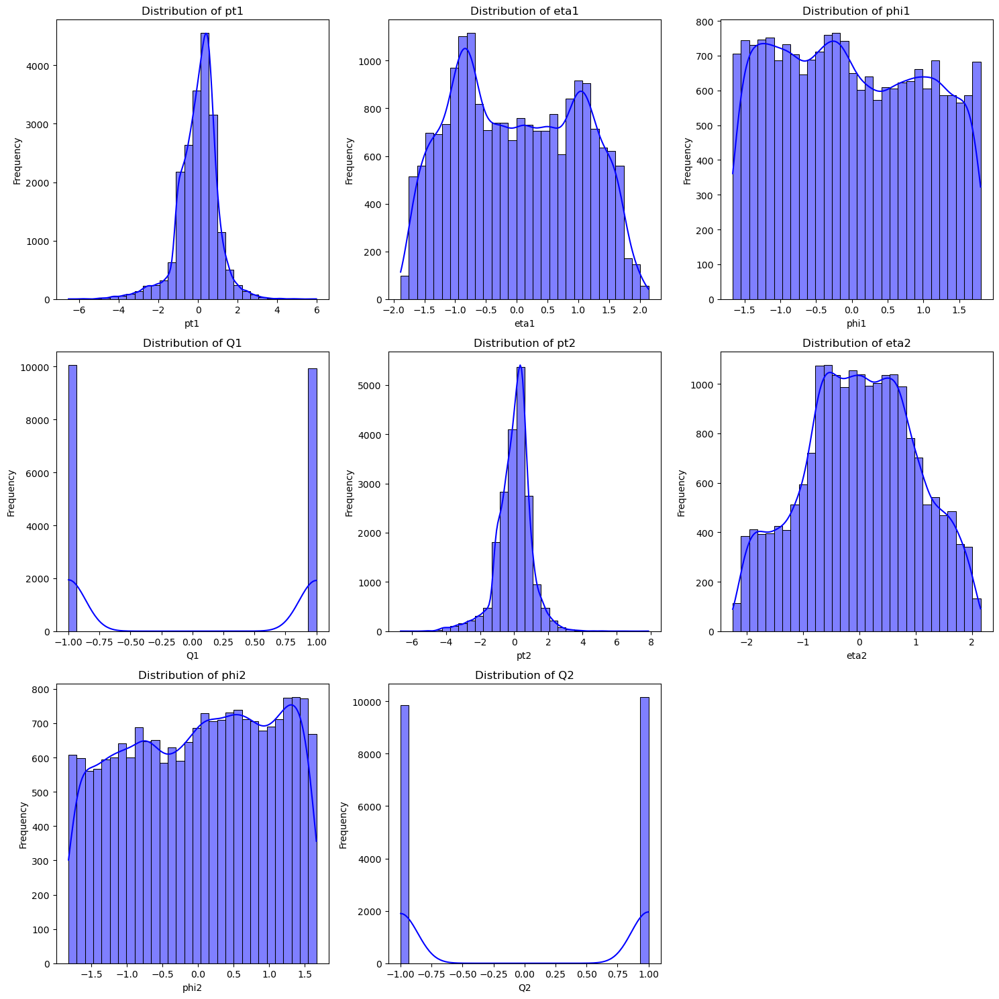

In [25]:
# Distribution plots for each column in a single multiplot
fig, axes = plt.subplots(nrows=(num_columns // 3) + (num_columns % 3 > 0), ncols=3, figsize=(15, 5 * ((num_columns // 3) + (num_columns % 3 > 0))))

axes = axes.flatten()  # Flatten axes for easy iteration

for i, column in enumerate(df_normalized.columns): # type: ignore
    sns.histplot(df_normalized[column], kde=True, bins=30, color='blue', ax=axes[i]) # type: ignore
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

#### **Final Preprocessing on Zmumu**

Finally, we will create our ultimate training datasets for Z-to-muons and and Z-to-electrons decays. 

In [26]:
# 1. Delete irrelevant features
X_zmumu = df_zmumu.drop(columns=['Event', 'Run'])

# 2. Log-transform highly skewed features
for col in ['pt1', 'pt2']:
    if (X_zmumu[col] > 0).all():
        X_zmumu[col] = np.log1p(X[col])
    else:
        X_zmumu[col] = X[col]
        
# 3. Remove outliers detected using z-score statistics
z_scores_zmumu = np.abs(zscore(X_zmumu[['pt1', 'pt2']]))
mask_zmumu = (z_scores_zmumu < 3).all(axis=1)
X_zmumu = X_zmumu[mask_zmumu]
        
# 4. Apply StandardScaler to the features apart from 'Q1' and 'Q2' (same process as above)
original_columns = ['pt1', 'eta1','phi1', 'Q1', 'pt2', 'eta2','phi2', 'Q2']
numeric_features = ['pt1', 'eta1','phi1', 'pt2', 'eta2','phi2']
passthrough_features = ['Q1', 'Q2']
preprocessor = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), numeric_features),  # Scale numeric features
        ('passthrough', 'passthrough', passthrough_features)  # Keep Q1/Q2 unchanged
    ],
    remainder='drop'  # Drop any unmentioned columns (if they exist)
)
X_zmumu = preprocessor.fit_transform(X_zmumu)
transformed_columns = preprocessor.get_feature_names_out()
clean_columns = [col.split('__')[-1] for col in transformed_columns]
X_zmumu = pd.DataFrame(X_zmumu, columns=clean_columns)
X_zmumu = X_zmumu[original_columns]

# 5. Verify results
print("Training set columns:", X_zmumu.columns.tolist())
print("Training set scaled example:\n", X_zmumu.head(1))
print("\nQ1/Q2 values remain unchanged:\n", X_zmumu[['Q1', 'Q2']].head(1))

Training set columns: ['pt1', 'eta1', 'phi1', 'Q1', 'pt2', 'eta2', 'phi2', 'Q2']
Training set scaled example:
         pt1      eta1      phi1   Q1       pt2      eta2      phi2   Q2
0  0.456044 -0.799097 -1.533351 -1.0  0.408334 -0.834963  0.053264  1.0

Q1/Q2 values remain unchanged:
     Q1   Q2
0 -1.0  1.0


In [27]:
# Save the transformed dataset
X_zmumu.to_csv('X_zmumu_transformed.csv', index=False)

Let's save the scaler used above, so that we will be able to apply the function which inverts all the transofrmations we have applied to the dataset, ensuring they act on the transformed columns only.

In [28]:
# Extract the fitted StandardScaler
scaler_zmumu = preprocessor.named_transformers_['scaler']
# Save scaler
joblib.dump(scaler_zmumu, 'scaler_zmumu.pkl')

# Check inversion function
X_zmumu_unscaled = invert_preprocessing(X_zmumu, scaler=scaler_zmumu)
X_zmumu_unscaled.head()

,pt1,pt2,eta1,phi1,eta2,phi2,Q1,Q2
0,42.9130,42.2897,-1.3248,-3.0057,-0.6624,0.3485,-1.0,1.0
1,43.9826,29.7856,0.4276,-0.3876,-0.3080,2.8965,-1.0,1.0
2,48.5155,43.6595,1.2482,2.7103,1.0228,-0.4599,-1.0,1.0
3,34.4852,52.6337,-1.9857,-2.1341,-1.2483,1.1644,-1.0,1.0
4,39.2777,44.2962,-2.2333,-0.0188,-1.0700,-2.5902,1.0,-1.0


#### **Final preprocessing on Zee**

In [29]:
# 1. Delete irrelevant features
X_zee = df_zee.drop(columns=['Event', 'Run'])

# 2. Log-transform highly skewed features
for col in ['pt1', 'pt2']:
    if (X_zee[col] > 0).all():
        X_zee[col] = np.log1p(X[col])
    else:
        X_zee[col] = X[col]
        
# 3. Remove outliers detected using z-score statistics
z_scores_zee = np.abs(zscore(X_zee[['pt1', 'pt2']]))
mask_zee = (z_scores_zee < 3).all(axis=1)
X_zee = X_zee[mask_zee]
        
# 4. Apply StandardScaler to the features apart from 'Q1' and 'Q2' (same process as above)
original_columns = ['pt1', 'eta1','phi1', 'Q1', 'pt2', 'eta2','phi2', 'Q2']
numeric_features = ['pt1', 'eta1','phi1', 'pt2', 'eta2','phi2']
passthrough_features = ['Q1', 'Q2']
preprocessor = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), numeric_features),  # Scale numeric features
        ('passthrough', 'passthrough', passthrough_features)  # Keep Q1/Q2 unchanged
    ],
    remainder='drop'  # Drop any unmentioned columns (if they exist)
)
X_zee = preprocessor.fit_transform(X_zee)
transformed_columns = preprocessor.get_feature_names_out()
clean_columns = [col.split('__')[-1] for col in transformed_columns]
X_zee = pd.DataFrame(X_zee, columns=clean_columns)
X_zee = X_zee[original_columns]

# 5. Verify results
print("Training set columns:", X_zee.columns.tolist())
print("Training set scaled example:\n", X_zee.head(1))
print("\nQ1/Q2 values remain unchanged:\n", X_zee[['Q1', 'Q2']].head(1))

Training set columns: ['pt1', 'eta1', 'phi1', 'Q1', 'pt2', 'eta2', 'phi2', 'Q2']
Training set scaled example:
         pt1      eta1      phi1   Q1       pt2      eta2      phi2   Q2
0  0.177194 -0.001386 -0.419895 -1.0 -0.351921  0.946419  1.248808  1.0

Q1/Q2 values remain unchanged:
     Q1   Q2
0 -1.0  1.0


In [30]:
# Save the transformed dataset
X_zee.to_csv('X_zee_transformed.csv', index=False)

In [31]:
# Extract the fitted StandardScaler
scaler_zee = preprocessor.named_transformers_['scaler']
# Save scaler
joblib.dump(scaler_zee, 'scaler_zee.pkl')

# Check inversion function
X_zee_unscaled = invert_preprocessing(X_zee, scaler=scaler_zee)
X_zee_unscaled.head()

,pt1,pt2,eta1,phi1,eta2,phi2,Q1,Q2
0,39.8744,36.3997,-0.0057,-0.7744,1.3710,2.2952,-1.0,1.0
1,72.9296,39.5410,-0.4162,0.9198,-0.2680,-1.4629,1.0,1.0
2,33.4436,27.2395,0.3063,-1.6034,-1.6182,1.5315,1.0,-1.0
3,55.5556,48.4521,0.0370,-2.3322,-0.3894,1.9503,1.0,-1.0
4,33.6161,36.9423,1.4014,-1.0681,-0.2119,1.7081,-1.0,1.0


## **3. UNSUPERVISED LEARNING (dimensionality reduction; clustering)**

In this section we have exploited dimensionality reduction techniques to understand how the dataset is distributed in a smaller feature space (in this case both 2d and 3d).

However this methods didn't seem useul, as the points were clearly not linearly separable and distributed spatially in the same way between the two labels.

In [32]:
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [33]:
# Load the dataset
file_path = "Z_boson.csv"
data = pd.read_csv(file_path)
# Display the first few rows of the dataset
data.head()

,Unnamed: 0,Run,Event,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,0,166784,20257329,42.9130,-1.3248,-3.0057,-1,42.2897,-0.6624,0.3485,1,Zmumu
1,1,163261,64679856,39.8744,-0.0057,-0.7744,-1,36.3997,1.3710,2.2952,1,Zee
2,2,165570,196860468,72.9296,-0.4162,0.9198,1,39.5410,-0.2680,-1.4629,1,Zee
3,3,172163,497791581,33.4436,0.3063,-1.6034,1,27.2395,-1.6182,1.5315,-1,Zee
4,4,173692,550966077,43.9826,0.4276,-0.3876,-1,29.7856,-0.3080,2.8965,1,Zmumu


In [34]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
data['class'] = le.fit_transform(data['class'])
data.head()

#ZMUMU is class 1
#ZEE is class 0

,Unnamed: 0,Run,Event,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,0,166784,20257329,42.9130,-1.3248,-3.0057,-1,42.2897,-0.6624,0.3485,1,1
1,1,163261,64679856,39.8744,-0.0057,-0.7744,-1,36.3997,1.3710,2.2952,1,0
2,2,165570,196860468,72.9296,-0.4162,0.9198,1,39.5410,-0.2680,-1.4629,1,0
3,3,172163,497791581,33.4436,0.3063,-1.6034,1,27.2395,-1.6182,1.5315,-1,0
4,4,173692,550966077,43.9826,0.4276,-0.3876,-1,29.7856,-0.3080,2.8965,1,1


In [35]:
#i want to drop the column 'Event' and 'Run'
no_id_data = data.drop(columns=['Event', 'Run', "Unnamed: 0"])
# Display the first few rows of the dataset
no_id_data.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,42.9130,-1.3248,-3.0057,-1,42.2897,-0.6624,0.3485,1,1
1,39.8744,-0.0057,-0.7744,-1,36.3997,1.3710,2.2952,1,0
2,72.9296,-0.4162,0.9198,1,39.5410,-0.2680,-1.4629,1,0
3,33.4436,0.3063,-1.6034,1,27.2395,-1.6182,1.5315,-1,0
4,43.9826,0.4276,-0.3876,-1,29.7856,-0.3080,2.8965,1,1


In [36]:
# Check for missing values
missing_values = no_id_data.isnull().sum()
print("Missing values in each column:")
print(missing_values)

Missing values in each column:
pt1      0
eta1     0
phi1     0
Q1       0
pt2      0
eta2     0
phi2     0
Q2       0
class    0
dtype: int64


In [37]:
#check for duplicates
duplicates = no_id_data.duplicated().sum()
print("Number of duplicate rows:", duplicates)
# Drop duplicates if any
if duplicates > 0:
    no_id_data = no_id_data.drop_duplicates()
    print("Duplicates dropped.")
else:
    print("No duplicates found.")

Number of duplicate rows: 0
No duplicates found.


### **DIMENSIONALITY REDUCTION (PCA; T-SNE; UMAP)**

In [38]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap


In [39]:
# Standardize the data
# Split the data into features and target variable
features = no_id_data.drop(columns=['class'])
target = no_id_data['class']
# Standardize the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

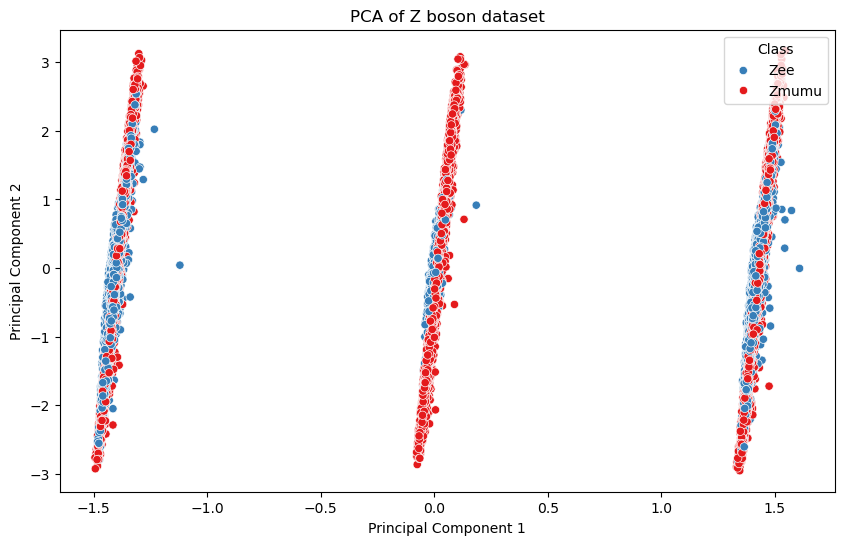

In [40]:
# Perform PCA
pca = PCA(n_components=2)

features_pca = pca.fit_transform(features_scaled)
# Create a DataFrame with PCA components
pca_df = pd.DataFrame(data=features_pca, columns=['PC1', 'PC2'])
# Add the target variable to the PCA DataFrame
pca_df['class'] = target.values
# Plot the PCA results
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='class', palette='Set1')
plt.title('PCA of Z boson dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
legend_labels = ['Zee', 'Zmumu']
plt.legend(labels=legend_labels, title='Class', loc='upper right')
plt.show()


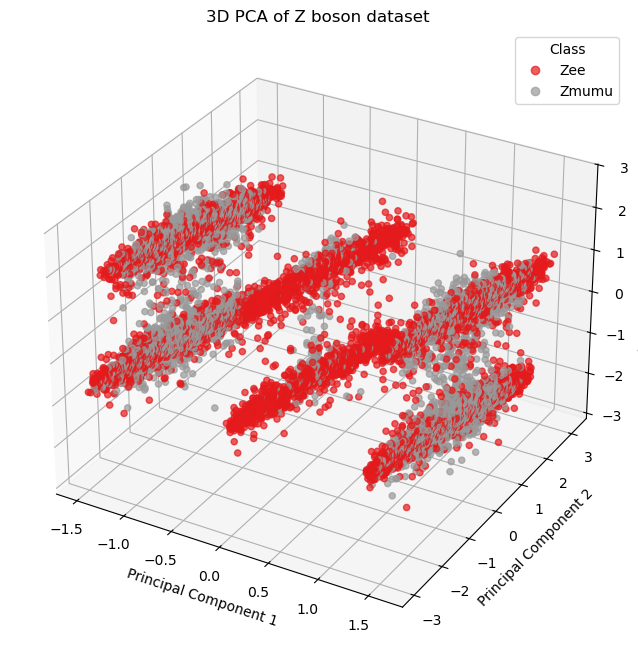

In [41]:
# Perform PCA with 3 components
pca = PCA(n_components=3)
features_pca_3d = pca.fit_transform(features_scaled)

# Create a DataFrame with PCA components
pca_df_3d = pd.DataFrame(data=features_pca_3d, columns=['PC1', 'PC2', 'PC3'])
pca_df_3d['class'] = target.values

# Plot the 3D PCA results
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    pca_df_3d['PC1'],
    pca_df_3d['PC2'],
    pca_df_3d['PC3'],
    c=pca_df_3d['class'],
    cmap='Set1',
    alpha=0.7
)

# Customize the plot
ax.set_title('3D PCA of Z boson dataset')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
legend_labels = ['Zee', 'Zmumu']
legend = ax.legend(handles=scatter.legend_elements()[0], labels=legend_labels, title='Class')

# Show plot
plt.show()


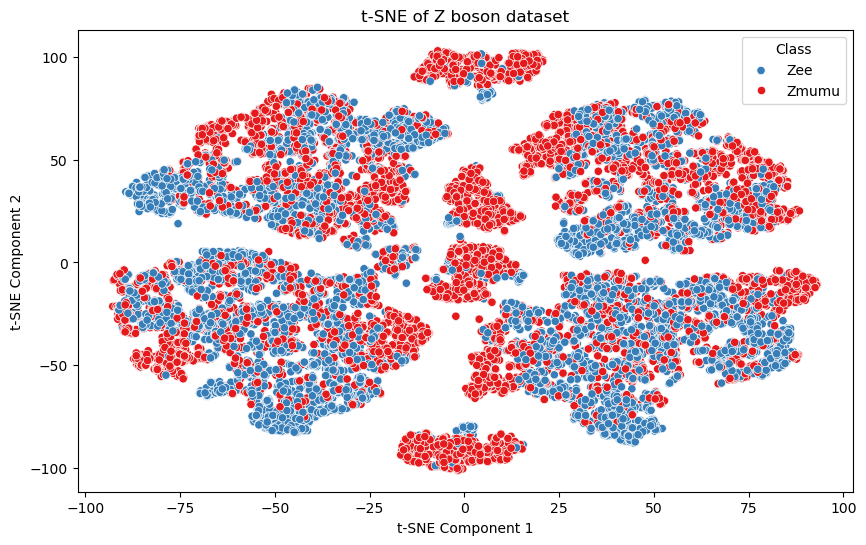

In [42]:
# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(features_scaled)
# Create a DataFrame with t-SNE components
tsne_df = pd.DataFrame(data=features_tsne, columns=['t-SNE1', 't-SNE2'])
# Add the target variable to the t-SNE DataFrame
tsne_df['class'] = target.values
# Plot the t-SNE results
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df, x='t-SNE1', y='t-SNE2', hue='class', palette='Set1')
plt.title('t-SNE of Z boson dataset')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
legend_labels = ['Zee', 'Zmumu']
plt.legend(labels=legend_labels, title='Class', loc='upper right')
plt.show()


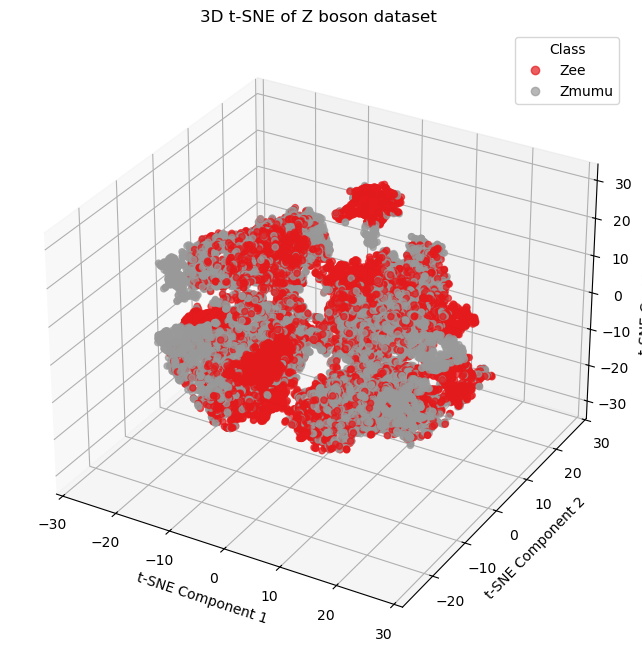

In [43]:
# Perform t-SNE
tsne = TSNE(n_components=3, random_state=42)
features_tsne_3d = tsne.fit_transform(features_scaled)
# Create a DataFrame with t-SNE components
tsne_df_3d = pd.DataFrame(data=features_tsne_3d, columns=['t-SNE1', 't-SNE2', 't-SNE3'])
# Add the target variable to the t-SNE DataFrame
tsne_df_3d['class'] = target.values
# Plot the t-SNE results in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
# Scatter plot
ax.scatter(
    tsne_df_3d['t-SNE1'],
    tsne_df_3d['t-SNE2'],
    tsne_df_3d['t-SNE3'],
    c=tsne_df_3d['class'],
    cmap='Set1',
    alpha=0.7
)
# Customize the plot
ax.set_title('3D t-SNE of Z boson dataset')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')
legend_labels = ['Zee', 'Zmumu']
legend = ax.legend(handles=scatter.legend_elements()[0], labels=legend_labels, title='Class')
# Show plot
plt.show()


c:\Users\tommy\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


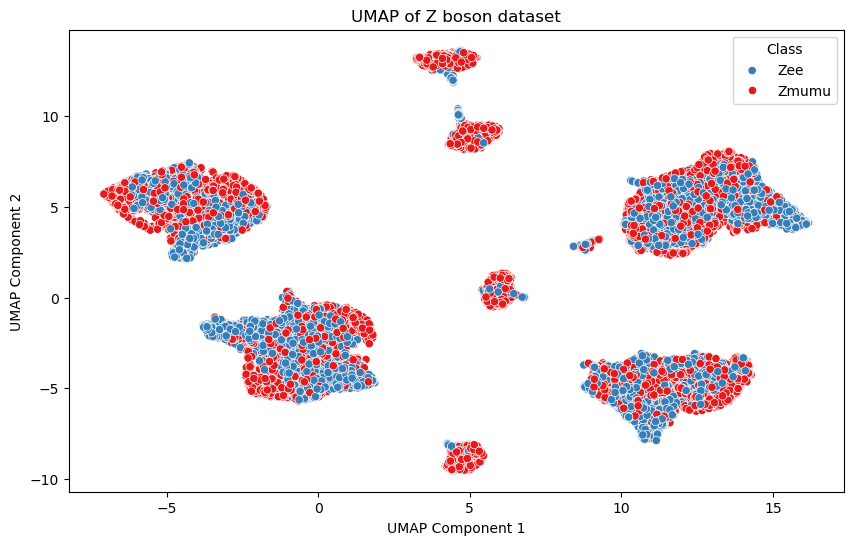

In [44]:
umap_model = umap.UMAP(n_components=2, random_state=42)
features_umap = umap_model.fit_transform(features_scaled)

# Create a DataFrame with UMAP results
umap_df = pd.DataFrame(data=features_umap, columns=['UMAP1', 'UMAP2'])
umap_df['class'] = target.values

# Plot the UMAP results
plt.figure(figsize=(10, 6))
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='class', palette='Set1')
plt.title('UMAP of Z boson dataset')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.legend(title='Class', labels=['Zee', 'Zmumu'])
plt.show()


c:\Users\tommy\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


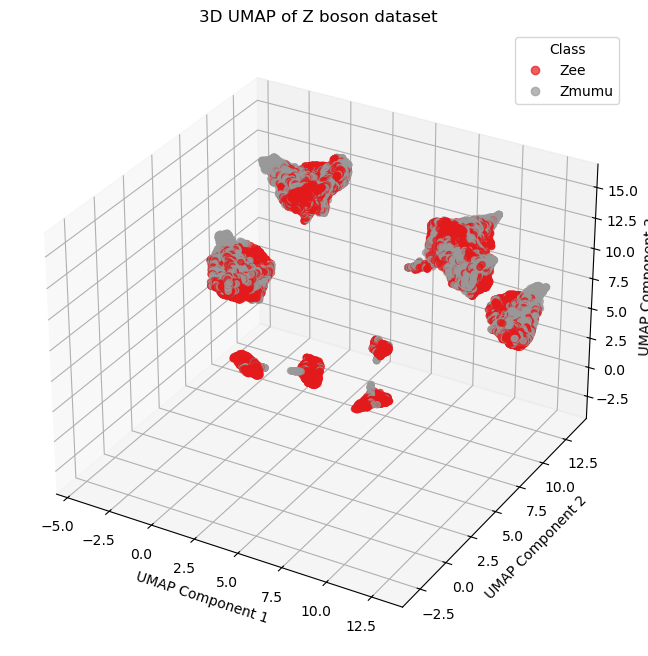

In [45]:
# Perform UMAP
umap_model = umap.UMAP(n_components=3, random_state=42)
features_umap_3d = umap_model.fit_transform(features_scaled)
# Create a DataFrame with UMAP results
umap_df_3d = pd.DataFrame(data=features_umap_3d, columns=['UMAP1', 'UMAP2', 'UMAP3'])
umap_df_3d['class'] = target.values
# Plot the UMAP results in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
# Scatter plot
ax.scatter(
    umap_df_3d['UMAP1'],
    umap_df_3d['UMAP2'],
    umap_df_3d['UMAP3'],
    c=umap_df_3d['class'],
    cmap='Set1',
    alpha=0.7
)
# Customize the plot
ax.set_title('3D UMAP of Z boson dataset')
ax.set_xlabel('UMAP Component 1')
ax.set_ylabel('UMAP Component 2')
ax.set_zlabel('UMAP Component 3')
legend_labels = ['Zee', 'Zmumu']
legend = ax.legend(handles=scatter.legend_elements()[0], labels=legend_labels, title='Class')
# Show plot
plt.show()

### **CLUSTERING (Spectral, Hierarchical)**

We chose to not use k-means clustering as it would perform well with spherical well-separated clusters that develop around a centroid.

 Dimensionality reduction techinques show that this is not the case and k-means clustering would not perform well.

In [46]:
from sklearn.cluster import SpectralClustering, AgglomerativeClustering
from sklearn.metrics import silhouette_score

Silhouette Score: 0.20


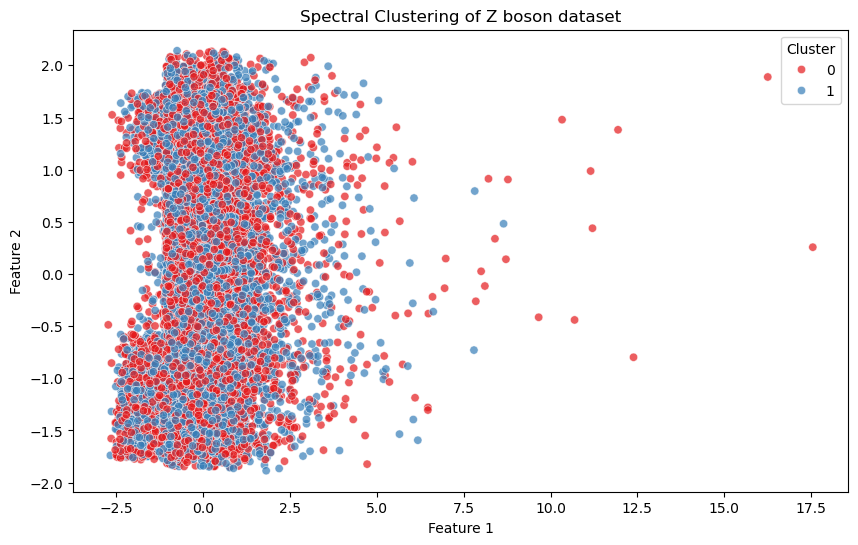

In [47]:
# Perform spectral clustering
n_clusters = 2
spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
# Fit the model
clusters = spectral_clustering.fit_predict(features_scaled)
# Calculate silhouette score
silhouette_avg = silhouette_score(features_scaled, clusters)
print(f'Silhouette Score: {silhouette_avg:.2f}')
# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x=features_scaled[:, 0], y=features_scaled[:, 1], hue=clusters, palette='Set1', alpha=0.7)
plt.title('Spectral Clustering of Z boson dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend(title='Cluster')
plt.show()


Silhouette Score: 0.20


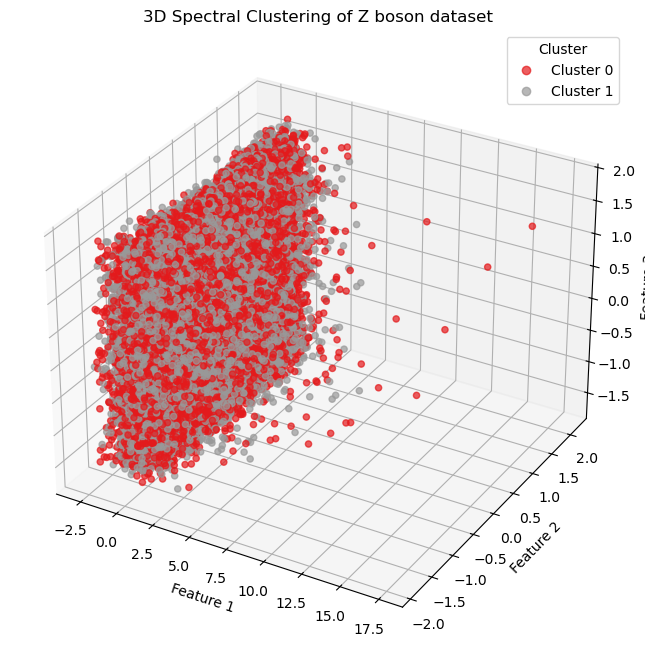

In [48]:
# Perform 3D spectral clustering
n_clusters = 2
spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
# Fit the model
clusters = spectral_clustering.fit_predict(features_scaled)
# Calculate silhouette score
silhouette_avg = silhouette_score(features_scaled, clusters)
print(f'Silhouette Score: {silhouette_avg:.2f}')
# Plot the clusters in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
ax.scatter(
    features_scaled[:, 0],
    features_scaled[:, 1],
    features_scaled[:, 2],
    c=clusters,
    cmap='Set1',
    alpha=0.7
)
ax.set_title('3D Spectral Clustering of Z boson dataset')
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')
legend_labels = ['Cluster 0', 'Cluster 1']
legend = ax.legend(handles=scatter.legend_elements()[0], labels=legend_labels, title='Cluster')
plt.show()


Silhouette Score: 0.20


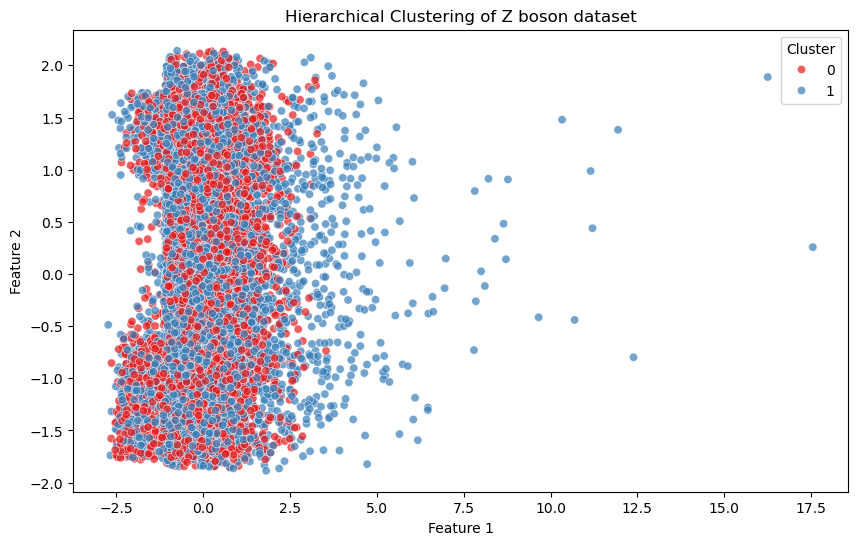

In [49]:
# Perform hierarchical clustering
n_clusters = 2
hierarchical_clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
# Fit the model
clusters = hierarchical_clustering.fit_predict(features_scaled)
# Calculate silhouette score
silhouette_avg = silhouette_score(features_scaled, clusters)
print(f'Silhouette Score: {silhouette_avg:.2f}')
# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x=features_scaled[:, 0], y=features_scaled[:, 1], hue=clusters, palette='Set1', alpha=0.7)
plt.title('Hierarchical Clustering of Z boson dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend(title='Cluster')
plt.show()

Silhouette Score: 0.20


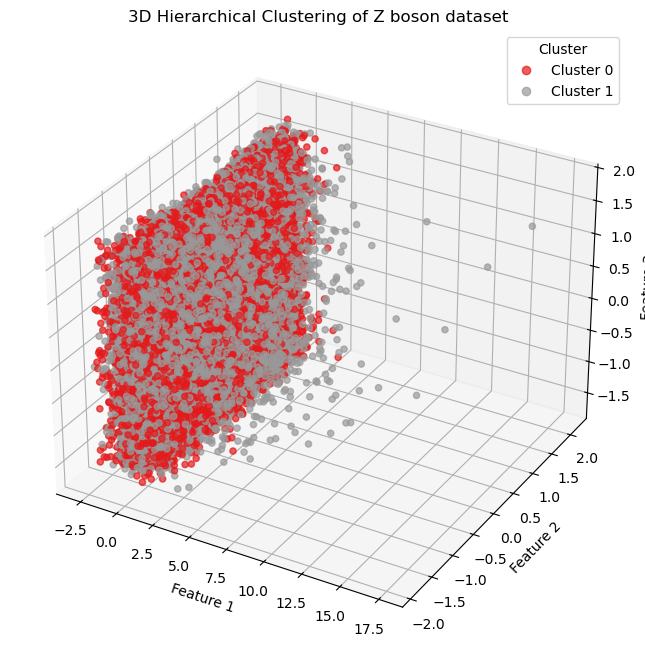

In [50]:
# 3D Hierarchical Clustering
# Perform hierarchical clustering
n_clusters = 2
hierarchical_clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
# Fit the model
clusters = hierarchical_clustering.fit_predict(features_scaled)
# Calculate silhouette score
silhouette_avg = silhouette_score(features_scaled, clusters)
print(f'Silhouette Score: {silhouette_avg:.2f}')
# Plot the clusters in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
# Scatter plot
ax.scatter(
    features_scaled[:, 0],
    features_scaled[:, 1],
    features_scaled[:, 2],
    c=clusters,
    cmap='Set1',
    alpha=0.7
)
ax.set_title('3D Hierarchical Clustering of Z boson dataset')
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')
legend_labels = ['Cluster 0', 'Cluster 1']
legend = ax.legend(handles=scatter.legend_elements()[0], labels=legend_labels, title='Cluster')
plt.show()

## **4. VARIATIONAL AUTOENCODER MODELS**

### **THEORETICAL OVERVIEW OF VAEs**

A Variational Autoencoder (VAE) is a type of generative model that learns to represent high-dimensional data in a compressed, continuous latent space, and can generate new, similar data samples by sampling from this space.

Unlike standard autoencoders, VAEs are *probabilistic*: they do not map inputs to fixed latent vectors, but instead to a *distribution over latent space* — typically a multivariate Gaussian.

Core components of a VAE are:
- *Encoder* (also called inference network):  
  Maps input data $ \mathbf{x} $ to a distribution over latent variables $ \mathbf{z} $, parameterized by mean $ \mu $ and log-variance $ \log \sigma^2 $:
  $$
  q_\phi(\mathbf{z} | \mathbf{x}) = \mathcal{N}(\mathbf{z}; \mu(\mathbf{x}), \text{diag}(\sigma^2(\mathbf{x}))).
  $$


- *Latent Sampling*:  
  Samples latent code $ \mathbf{z} $ from the learned distribution using the reparameterization trick:
  $$
  \mathbf{z} = \mu + \sigma \odot \epsilon,\quad \epsilon \sim \mathcal{N}(0, I).
  $$


- *Decoder* (or generative network):  
  Maps $ \mathbf{z} $ back to a reconstruction $ \mathbf{\hat{x}} $, modeling:
  $$
  p_\theta(\mathbf{x} | \mathbf{z}).
  $$

The objective is to maximize the *Evidence Lower Bound (ELBO)*:
$$
\mathcal{L}_{VAE} = \mathbb{E}_{q_\phi(\mathbf{z} | \mathbf{x})} [\log p_\theta(\mathbf{x} | \mathbf{z})] - D_{KL}(q_\phi(\mathbf{z} | \mathbf{x}) \| p(\mathbf{z})),
$$

where:

- $ \log p_\theta(\mathbf{x} | \mathbf{z}) $ is the reconstruction loss — often measured as MSE or cross-entropy;
- $ D_{KL} $ is the Kullback–Leibler divergence — regularizes $ q_\phi(\mathbf{z} | \mathbf{x}) $ to stay close to the prior $ p(\mathbf{z}) = \mathcal{N}(0, I) $.

In practice, the total VAE loss is:
$$
\mathcal{L} = \underbrace{\text{Reconstruction Loss}}_{\text{Data fidelity}} + \underbrace{\text{KL Divergence}}_{\text{Latent regularization}}.
$$


In our case:
- The dataset consists of high-dimensional, structured physical measurements (momentum, energy, angles, charge).
- Labels (decay mode) are not used during training.
- We aim at:
  - Capturing the distribution of real Z boson decay events.
  - Generating new synthetic events that look realistic.
  - Exploring the learned latent space to understand the physical structure.

In the VAE implementation code:

- We used a fully connected feedforward VAE implemented in PyTorch.
- The encoder learns $ \mu $ and $ \log \sigma^2 $ from input features.
- The decoder reconstructs features from sampled $ \mathbf{z} $.
- We trained the model using the Adam optimizer and a cosine annealing learning rate scheduler.

As a loss function, we used:

- MSE for continuous features,
- and tried circular MSE for angular features (φ₁ and φ₂) to handle periodicity:
  $$
  \text{CircularError}(\phi_1, \phi_2) = \min\left( |\phi_1 - \phi_2|, 2\pi - |\phi_1 - \phi_2| \right)
  $$

After training, the protocol will be approximately always the following:

1. We sample $ \mathbf{z} \sim \mathcal{N}(0, I) $;
2. Decode it into synthetic features using the decoder;
3. Apply postprocessing to enforce physical constraints (e.g. charge $\in \{\pm 1\}$, valid angles).



In [52]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
from scipy.stats import wasserstein_distance
from scipy.special import rel_entr
from VAE_architecture import *
from PerformanceMeasures import *
from PreprocessingPipeline import Preprocessor
random.seed(42)
prep = Preprocessor(log_transform_threshold=1.0)

In [53]:
X_zmumu = pd.read_csv("X_zmumu_transformed.csv")
X_zee = pd.read_csv("X_zee_transformed.csv")

### **Z → μ⁺μ⁻ DECAY**

We will start modelling the Z-to-muons decay. In particular, the analysis will follow the following process:
1. Train a first general VAE model on X_zmumu and study its performance;
2. Tune the hyperparameters of our model to improve overall performance;
3. Study how our model behaves with certain features and decide whther to act on specific issues;
4. Deal with Q1 and Q2 (VAE outputs continuous quantities instead of $\pm1$);
5. Handle with two different approaches periodic-valued features (with little to no success, unfortunately).

#### **VAEs training**

In [54]:
loader_zmumu = prepare_dataloader(X_zmumu, batch_size=128)

In [55]:
# Initialize VAE (input dimension matches the number of features)
input_dim = X_zmumu.shape[1]
hidden_dim = 128
latent_dim = 10
num_samples = 10000  # How many synthetic events you want
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [56]:
vae_zmumu = VAE(input_dim=input_dim, hidden_dim=hidden_dim, latent_dim=latent_dim)

# Train VAE
device = 'cuda' if torch.cuda.is_available() else 'cpu'
trained_vae_zmumu = train_vae(vae_zmumu, loader_zmumu, epochs=50, lr=1e-3, device=device)

In [57]:
# Generate synthetic samples
with torch.no_grad():
    z = torch.randn(num_samples, latent_dim).to(device)  # Sample latent space
    synthetic_data_zmumu = vae_zmumu.decoder(z)  # Pass through decoder

In [58]:
synthetic_data_zmumu = pd.DataFrame(synthetic_data_zmumu, columns=X_zmumu.columns)

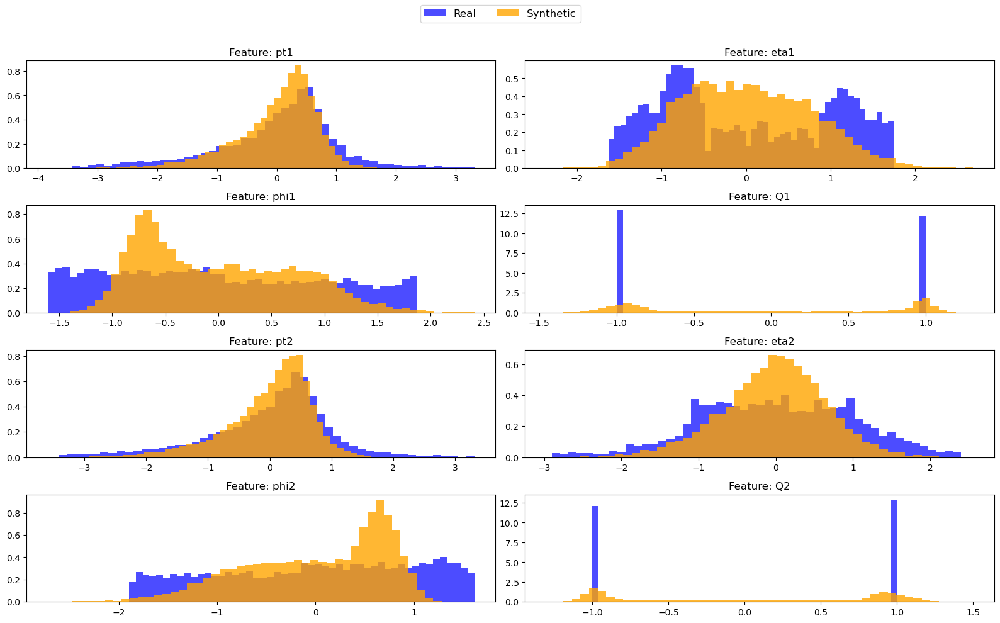

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.231782,0.098328,6.677256e-42,0.159467,0.019980
1,eta1,0.284074,0.161724,6.771227e-113,0.250796,0.063398
2,phi1,0.250215,0.174875,5.040106e-132,0.228191,0.044016
3,Q1,0.264156,0.388336,0.000000e+00,0.304393,0.056050
4,pt2,0.229718,0.101077,2.952678e-44,0.157684,0.019710
5,eta2,0.297021,0.141537,1.732992e-86,0.229227,0.048457
6,phi2,0.268525,0.192760,1.723833e-160,0.241789,0.049377
7,Q2,0.265649,0.389590,0.000000e+00,0.306046,0.056378
8,OVERALL,0.261392,0.206028,NaN,0.234699,0.044671


In [59]:
overall_performance(X_zmumu, synthetic_data_zmumu)

#### **Hyperpameters Tuning**

In [60]:
latent_dim_choices = [4, 8, 16, 32]
batch_size_choices = [64, 128, 256]
hidden_dim_choices = [64, 128, 256]

In [61]:
# Perform grid search for hyperparameter tuning
best_hyperparams_zmumu = grid_search(X_zmumu, latent_dim_choices, batch_size_choices, hidden_dim_choices, device=device)

Trial 1/36: latent_dim=4, batch_size=64, hidden_dim=64 => Score=0.2912
Trial 2/36: latent_dim=4, batch_size=64, hidden_dim=128 => Score=0.2632
Trial 3/36: latent_dim=4, batch_size=64, hidden_dim=256 => Score=0.2312
Trial 4/36: latent_dim=4, batch_size=128, hidden_dim=64 => Score=0.3259
Trial 5/36: latent_dim=4, batch_size=128, hidden_dim=128 => Score=0.2965
Trial 6/36: latent_dim=4, batch_size=128, hidden_dim=256 => Score=0.2537
Trial 7/36: latent_dim=4, batch_size=256, hidden_dim=64 => Score=0.3522
Trial 8/36: latent_dim=4, batch_size=256, hidden_dim=128 => Score=0.3198
Trial 9/36: latent_dim=4, batch_size=256, hidden_dim=256 => Score=0.2748
Trial 10/36: latent_dim=8, batch_size=64, hidden_dim=64 => Score=0.3000
Trial 11/36: latent_dim=8, batch_size=64, hidden_dim=128 => Score=0.2726
Trial 12/36: latent_dim=8, batch_size=64, hidden_dim=256 => Score=0.2682
Trial 13/36: latent_dim=8, batch_size=128, hidden_dim=64 => Score=0.3251
Trial 14/36: latent_dim=8, batch_size=128, hidden_dim=128 

In [62]:
# Train the best model
best_vae_zmumu = VAE(input_dim=input_dim, hidden_dim=best_hyperparams_zmumu[2], latent_dim=best_hyperparams_zmumu[0])
loader_zmumu_best = prepare_dataloader(X_zmumu, batch_size=best_hyperparams_zmumu[1])
trained_vae_best_zmumu = train_vae(best_vae_zmumu, loader_zmumu_best, epochs=50, lr=1e-3, device=device)

In [63]:
best_df_zmumu = generate_synthetic_data(trained_vae_best_zmumu, X_zmumu, num_samples, device=device)
best_df_zmumu.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,0.858097,-1.121653,-0.787999,0.972629,0.165159,-1.967243,0.531082,-0.980504
1,-0.473574,-0.820008,0.589599,-1.017148,-0.186935,0.147447,-0.379581,1.015900
2,-0.018230,-0.168999,1.043505,-0.981560,1.006169,-0.409192,-0.997373,0.958201
3,0.691571,-0.166995,1.325513,-0.146078,0.374525,-0.452867,-0.539920,0.141228
4,-0.684486,1.101536,-0.482132,0.957476,-0.547158,-0.375619,0.793569,-0.974642


In [64]:
print(f'Wasserstein distance for best parameters: {compute_wasserstein_distance(X_zmumu, best_df_zmumu)}.')

Wasserstein distance for best parameters: 0.20086505293663676.


#### **Discretizing Outputs for Q1 and Q2**

By looking at the values of Q1 and Q2 in the real data, we see that they are actually discreet, taking values in $\{-1,1\}$. However, Variational Autoencoders produce continuous noisy outputs around these values.

The most simple (yet widely-used and efficient) solution is to let the VAE produce a first data set with noisy data, and then map the values generated for Q1 and Q2 into $\{-1,1\}$ via the `sign` function. In this section, we will work on the set generated with the best hyperparmeters found before, and then proceed with the binarization *ex post*.

In [65]:
binarized_df_zmumu = Q1Q2_correction(best_df_zmumu)
binarized_df_zmumu.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,0.858097,-1.121653,-0.787999,1.0,0.165159,-1.967243,0.531082,-1.0
1,-0.473574,-0.820008,0.589599,-1.0,-0.186935,0.147447,-0.379581,1.0
2,-0.018230,-0.168999,1.043505,-1.0,1.006169,-0.409192,-0.997373,1.0
3,0.691571,-0.166995,1.325513,-1.0,0.374525,-0.452867,-0.539920,1.0
4,-0.684486,1.101536,-0.482132,1.0,-0.547158,-0.375619,0.793569,-1.0


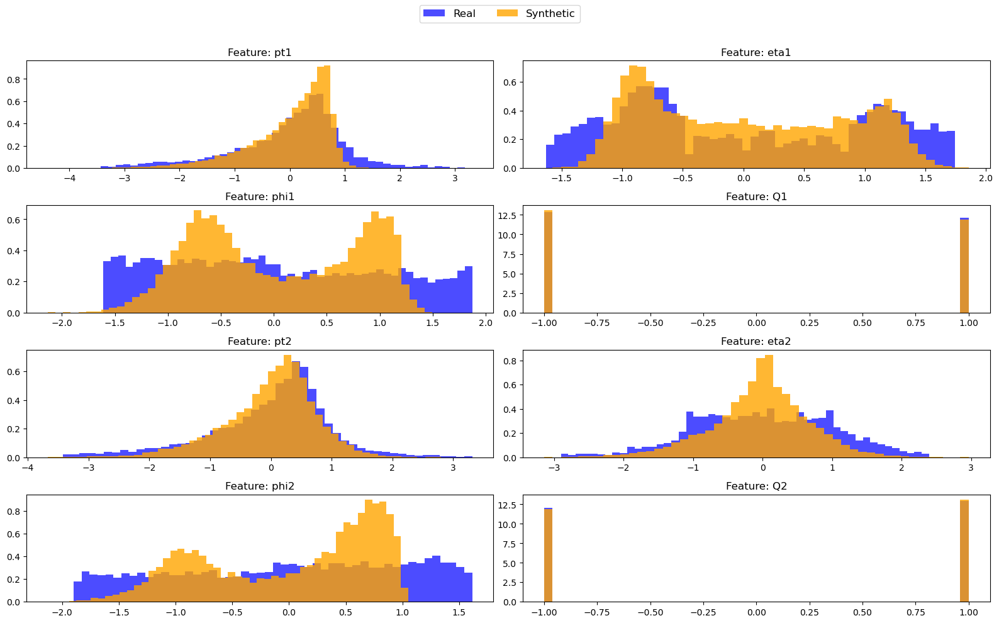

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.191005,0.105665,2.485784e-48,0.136008,0.013662
1,eta1,0.177956,0.107323,7.548707e-50,0.156004,0.021822
2,phi1,0.196263,0.138196,1.839725e-82,0.190047,0.024296
3,Q1,0.015928,0.007964,9.099572e-01,0.015928,0.000124
4,pt2,0.184841,0.089072,1.873824e-34,0.124733,0.011661
5,eta2,0.300038,0.145121,6.457670e-91,0.235213,0.050481
6,phi2,0.240870,0.205497,1.706377e-182,0.222765,0.034026
7,Q2,0.016420,0.008210,8.901320e-01,0.016420,0.000133
8,OVERALL,0.165415,0.100881,NaN,0.137140,0.019525


In [66]:
overall_performance(X_zmumu, binarized_df_zmumu)

It is clear that the mapping of `Q1` and `Q2` onto $\{-1,1\}$ improves the overall accuracy of the model. In particular, Wasserstein distance for these features reduces significantly.

In conclusion, the results clearly show an improvement in the overall performance of the model, but especially in the quality of the data generated for Q1 and Q2, which are now the features with the smallest Wasserstein distance.

#### **Handling Angular Features in VAE Modeling**

##### **Problem: Periodicity of Angular Features ($\phi_1$ and $\phi_2$)**

In the dataset, features like $\phi_1$ and $\phi_2$ represent angles. 
Angles are *periodic* quantities:
+ A value of $\phi = -\pi$ is equivalent to $\phi = +\pi$.
+ The domain is continuous and circular: $[-\pi, \pi]$.

Standard Variational Autoencoder (VAE) models treat all input features as *linear* quantities. 
Thus, during training and generation, the model fails to capture the continuity at the boundary. 
This leads to artificial artifacts in the generated data, such as:
+ Spikes at $-\pi$ and $+\pi$,
+ Symmetric distortions not present in real data.

##### **Proposed Solution (1): Trigonometric Encoding of Angles**

To properly model periodic features, we transform $\phi_1$ and $\phi_2$ into *two continuous features each*:
+ Replace $\phi_1$ with $\sin(\phi_1)$ and $\cos(\phi_1)$
+ Replace $\phi_2$ with $\sin(\phi_2)$ and $\cos(\phi_2)$

This way:
+ The input to the VAE becomes fully continuous and smooth.
+ The model no longer struggles with discontinuities.
+ The periodic nature of angles is naturally encoded into the data.

After generating synthetic samples, reconstruct $\phi_1$ and $\phi_2$ using the arctangent function:
$$
\phi = \arctan\left(\sin(\phi), \cos(\phi)\right).
$$

This ensures that generated $\phi$ values are valid, smooth, and within the expected range $[-\pi, \pi]$.

This method is widely used in machine learning tasks involving rotations, orientations, and angular measurements, especially in physics and robotics. It significantly improves the realism and physical consistency of generated synthetic data.

In [67]:
# Apply phi transformation
X_zmumu_phi = phi_sin_cos_transform(X_zmumu)
X_zmumu_phi.head()

,pt1,eta1,Q1,pt2,eta2,Q2,phi1_sin,phi1_cos,phi2_sin,phi2_cos
0,0.456044,-0.799097,-1.0,0.408334,-0.834963,1.0,-0.999299,0.037436,0.053239,0.998582
1,0.525894,0.503117,-1.0,-0.576798,-0.420386,1.0,-0.082344,0.996604,0.995708,0.092547
2,0.804566,1.112908,-1.0,0.498366,1.136381,1.0,0.997980,-0.063535,-0.388310,0.921529
3,-0.162468,-1.290214,-1.0,1.027568,-1.520348,1.0,-0.867584,0.497291,0.487757,0.872979
4,0.205230,-1.474206,1.0,0.539278,-1.311773,-1.0,0.121644,0.992574,-0.999814,-0.019271


In [68]:
# Train the best model on this new dataset
vae_zmumu_phi = VAE(input_dim=X_zmumu_phi.shape[1], hidden_dim=best_hyperparams_zmumu[2], latent_dim=best_hyperparams_zmumu[0])
loader_zmumu_phi = prepare_dataloader(X_zmumu_phi, batch_size=best_hyperparams_zmumu[1])
trained_vae_phi = train_vae(vae_zmumu_phi, loader_zmumu_phi, epochs=50, lr=1e-3, device=device)

In [69]:
# Generate synthetic data using the trained VAE and binarize Q1 and Q2
df_phi_binarized_sincos = Q1Q2_correction(generate_synthetic_data(model=trained_vae_phi, real_data=X_zmumu_phi, num_samples=5000, device=device))
df_phi_binarized_sincos.head()

,pt1,eta1,Q1,pt2,eta2,Q2,phi1_sin,phi1_cos,phi2_sin,phi2_cos
0,0.301958,0.329835,1.0,0.569985,0.094656,-1.0,0.372723,0.507459,-0.376345,0.522735
1,0.576205,1.258367,1.0,0.564077,1.284778,-1.0,0.445137,0.489176,-0.439671,0.535012
2,0.498089,-0.390971,1.0,0.330873,-0.629971,-1.0,-0.616810,0.653750,0.615311,0.654440
3,0.267324,1.178226,-1.0,0.550219,0.926863,1.0,-0.232168,0.601442,0.209455,0.568649
4,0.421486,-0.328025,-1.0,0.651606,-0.648508,1.0,0.477673,0.468119,-0.436308,0.559828


In [70]:
# Convert back to original space
df_phi_binarized = phi_arctan_transform(df_phi_binarized_sincos)
df_phi_binarized.head()

,pt1,eta1,Q1,pt2,eta2,Q2,phi1,phi2
0,0.301958,0.329835,1.0,0.569985,0.094656,-1.0,0.633500,-0.623992
1,0.576205,1.258367,1.0,0.564077,1.284778,-1.0,0.738298,-0.687891
2,0.498089,-0.390971,1.0,0.330873,-0.629971,-1.0,-0.756332,0.754591
3,0.267324,1.178226,-1.0,0.550219,0.926863,1.0,-0.368396,0.352917
4,0.421486,-0.328025,-1.0,0.651606,-0.648508,1.0,0.795500,-0.662029


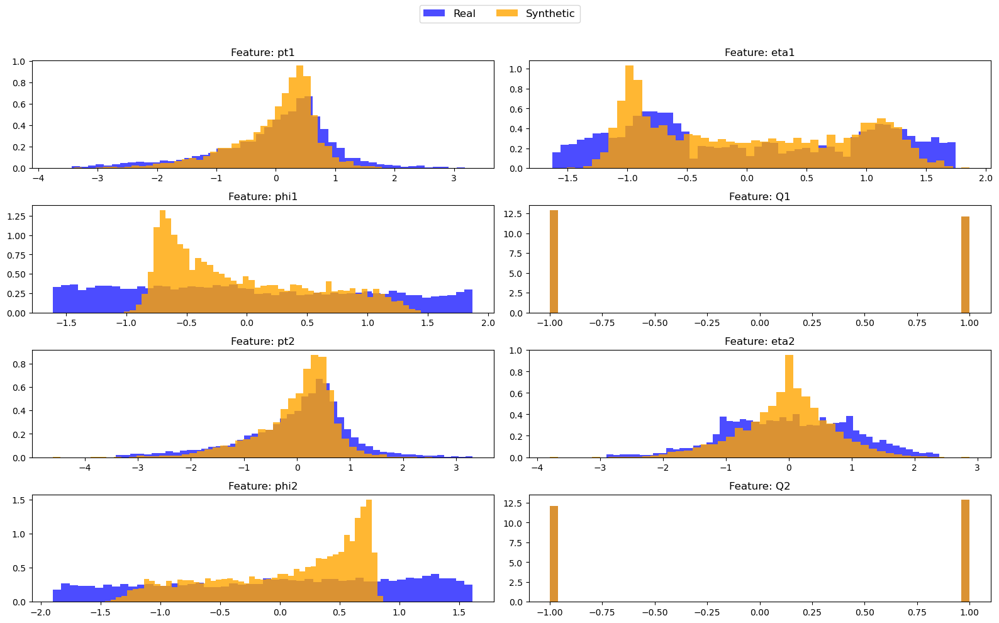

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.209381,0.115084,1.604681e-38,0.148816,1.680710e-02
1,eta1,0.140445,0.110566,1.388148e-35,0.129934,1.300267e-02
2,phi1,0.367124,0.243391,4.174946e-172,0.316341,8.555116e-02
3,Q1,0.000328,0.000164,1.000000e+00,0.000328,-1.940110e-07
4,pt2,0.215428,0.105929,1.080800e-32,0.149503,1.737509e-02
5,eta2,0.280101,0.141559,4.035893e-58,0.220373,4.373122e-02
6,phi2,0.364856,0.264570,1.141965e-203,0.317136,8.376634e-02
7,Q2,0.000580,0.000290,1.000000e+00,0.000580,-1.106583e-07
8,OVERALL,0.197280,0.122694,NaN,0.160376,3.252916e-02


In [71]:
overall_performance(X_zmumu, df_phi_binarized)

Quite surprisigly, the proposed solution does not bring any slight improvement to the model. As a matter of fact, `phi1` and `phi2` still have two spikes, and their distributions are far from the true one. 

We will analyze why this happens and propose another solution in the next section.

##### **Proposed Solution (2): Circular Loss for φ₁ and φ₂**

As already noted, in our dataset the features φ₁ and φ₂ represent angles, measured in radians. Due to their periodicity, the distance between two angles must account for this wrap-around behavior.

However, a standard Mean Squared Error (MSE) loss assumes a *linear* space, and does not understand that the domain is circular.
As a result, when minimizing standard MSE between angles near the discontinuity (e.g., between $\phi = -\pi$ and $\phi = +\pi$), the model incorrectly predicts large errors, even though the angles are actually close.

To correctly measure the error between two angles $\phi_{\text{real}}$ and $\phi_{\text{recon}}$, we proposed to use the *circular distance*, defined as:

$$
d(\phi_{\text{recon}}, \phi_{\text{real}}) = \min\left( |\phi_{\text{recon}} - \phi_{\text{real}}|, 2\pi - |\phi_{\text{recon}} - \phi_{\text{real}}| \right)
$$

Thus, we define the *circular Mean Squared Error* as:

$$
\text{Circular MSE} = \frac{1}{N} \sum_{i=1}^{N} \left( d(\phi_{\text{recon}, i}, \phi_{\text{real}, i}) \right)^2
$$

This correctly accounts for the periodicity, ensuring that angles close across the $\pm\pi$ boundary are treated as nearby.

In brief, the implementation strategy we have adopted is the follwoing:

1. We modified the VAE loss to separately handle φ₁ and φ₂ using *circular MSE*, while keeping standard MSE for all other features.
2. During training:
  - Compute the standard reconstruction loss for non-angular features.
  - Compute the circular MSE loss for angular features (φ₁ and φ₂).
  - Add KL divergence regularization as usual.
3. The total VAE loss becomes:

$$
\mathcal{L} = \text{MSE}_{\text{other features}} + \text{Circular MSE}_{\phi} + \text{KL Divergence}.
$$


In [72]:
# Perform grid search for hyperparameter tuning
best_hyperparams_zmumu_circ = grid_search(X_zmumu, latent_dim_choices, batch_size_choices, hidden_dim_choices, device=device, circular_loss=True)
best_hyperparams_zmumu_circ

Trial 1/36: latent_dim=4, batch_size=64, hidden_dim=64 => Score=0.3583
Trial 2/36: latent_dim=4, batch_size=64, hidden_dim=128 => Score=0.3099
Trial 3/36: latent_dim=4, batch_size=64, hidden_dim=256 => Score=0.2875
Trial 4/36: latent_dim=4, batch_size=128, hidden_dim=64 => Score=0.3641
Trial 5/36: latent_dim=4, batch_size=128, hidden_dim=128 => Score=0.3515
Trial 6/36: latent_dim=4, batch_size=128, hidden_dim=256 => Score=0.3186
Trial 7/36: latent_dim=4, batch_size=256, hidden_dim=64 => Score=0.4165
Trial 8/36: latent_dim=4, batch_size=256, hidden_dim=128 => Score=0.4036
Trial 9/36: latent_dim=4, batch_size=256, hidden_dim=256 => Score=0.3423
Trial 10/36: latent_dim=8, batch_size=64, hidden_dim=64 => Score=0.3484
Trial 11/36: latent_dim=8, batch_size=64, hidden_dim=128 => Score=0.3140
Trial 12/36: latent_dim=8, batch_size=64, hidden_dim=256 => Score=0.2987
Trial 13/36: latent_dim=8, batch_size=128, hidden_dim=64 => Score=0.3690
Trial 14/36: latent_dim=8, batch_size=128, hidden_dim=128 

(4, 64, 256)

In [73]:
# Train the best model with circular loss
vae_zmumu_circ = VAE(input_dim=X_zmumu.shape[1], hidden_dim=best_hyperparams_zmumu_circ[2], latent_dim=best_hyperparams_zmumu_circ[0])
loader_zmumu_circ = prepare_dataloader(X_zmumu, batch_size=best_hyperparams_zmumu_circ[1])
phi_columns_idx=[X_zmumu.columns.get_loc(col) for col in ['phi1', 'phi2']]  # Get indices of phi1 and phi2 columns
trained_vae_circ = train_vae_circular(vae_zmumu_circ, loader_zmumu_circ, epochs=50, lr=1e-3, device=device, phi_columns_idx=phi_columns_idx)

In [74]:
# Generate synthetic data using the VAE trained with circular loss on phi1 and phi2, and binarize Q1 and Q2
df_circ_binarized = Q1Q2_correction(generate_synthetic_data(model=trained_vae_circ, real_data=X_zmumu, num_samples=5000, device=device))
df_circ_binarized.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,0.527550,0.284690,-0.650110,-1.0,0.416108,0.020427,0.641896,1.0
1,0.253115,-0.951376,0.661998,-1.0,0.341385,-0.995433,-0.643773,1.0
2,0.244675,0.571921,0.062266,-1.0,-0.258643,0.093800,0.012112,1.0
3,-0.533483,-0.064184,-0.103506,1.0,-1.042155,0.261952,0.096375,-1.0
4,0.602066,1.001341,-0.103745,-1.0,0.208378,0.538201,0.144296,1.0


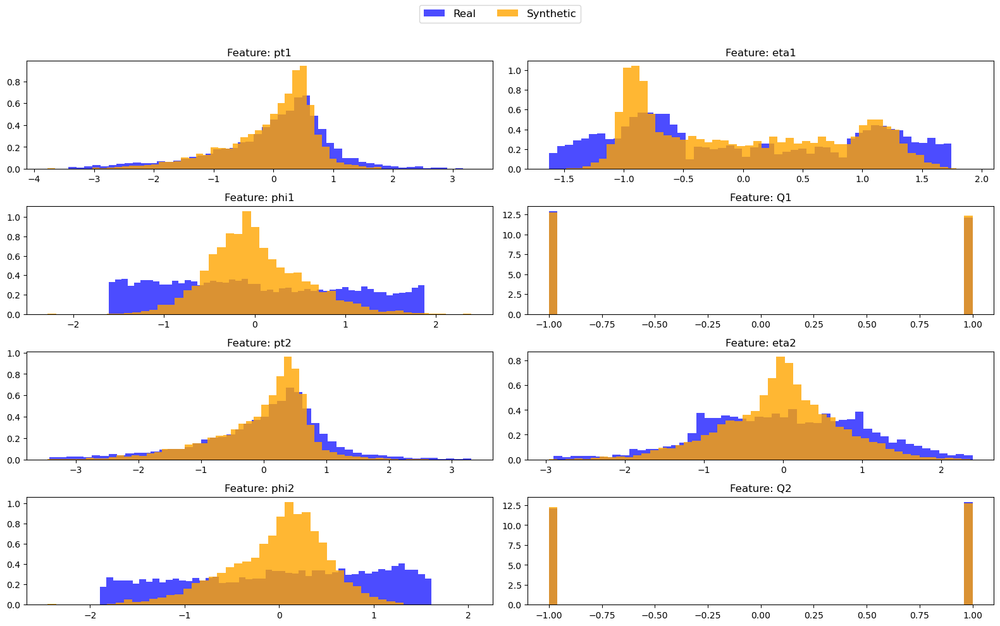

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.174036,0.105726,1.436779e-32,0.129909,0.012119
1,eta1,0.147103,0.125823,5.596883e-46,0.139862,0.015025
2,phi1,0.458913,0.243845,9.373912e-173,0.388105,0.149857
3,Q1,0.014072,0.007036,9.962987e-01,0.014072,0.000097
4,pt2,0.183095,0.105437,2.152600e-32,0.131208,0.012643
5,eta2,0.265604,0.133315,1.403000e-51,0.207675,0.038253
6,phi2,0.455161,0.245779,1.578149e-175,0.387491,0.148657
7,Q2,0.012580,0.006290,9.993459e-01,0.012580,0.000078
8,OVERALL,0.213821,0.121657,NaN,0.176363,0.047091


In [75]:
overall_performance(X_zmumu, df_circ_binarized)

##### **Conclusions on the phi1 and phi2 issue**

Neither of the proposed solutions works very well. Indeed, applying a trigonometric projection onto the data did not help at all, and using a circular led to an even higher Wasserstein distance. 

We get to the conclusion that the next (hopefully) better solution is to use a totally different model (e.g., GANs).

### **Z → e⁺e⁻ DECAY**

After a careful analysis of the training and evaluation for the Zmumu decay, we will train this type of decay by:
1. Performing a grid search over the space of hyperparameters;
2. Training the model with these optimal values;
3. Generating synthetic data with the trained model;
4. Binarizing the outputs for Q1 and Q2 (since Wasserstein distance clearly improved in the former case after this transformation).

We will NOT deal with the issue regarding the bad distribution of phi1 and phi2, since both the solutions proposed above (i.e. trigonometric encoding and circular loss) did not work out well.


In [76]:
loader_zee = prepare_dataloader(X_zee, batch_size=128)

In [77]:
# Initialize VAE (input dimension matches the number of features)
input_dim = X_zee.shape[1]
hidden_dim = 128
latent_dim = 10
num_samples = 10000  # How many synthetic events you want
device = 'cuda' if torch.cuda.is_available() else 'cpu'
vae_zee = VAE(input_dim=input_dim, hidden_dim=hidden_dim, latent_dim=latent_dim)

In [78]:
# Train VAE
device = 'cuda' if torch.cuda.is_available() else 'cpu'
trained_vae_zee = train_vae(vae_zee, loader_zee, epochs=50, lr=1e-3, device=device)

In [79]:
# Generate synthetic samples
with torch.no_grad():
    z = torch.randn(num_samples, latent_dim).to(device)  # Sample latent space
    synthetic_data_zee = vae_zee.decoder(z)  # Pass through decoder

In [80]:
synthetic_data_zee = pd.DataFrame(synthetic_data_zee, columns=X_zee.columns)

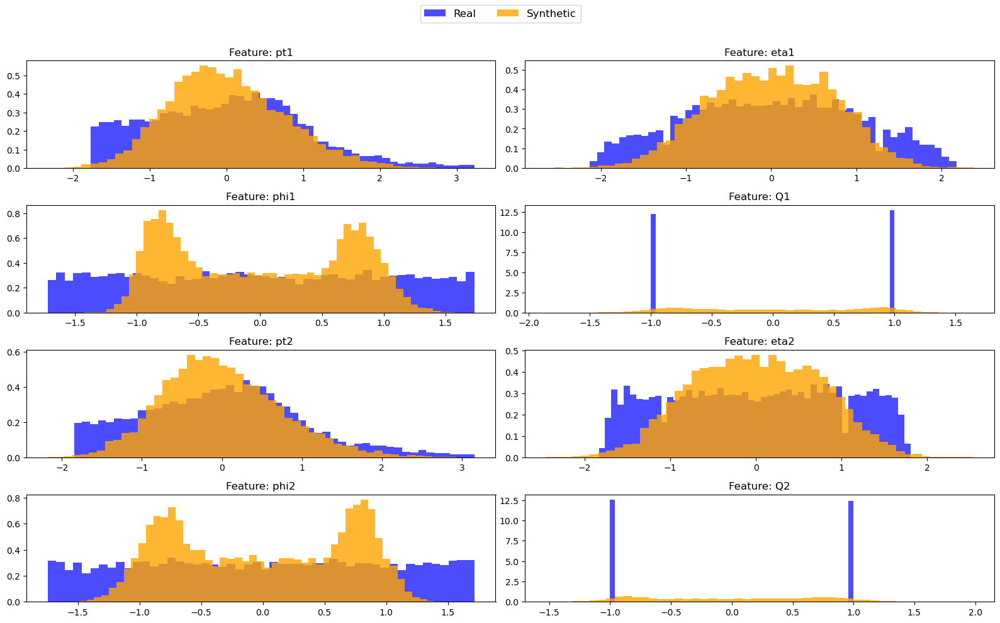

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.221708,0.113145,9.260740e-56,0.172878,0.026918
1,eta1,0.239408,0.099148,6.712173e-43,0.187302,0.032515
2,phi1,0.228713,0.182258,1.867600e-144,0.235001,0.041213
3,Q1,0.398619,0.439337,0.000000e+00,0.453819,0.144980
4,pt2,0.229872,0.110051,9.044888e-53,0.173400,0.026512
5,eta2,0.253408,0.121682,1.925795e-64,0.213171,0.043822
6,phi2,0.231457,0.168137,6.634245e-123,0.229752,0.040622
7,Q2,0.414340,0.439243,0.000000e+00,0.466642,0.153814
8,OVERALL,0.277190,0.209125,NaN,0.266496,0.063799


In [81]:
overall_performance(X_zee, synthetic_data_zee)

In [82]:
# Perform grid search for hyperparameter tuning
best_hyperparams_zee = grid_search(X_zee, latent_dim_choices, batch_size_choices, hidden_dim_choices, device=device)

Trial 1/36: latent_dim=4, batch_size=64, hidden_dim=64 => Score=0.3382
Trial 2/36: latent_dim=4, batch_size=64, hidden_dim=128 => Score=0.2717
Trial 3/36: latent_dim=4, batch_size=64, hidden_dim=256 => Score=0.2610
Trial 4/36: latent_dim=4, batch_size=128, hidden_dim=64 => Score=0.3346
Trial 5/36: latent_dim=4, batch_size=128, hidden_dim=128 => Score=0.3082
Trial 6/36: latent_dim=4, batch_size=128, hidden_dim=256 => Score=0.2820
Trial 7/36: latent_dim=4, batch_size=256, hidden_dim=64 => Score=0.3606
Trial 8/36: latent_dim=4, batch_size=256, hidden_dim=128 => Score=0.3235
Trial 9/36: latent_dim=4, batch_size=256, hidden_dim=256 => Score=0.3028
Trial 10/36: latent_dim=8, batch_size=64, hidden_dim=64 => Score=0.3102
Trial 11/36: latent_dim=8, batch_size=64, hidden_dim=128 => Score=0.2938
Trial 12/36: latent_dim=8, batch_size=64, hidden_dim=256 => Score=0.2849
Trial 13/36: latent_dim=8, batch_size=128, hidden_dim=64 => Score=0.3296
Trial 14/36: latent_dim=8, batch_size=128, hidden_dim=128 

In [83]:
# Train the best model
best_vae_zee = VAE(input_dim=input_dim, hidden_dim=best_hyperparams_zee[2], latent_dim=best_hyperparams_zee[0])
loader_zee_best = prepare_dataloader(X_zee, batch_size=best_hyperparams_zee[1])
trained_vae_best_zee = train_vae(best_vae_zee, loader_zee_best, epochs=50, lr=1e-3, device=device)
best_df_zee = generate_synthetic_data(trained_vae_best_zee, X_zee, num_samples, device=device)
best_df_zee.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,0.780802,-0.788384,0.897224,0.962736,-0.120804,-0.770835,-0.866549,-0.962810
1,1.010752,0.105619,-1.006893,-0.497750,-1.275076,0.082888,0.852323,0.573638
2,1.884344,-1.410711,-0.795825,0.076609,-0.444380,-1.160646,0.911846,0.014884
3,-0.916726,0.818077,0.599380,0.451683,-0.895456,0.936787,-0.527517,-0.390643
4,0.704384,0.662297,0.843325,0.962027,-0.191255,0.641396,-0.871975,-0.945880


In [84]:
binarized_df_zee = Q1Q2_correction(best_df_zee)
binarized_df_zee.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,0.780802,-0.788384,0.897224,1.0,-0.120804,-0.770835,-0.866549,-1.0
1,1.010752,0.105619,-1.006893,-1.0,-1.275076,0.082888,0.852323,1.0
2,1.884344,-1.410711,-0.795825,1.0,-0.444380,-1.160646,0.911846,1.0
3,-0.916726,0.818077,0.599380,1.0,-0.895456,0.936787,-0.527517,-1.0
4,0.704384,0.662297,0.843325,1.0,-0.191255,0.641396,-0.871975,-1.0


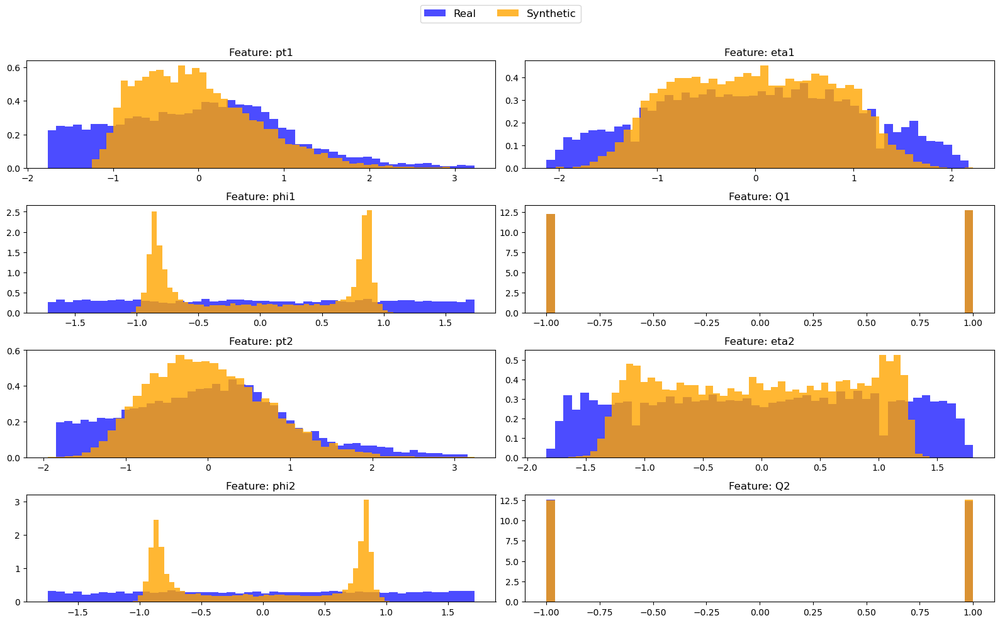

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.277647,0.160474,5.978215e-112,0.223037,0.045419
1,eta1,0.179744,0.084190,4.836064e-31,0.142978,0.017106
2,phi1,0.266361,0.220596,5.823215e-212,0.265095,0.032286
3,Q1,0.000675,0.000337,1.000000e+00,0.000675,-0.000001
4,pt2,0.242295,0.117225,7.894639e-60,0.184076,0.029621
5,eta2,0.180601,0.129082,1.744843e-72,0.164812,0.021044
6,phi2,0.267800,0.219133,3.837826e-209,0.265456,0.032643
7,Q2,0.007686,0.003843,9.999993e-01,0.007686,0.000026
8,OVERALL,0.177851,0.116860,NaN,0.156727,0.022268


In [85]:
overall_performance(X_zee, binarized_df_zee)

In [86]:
# Compute Wasserstein distances feature-by-feature
distance_binarized_df_zee = wasserstein_distance_per_feature(X_zee, binarized_df_zee)
distance_binarized_df_zee

,feature,wasserstein
0,pt1,0.277647
1,eta1,0.179744
2,phi1,0.266361
3,Q1,0.000675
4,pt2,0.242295
5,eta2,0.180601
6,phi2,0.267800
7,Q2,0.007686


In conclusion, binarization correction works very well also for the Zee data set, while angular features are still an open issue to be resolved.

### **Final considerations on VAE models**

In conclusions, while variational autocencoders get the overall distribution of most features, leading to a decent quality in the synthetic data, they generate bad data for angular (periodic) features.

Also, we notice how a simple `sign` mapping of Q1 and Q2 features incredibly improves performance.

## **5. WASSERSTEIN GENERATIVE ADVERSARIAL NETWORKS (WGANs)**

### **THEORETICAL OVERVIEW OF WGANs**

A Wasserstein Generative Adversarial Network (WGAN) is a type of GAN that improves training stability and sample quality by changing the core objective function used to train the discriminator (critic).

In a traditional GAN, the discriminator tries to classify samples as real or fake, while the generator tries to fool the discriminator. The loss functions are based on the *Jensen-Shannon divergence (JSD)* between the real and generated data distributions:

$$
\min_G \max_D \ \mathbb{E}_{x \sim \mathbb{P}_r} [\log D(x)] + \mathbb{E}_{\tilde{x} \sim \mathbb{P}_g} [\log(1 - D(\tilde{x}))].
$$

However, this setup suffers from:

- *Vanishing gradients*: when the discriminator gets too good.
- *Mode collapse*: generator produces limited diversity.
- *Unstable training*: due to the non-continuous nature of JSD.

WGAN replaces the JSD with the *Earth Mover’s (Wasserstein-1) distance*, which measures the "cost" of transforming one distribution into another:

$$
W(\mathbb{P}_r, \mathbb{P}_g) = \inf_{\gamma \in \Pi(\mathbb{P}_r, \mathbb{P}_g)} \mathbb{E}_{(x, y) \sim \gamma}[\|x - y\|].
$$

This results in the following *training objective*:

$$
\min_G \max_{D \in \text{Lip}_1} \mathbb{E}_{x \sim \mathbb{P}_r} [D(x)] - \mathbb{E}_{\tilde{x} \sim \mathbb{P}_g} [D(\tilde{x})],
$$

where:

- $ D $ is now a critic, not a classifier.
- $ D $ must be 1-Lipschitz continuous (i.e. its gradients must be bounded).

To enforce the Lipschitz constraint, WGAN uses *weight clipping*:

$$
\text{After each critic update: } \theta \leftarrow \text{clip}(\theta, -c, c),
$$

where $ c $ is a small constant (e.g., 0.01).

The training procedure differs slightly from traditional GANs:

- The critic is updated multiple times per generator update (e.g., 5).
- The generator tries to maximize the critic’s score on fake samples.

High-energy physics data like Z boson decays are:

- High-dimensional and structured;
- Continuous and smooth in distribution;
- Require stable training and mode diversity.

WGAN helps by:

- Providing meaningful gradients, even when the critic is near optimal;
- Enabling better learning of continuous distributions (such as momentum, energy);
- Avoiding mode collapse — critical for physics where full event diversity matters.

Getting into the details of our implementation:

- The *generator* is a fully connected neural network that maps a latent noise vector $ z \sim \mathcal{N}(0, I) $ to synthetic event features.
- The *critic* is a neural network with LeakyReLU activations, trained to assign higher values to real samples.
- We use *RMSProp* as the optimizer (recommended in the original WGAN paper: Arjovsky et al., *Wasserstein GAN*, [arXiv:1701.07875](https://arxiv.org/abs/1701.07875)).
- We *clip the weights* of the critic to enforce Lipschitz continuity.
- We train the critic 5 times per generator step to ensure its convergence.



In [221]:
import pandas as pd
import numpy as np
from torch.utils.data import DataLoader, TensorDataset
import torch
import joblib
from WGAN_architecture import *
from WGAN_GP_architecture import *
from WGAN_GP_architecture_parallelized_v2 import *
from EBGAN_architecture import *
from PerformanceMeasures import *
from PreprocessingPipeline import invert_preprocessing
from VAE_architecture import Q1Q2_correction
random.seed(42)

In [222]:
X_zmumu = pd.read_csv("X_zmumu_transformed.csv")
X_zee = pd.read_csv("X_zee_transformed.csv")
scaler_zmumu = joblib.load('scaler_zmumu.pkl')
scaler_zee = joblib.load('scaler_zee.pkl')

### **Z → μ⁺μ⁻ DECAY**

In this section, we will generate data for the Z-to-muons decay starting with the model explained above, which is clearly different from the VAE architectire previously adopted. In particular, we will expand on four main points:
1. Training a first Wassertein-based GAN and asses its performance;
2. Upgrading to a WGAN with a gradient penalty to check if permormance improves (indeed, it does);
3. Tuning hyperparamters of our best model so far;
4. Give a chance to a relatively new GAN implementation (based on a specific energy function) and see how it performs (poorly).

#### **WGANs TRAINING**

In [223]:
tensor_data_zmumu = torch.tensor(X_zmumu.values, dtype=torch.float32)
dataloader_zmumu = DataLoader(TensorDataset(tensor_data_zmumu), batch_size=64, shuffle=True)

In [224]:
# Instantiate and train
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
wgan_zmumu = WGAN(data_dim=X_zmumu.shape[1], device=device)
wgan_zmumu.train_model(dataloader_zmumu, n_epochs=100)

Epoch 1/100 | Loss_C: -0.0170 | Loss_G: 0.0105
Epoch 2/100 | Loss_C: -0.0152 | Loss_G: 0.0108
Epoch 3/100 | Loss_C: -0.0112 | Loss_G: 0.0086
Epoch 4/100 | Loss_C: -0.0088 | Loss_G: 0.0062
Epoch 5/100 | Loss_C: -0.0078 | Loss_G: 0.0073
Epoch 6/100 | Loss_C: -0.0048 | Loss_G: 0.0072
Epoch 7/100 | Loss_C: -0.0068 | Loss_G: 0.0075
Epoch 8/100 | Loss_C: -0.0051 | Loss_G: 0.0064
Epoch 9/100 | Loss_C: -0.0028 | Loss_G: 0.0091
Epoch 10/100 | Loss_C: 0.0018 | Loss_G: 0.0076
Epoch 11/100 | Loss_C: -0.0015 | Loss_G: 0.0084
Epoch 12/100 | Loss_C: -0.0018 | Loss_G: 0.0114
Epoch 13/100 | Loss_C: -0.0012 | Loss_G: 0.0144
Epoch 14/100 | Loss_C: -0.0017 | Loss_G: 0.0137
Epoch 15/100 | Loss_C: -0.0022 | Loss_G: 0.0142
Epoch 16/100 | Loss_C: -0.0005 | Loss_G: 0.0142
Epoch 17/100 | Loss_C: -0.0014 | Loss_G: 0.0144
Epoch 18/100 | Loss_C: 0.0000 | Loss_G: 0.0139
Epoch 19/100 | Loss_C: -0.0011 | Loss_G: 0.0138
Epoch 20/100 | Loss_C: -0.0015 | Loss_G: 0.0145
Epoch 21/100 | Loss_C: -0.0006 | Loss_G: 0.0132
Epo

In [225]:
# Generate synthetic samples
Zmumu_wgan_generated = wgan_zmumu.generate(10000)
# Transfomred data into pd dataframe
# Convert to DataFrame
Zmumu_wgan_generated = pd.DataFrame(Zmumu_wgan_generated, columns=X_zmumu.columns)
Zmumu_wgan_generated.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,-0.048645,-0.913332,-0.652062,0.785960,1.491960,-1.288533,-0.279388,-1.298069
1,-0.284273,-1.606495,0.945813,-0.088285,-2.983176,0.683263,-1.370811,0.009871
2,-1.732777,-1.883209,0.975305,0.673146,-3.135010,2.295666,0.321118,-0.396503
3,0.768904,0.386868,0.930553,0.729050,-0.111426,0.804467,-1.257711,-0.577836
4,-0.211350,-0.125161,-0.055026,-0.012488,0.683352,-1.152002,-1.326862,-0.260946


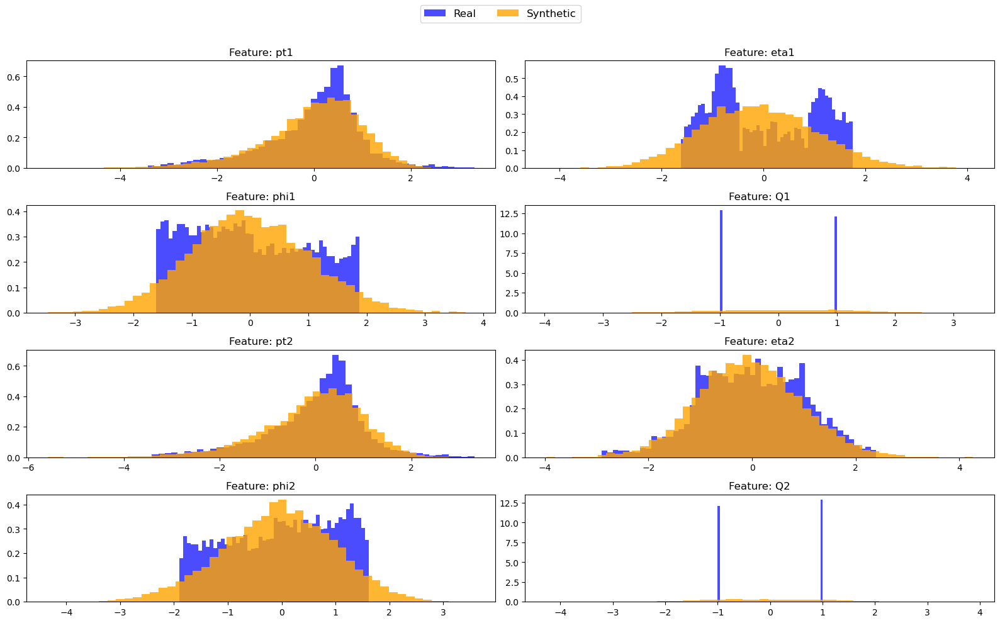

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.086204,0.050424,2.493230e-11,0.066925,0.004126
1,eta1,0.218993,0.100457,1.016940e-43,0.153630,0.019821
2,phi1,0.140860,0.054345,4.322382e-13,0.098675,0.010528
3,Q1,0.510306,0.330836,0.000000e+00,0.415001,0.087729
4,pt2,0.102201,0.058253,5.613648e-15,0.080546,0.005335
5,eta2,0.076659,0.056306,5.073931e-14,0.069325,0.002942
6,phi2,0.158688,0.069072,6.965885e-21,0.113900,0.012414
7,Q2,0.522246,0.330790,0.000000e+00,0.418884,0.087827
8,OVERALL,0.227020,0.131310,NaN,0.177111,0.028840


In [226]:
overall_performance(X_zmumu, Zmumu_wgan_generated)

In [227]:
binarized_df_zmumu_wgan = Q1Q2_correction(Zmumu_wgan_generated)
binarized_df_zmumu_wgan.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,-0.048645,-0.913332,-0.652062,1.0,1.491960,-1.288533,-0.279388,-1.0
1,-0.284273,-1.606495,0.945813,-1.0,-2.983176,0.683263,-1.370811,1.0
2,-1.732777,-1.883209,0.975305,1.0,-3.135010,2.295666,0.321118,-1.0
3,0.768904,0.386868,0.930553,1.0,-0.111426,0.804467,-1.257711,-1.0
4,-0.211350,-0.125161,-0.055026,-1.0,0.683352,-1.152002,-1.326862,-1.0


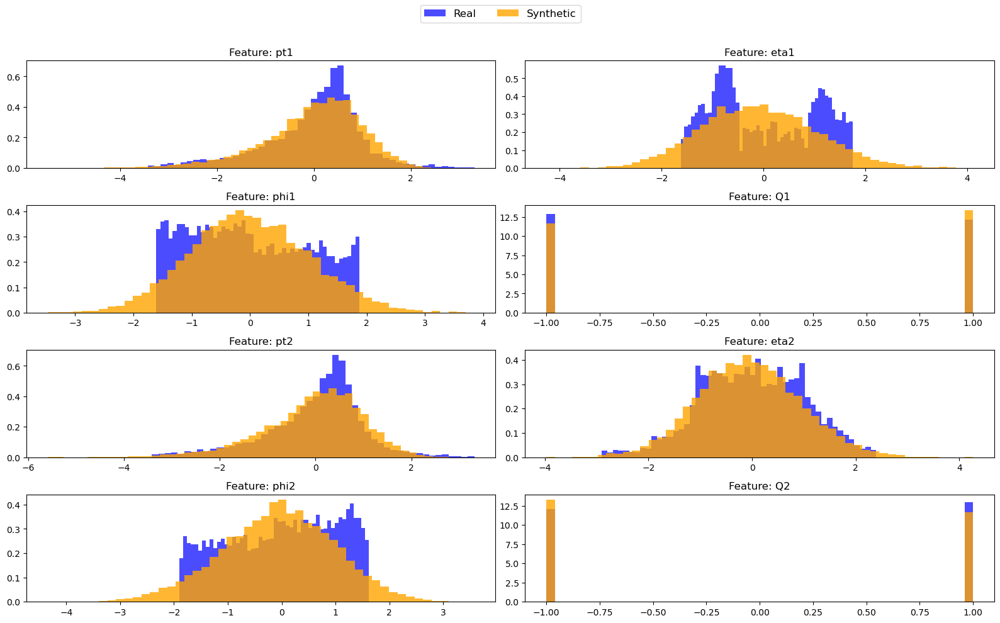

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.086204,0.050424,2.493230e-11,0.066925,0.004126
1,eta1,0.218993,0.100457,1.016940e-43,0.153630,0.019821
2,phi1,0.140860,0.054345,4.322382e-13,0.098675,0.010528
3,Q1,0.099872,0.049936,4.042306e-11,0.099872,0.004895
4,pt2,0.102201,0.058253,5.613648e-15,0.080546,0.005335
5,eta2,0.076659,0.056306,5.073931e-14,0.069325,0.002942
6,phi2,0.158688,0.069072,6.965885e-21,0.113900,0.012414
7,Q2,0.098580,0.049290,7.611872e-11,0.098580,0.004771
8,OVERALL,0.122757,0.061010,NaN,0.097682,0.008104


In [228]:
overall_performance(X_zmumu, binarized_df_zmumu_wgan)

After applying the binarization we had defined in the VAE section, accuracy of synthetic data improves significantly. 

Next, we will turn to a more sophisticated model of Generative Adversarial Models, with the intention of comparing its performance with respect to the model above. 

Then, we will carry out a thorough hyperparamter tuning on the most promisinig of the two models.

#### **Wasserstein GAN with Gradient Penalty (WGAN-GP)**

##### Why Use WGAN-GP?

Wasserstein GAN improves traditional GANs by replacing the Jensen-Shannon divergence with the *Wasserstein (Earth Mover’s) distance* as the loss metric. This results in better gradient behavior and more stable training.

However, the original WGAN enforces the *Lipschitz continuity* requirement by applying *weight clipping* to the critic network's parameters, constraining them to a fixed range (e.g., -0.01 to 0.01). This has several drawbacks:

- It can lead to capacity underuse of the critic.
- It may cause training instability or convergence to poor solutions.
- The gradient updates may vanish or explode during training.

WGAN-GP (Wasserstein GAN with Gradient Penalty) addresses these issues by using a *soft constraint* on the critic's gradients instead of hard clipping. It enforces the 1-Lipschitz constraint by penalizing deviations of the gradient norm from 1 on random interpolations between real and generated data.

The updated critic loss function becomes:

$$
\mathcal{L}_C = \mathbb{E}_{\tilde{x} \sim \mathbb{P}_g} [D(\tilde{x})] - \mathbb{E}_{x \sim \mathbb{P}_r} [D(x)] + \lambda \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\hat{x}}} \left[ \left( \left\| \nabla_{\hat{x}} D(\hat{x}) \right\|_2 - 1 \right)^2 \right],
$$

Where:

- $ x \sim \mathbb{P}_r $ is a real data sample;
- $ \tilde{x} \sim \mathbb{P}_g $ is a generated (fake) sample;
- $ \hat{x} \sim \mathbb{P}_{\hat{x}} $ is a random interpolation between real and fake samples;
- $ D(\cdot) $ is the critic (also called discriminator);
- $ \lambda $ is a penalty coefficient (commonly set to 10).

This gradient penalty term directly penalizes the norm of the gradients of the critic output with respect to its input, encouraging them to be close to 1. This enforces the 1-Lipschitz condition in a differentiable and stable manner.

In conclusion, benefits of WGAN-GP are:

- Smooth and stable training;
- Better convergence and higher sample quality;
- No need for weight clipping;
- Works well with a wide range of architectures and optimizers.

Due to its superior stability and theoretical soundness, we adopt WGAN-GP as an enhancement over the original WGAN for modeling high-dimensional Z boson decay data.


In [229]:
# Dataset setup
tensor_data_wgangp_zmumu = torch.tensor(X_zmumu.values, dtype=torch.float32)
dataloader_wgangp_zmumu = DataLoader(TensorDataset(tensor_data_wgangp_zmumu), batch_size=64, shuffle=True)

In [230]:
# Train WGAN-GP
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
zmumu_wgan_gp = WGANGP(data_dim=X_zmumu.shape[1], device=device)
zmumu_wgan_gp.train_model(dataloader_wgangp_zmumu, n_epochs=100)

c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:49: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_G = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_C = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:99: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(self.device.type == 'cuda')):
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `tor

In [231]:
# Generate synthetic data
Zmumu_wganGP_generated = zmumu_wgan_gp.generate(5000)
# Transfomred data into pd dataframe
# Convert to DataFrame
Zmumu_wganGP_generated = pd.DataFrame(Zmumu_wganGP_generated, columns=X_zmumu.columns)
Zmumu_wganGP_generated.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,-0.639109,-0.240334,1.235189,1.026933,0.053150,-0.181517,-0.884158,-1.048720
1,-0.941014,1.525170,1.336303,-0.996199,1.263497,1.426814,-0.560460,0.973606
2,-1.149221,-0.821005,1.593089,-0.955994,-0.961704,0.561910,-0.367517,0.943088
3,0.674646,0.830123,-1.190748,1.021891,0.097621,0.084817,0.350806,-1.055216
4,1.635857,-0.804654,-1.207042,-1.010262,-0.594917,-1.835901,0.223281,1.033119


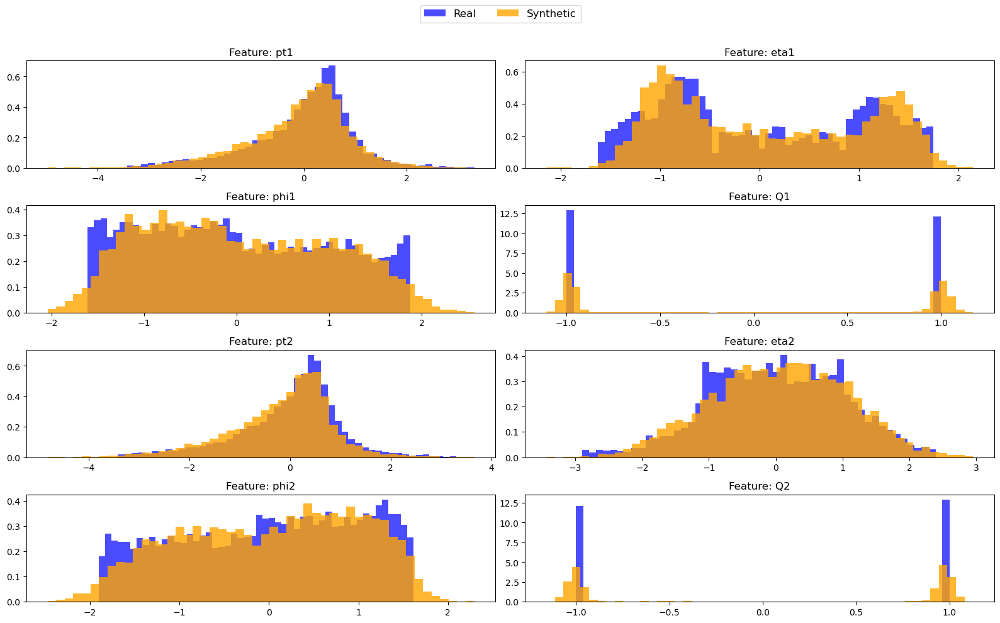

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.116412,0.070883,7.237104e-15,0.098312,0.004575
1,eta1,0.063249,0.055164,3.570424e-09,0.060033,0.000908
2,phi1,0.035749,0.024823,3.352044e-02,0.030279,0.000450
3,Q1,0.075462,0.379436,1.099790e-320,0.122222,0.002846
4,pt2,0.171716,0.087733,1.496412e-22,0.135180,0.007134
5,eta2,0.067214,0.035143,5.584475e-04,0.050894,0.001168
6,phi2,0.039925,0.023299,5.446044e-02,0.032613,0.000495
7,Q2,0.077114,0.392490,1.039514e-320,0.127817,0.003328
8,OVERALL,0.080855,0.133621,NaN,0.082169,0.002613


In [232]:
overall_performance(X_zmumu, Zmumu_wganGP_generated)

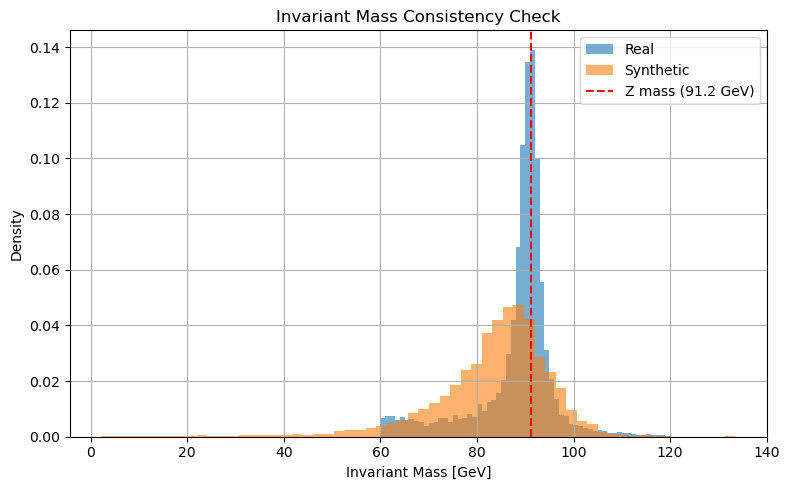

In [233]:
plot_invariant_mass_comparison(invert_preprocessing(X_zmumu, scaler=scaler_zmumu), invert_preprocessing(Zmumu_wganGP_generated, scaler=scaler_zmumu))

This upgraded version of the WGAN algorithm, which features a Gradient Penalty term, clearly has a better performance compared to the traditional WGAN. Indeed, after reverting the initial transformation we performed during EDA, we see how the model generated realistic data even when checking for mass invariance, hinting at solid physical meaning of the synthetic data!

Next, we will perform hyperparamter tuning directly on WGAN-GP, since it is much more promising than "traditional" WGAN.

#### **Hyperparameters Tuning**

In [234]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
best_params_zmumu_wganpgp, results_zmumu_wgangp = tune_wgangp_hyperparameters(
    data=X_zmumu,
    latent_dims=[64, 128],
    hidden_dims=[64, 128, 256],
    lrs=[1e-4, 5e-5],
    lambda_gps=[5, 10, 20],
    n_critics=[5, 10],
    batch_sizes=[64, 128, 256],
    betas_list=[(0.0, 0.9), (0.5, 0.9)],
    eval_fn=lambda model: eval_fn_wasserstein(model, real_data=X_zmumu),
    search_mode='random',
    device=device
)

c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:49: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_G = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_C = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:99: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(self.device.type == 'cuda')):
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `tor


Best config: latent_dim=64, hidden_dim=256, lr=0.0001, lambda_gp=20, n_critic=10, batch_size=64, betas=(0.0, 0.9)
Best score: 0.1720


In [235]:
best_params_zmumu_wganpgp = (64, 256, 0.0001, 20, 10, 64, (0.0, 0.9))

c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:49: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_G = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_C = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:99: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(self.device.type == 'cuda')):
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `tor

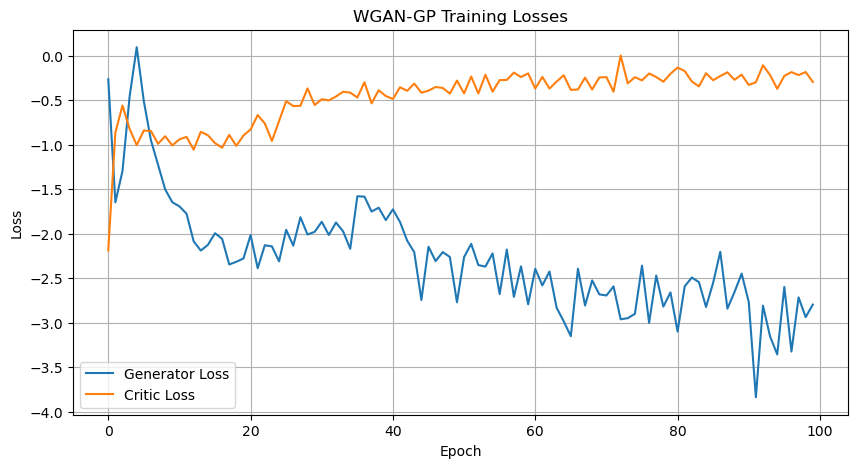

In [236]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess the data
tensor_data = torch.tensor(X_zmumu.values, dtype=torch.float32)
dataloader = DataLoader(TensorDataset(tensor_data), batch_size=best_params_zmumu_wganpgp[5], shuffle=True)

# Instantiate the model with best parameters
best_model_wgangp_zmumu = WGANGP(
    data_dim=X_zmumu.shape[1],
    latent_dim=best_params_zmumu_wganpgp[0],
    hidden_dim=best_params_zmumu_wganpgp[1],
    lr=best_params_zmumu_wganpgp[2],
    lambda_gp=best_params_zmumu_wganpgp[3],
    n_critic=best_params_zmumu_wganpgp[4],
    device=device
)

# Set optimizer betas from best_params
best_model_wgangp_zmumu.optimizer_G = torch.optim.Adam(best_model_wgangp_zmumu.generator.parameters(), lr=best_params_zmumu_wganpgp[2], betas=best_params_zmumu_wganpgp[6])
best_model_wgangp_zmumu.optimizer_C = torch.optim.Adam(best_model_wgangp_zmumu.critic.parameters(), lr=best_params_zmumu_wganpgp[2], betas=best_params_zmumu_wganpgp[6])

# Train the model
best_model_wgangp_zmumu.train_model(dataloader, n_epochs=100)

# Plot training curves
best_model_wgangp_zmumu.plot_losses()

In [237]:
# Generate synthetic data
Zmumu_best_wganGP_generated = best_model_wgangp_zmumu.generate(10000)
# Transform data into pd dataframe
Zmumu_best_wganGP_generated = pd.DataFrame(Zmumu_best_wganGP_generated, columns=X_zmumu.columns)
# Binazrize Q1 and Q2
Zmumu_best_wganGP_generated = Q1Q2_correction(Zmumu_best_wganGP_generated)
Zmumu_best_wganGP_generated.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,0.273705,-0.566429,0.174814,1.0,-1.611813,0.716453,-0.933278,-1.0
1,-1.517363,-1.040044,-1.281097,1.0,-0.312430,0.643223,-0.028086,-1.0
2,-0.203421,0.192788,-1.283796,-1.0,0.009164,-1.345606,0.216862,1.0
3,-1.637160,-1.342757,0.231473,1.0,1.444779,-0.667555,-1.529488,-1.0
4,0.105095,-0.311797,-1.246197,1.0,0.628105,0.528992,0.295984,-1.0


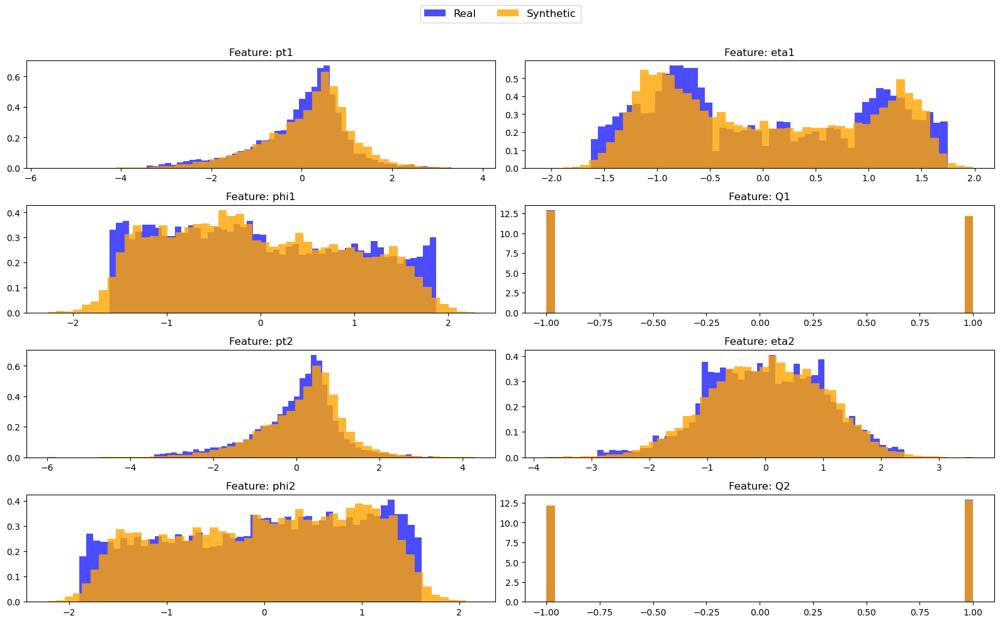

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.137611,0.086914,7.986212e-33,0.111269,0.005798
1,eta1,0.042772,0.035615,7.209829e-06,0.040432,0.000652
2,phi1,0.061439,0.034799,1.271793e-05,0.052792,0.001669
3,Q1,0.007272,0.003636,9.999999e-01,0.007272,0.000023
4,pt2,0.179385,0.102615,1.332009e-45,0.137494,0.007292
5,eta2,0.040348,0.029357,3.990035e-04,0.034056,0.000563
6,phi2,0.040195,0.028589,6.189802e-04,0.036611,0.000861
7,Q2,0.010780,0.005390,9.986260e-01,0.010780,0.000058
8,OVERALL,0.064975,0.040864,NaN,0.053838,0.002114


In [238]:
overall_performance(X_zmumu, Zmumu_best_wganGP_generated)

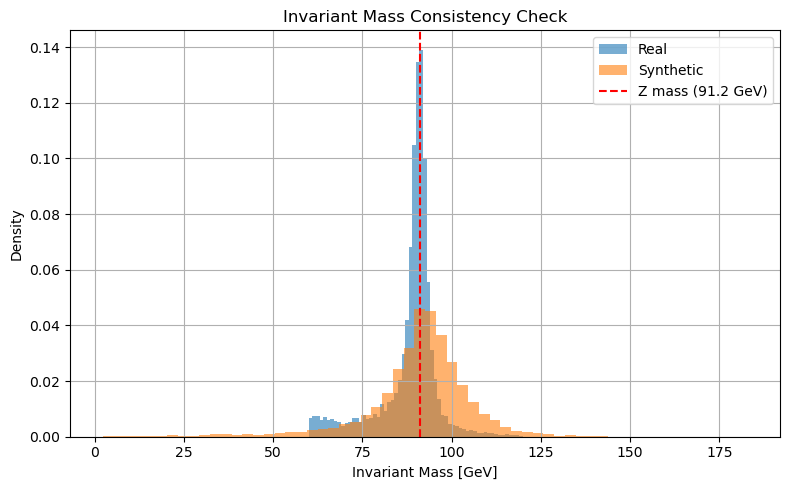

In [239]:
plot_invariant_mass_comparison(invert_preprocessing(X_zmumu, scaler=scaler_zmumu), invert_preprocessing(Zmumu_best_wganGP_generated, scaler=scaler_zmumu))

After hyperparmeters tuning, we have found a pretty valid model, with an overlall Wasserstein distance of approximately 0.044, meaning that 99.6% of the generated data follow the same distribution of the real one. Also, the physics-informed constraint on invariant mass is closely satisfied!

#### **Energy-Based Generative Adversarial Netwroks (EBGANs)**

Energy-Based Generative Adversarial Networks (EBGANs) are a variant of the standard GAN architecture, introduced to improve training stability and interpretability. Unlike standard GANs, where the discriminator outputs a probability (real vs. fake), the EBGAN discriminator outputs an *energy score*—typically a scalar indicating how "real" a sample appears, based on how well it can be reconstructed.

This energy interpretation brings EBGANs conceptually closer to *energy-based models* and *autoencoders*.

Indeed, in EBGAN, the discriminator is an autoencoder that assigns low energy to real samples (reconstruction error is small) and higher energy to fake (generated) samples. The generator tries to produce samples that the discriminator will reconstruct well, hence fooling the discriminator by minimizing reconstruction energy.

We will try to train a Energy-Based model to see if we can achieve a higher accuracy with respect to our previous models.

The architecture is the following:

- Discriminator: Autoencoder $ D(x) = \|x - \hat{x}\| $, where $ \hat{x} $ is the reconstruction of $ x $.

- Generator: Neural network $ G(z) $, maps latent vector $ z \sim p(z) $ to data space.

Let:

- $ x \sim p_{\text{data}} $ be real data,
- $ z \sim p(z) $ be latent noise (e.g., Gaussian),
- $ G(z) \sim p_g $ be generated data,
- $ D(x) $ be the reconstruction energy from the autoencoder.

Then, the *discriminator loss* can be expressed as:

$$
\mathcal{L}_D = \mathbb{E}_{x \sim p_{\text{data}}}[D(x)] + \mathbb{E}_{z \sim p(z)}[\max(0, m - D(G(z)))],
$$

where:

- $ D(x) = \|x - \hat{x}\|^2 $ is the reconstruction error (energy),

- $ m $ is a margin (hyperparameter); if $ D(G(z)) > m $, generator sample is considered too bad to train on.

The *generator loss* is:

$$
\mathcal{L}_G = \mathbb{E}_{z \sim p(z)}[D(G(z))].
$$

The generator tries to minimize the energy assigned to its generated samples.

Key points of a Energy-Based GAN are:

- The discriminator autoencodes inputs and penalizes poorly reconstructed samples.

- Real samples are easy to reconstruct → low energy.

- Fake samples should ideally be hard to reconstruct → high energy.

- The margin enforces a *hinge loss*, which stabilizes training by not over-penalizing poor generator outputs in early epochs.


Hence, with repsect to standard GANs: 

| Feature | Standard GAN | EBGAN |
|--------|--------------|-------|
| Discriminator Output | Probability [0,1] | Energy (scalar) |
| Discriminator Type | Binary Classifier | Autoencoder |
| Training Instability | High | Lower |
| Objective | JS Divergence | Approx. Total Variation Distance |
| Mode Collapse | Common | Less Frequent |


Notice that autoencoders are particularly suitable as discriminators in EBGANs because:

- They *reconstruct* input features, giving a tangible "distance" measure.
- They inherently provide an energy function: reconstruction error is a proxy for likelihood.
- They create smoother gradients compared to classifiers in traditional GANs.

In particular, EBGAN approximately minimizes the *Total Variation (TV)* distance:

$$
\text{TV}(p_{\text{data}}, p_g) = \sup_{A} |P(A) - Q(A)|.
$$

When using a bounded discriminator $ D(x) \in [0, m] $, the EBGAN objective approximates:

$$
\mathcal{L}_G^* = \frac{m}{2} \cdot \text{TV}(p_{\text{data}}, p_g)
$$

So minimizing the generator loss moves the generated distribution closer to the real distribution in TV sense.

For more information, see:
- Zhao et al., *Energy-Based Generative Adversarial Networks*, [arXiv:1609.03126](https://arxiv.org/abs/1609.03126);
- Arjovsky et al., *Wasserstein GAN*, [arXiv:1701.07875](https://arxiv.org/abs/1701.07875).


Epoch 1/100 | D Loss: 9.9817 | G Loss: 0.2078
Epoch 2/100 | D Loss: 1.6470 | G Loss: 9.9798
Epoch 3/100 | D Loss: 3.0384 | G Loss: 11.5637
Epoch 4/100 | D Loss: 1.5513 | G Loss: 11.0837
Epoch 5/100 | D Loss: 1.4867 | G Loss: 10.7425
Epoch 6/100 | D Loss: 1.7877 | G Loss: 10.1093
Epoch 7/100 | D Loss: 3.7207 | G Loss: 11.1192
Epoch 8/100 | D Loss: 3.5440 | G Loss: 10.4199
Epoch 9/100 | D Loss: 3.0905 | G Loss: 10.8460
Epoch 10/100 | D Loss: 2.9829 | G Loss: 10.6385
Epoch 11/100 | D Loss: 7.4826 | G Loss: 10.1287
Epoch 12/100 | D Loss: 3.3338 | G Loss: 10.7732
Epoch 13/100 | D Loss: 1.9829 | G Loss: 10.8130
Epoch 14/100 | D Loss: 7.2582 | G Loss: 10.5737
Epoch 15/100 | D Loss: 3.7646 | G Loss: 10.2095
Epoch 16/100 | D Loss: 4.4138 | G Loss: 10.2645
Epoch 17/100 | D Loss: 2.6746 | G Loss: 10.1434
Epoch 18/100 | D Loss: 4.5106 | G Loss: 11.0317
Epoch 19/100 | D Loss: 3.8775 | G Loss: 10.2918
Epoch 20/100 | D Loss: 2.7504 | G Loss: 10.4086
Epoch 21/100 | D Loss: 3.4858 | G Loss: 10.6686
Epo

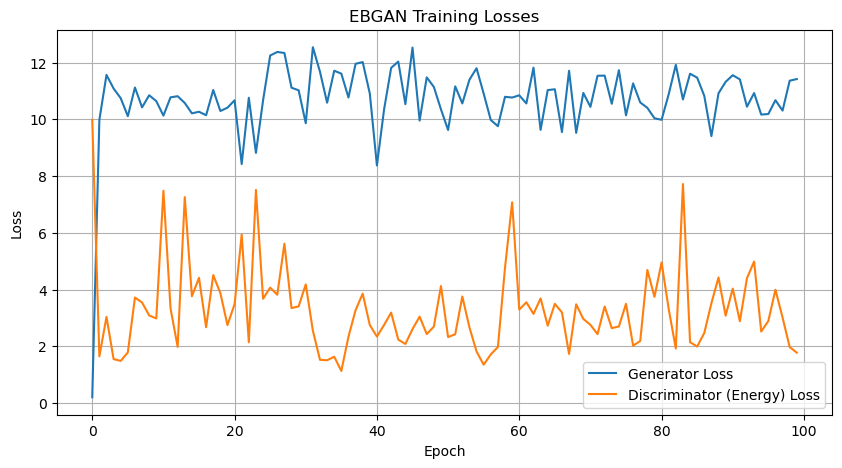

In [240]:
# Create DataLoader
tensor_data_ebgan_zmumu = torch.tensor(X_zmumu.values, dtype=torch.float32)
dataloader_ebgan_zmumu = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(tensor_data_ebgan_zmumu), batch_size=64, shuffle=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize and train
ebgan_zmumu = EBGAN(data_dim=X_zmumu.shape[1], device=device)
ebgan_zmumu.train_model(dataloader_ebgan_zmumu, n_epochs=100)

# Plot losses
ebgan_zmumu.plot_losses()

In [241]:
# Generate synthetic data
Zmumu_ebgan_generated = ebgan_zmumu.generate(10000)

# Transfomred data into pd dataframe
Zmumu_ebgan_generated = pd.DataFrame(Zmumu_ebgan_generated, columns=X_zmumu.columns)
Zmumu_ebgan_generated.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,-2.480808,-0.598906,0.029567,0.277188,-1.142751,1.248610,1.479321,-1.501100
1,-1.945351,-0.897971,0.016528,0.494444,-0.550619,0.765815,1.617733,-1.529124
2,-1.889966,-0.395941,-0.015339,0.143000,-0.954686,1.371863,1.366742,-1.490573
3,-1.884301,-0.704867,0.040791,0.156534,-0.811497,1.047468,1.368794,-1.412323
4,-1.701149,-1.478940,-0.028546,0.362908,-0.623088,0.413524,1.369785,-1.271048


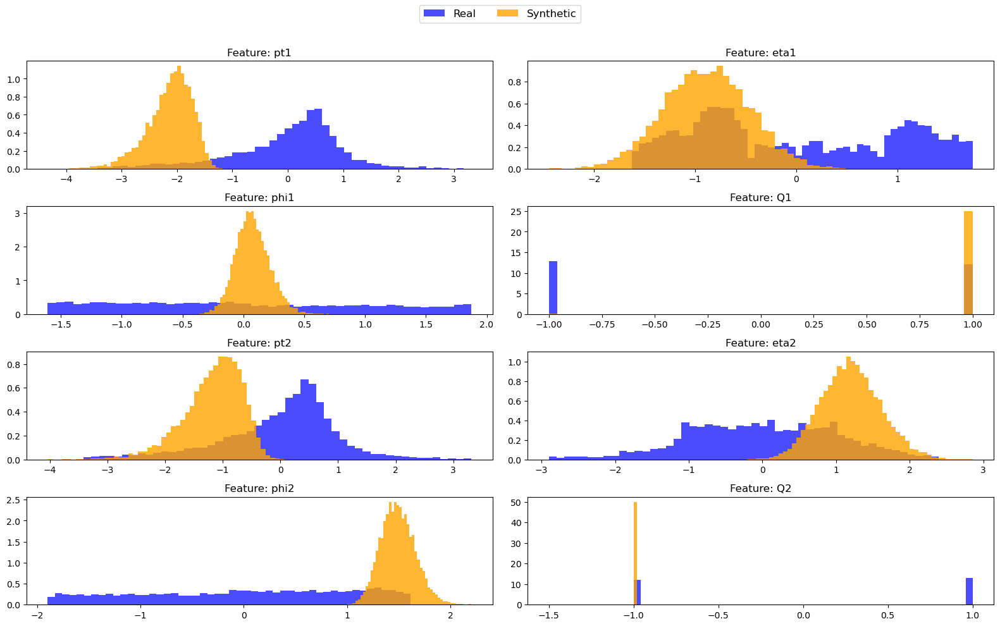

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,2.134773,0.897378,0.0,1.687143,1.024026
1,eta1,0.889512,0.456616,0.0,0.774454,0.268778
2,phi1,0.758550,0.450418,0.0,0.662569,0.388156
3,Q1,1.025272,0.512636,0.0,1.025272,0.515998
4,pt2,1.186793,0.706035,0.0,1.073817,0.586944
5,eta2,1.199562,0.632971,0.0,1.033020,0.479623
6,phi2,1.492724,0.832051,0.0,1.291660,0.718840
7,Q2,1.033780,0.516890,0.0,1.033780,0.524563
8,OVERALL,1.215121,0.625624,NaN,1.072714,0.563366


In [242]:
Zmumu_ebgan_generated = Q1Q2_correction(Zmumu_ebgan_generated)
overall_performance(X_zmumu, Zmumu_ebgan_generated)

Clearly, EBGAN fails at getting the overall distribution of our dataset.

### **Z → e⁺e⁻ DECAY**

Now, we turn our attention to the boson-electron decay again. Considering the results witnessed with the former dataset, we have decided to directly work with WGAN-GP, since it is clearly more accurate.

We will perform a random search over a large set of hyperparameters, select the best ones and train our model to create new data. After applying our consolidated `sign` mapping to the dataset, we will evaluate its accuracy through the various statistical measures and check that the mass invarince constraint is satisfied. 

#### **WGAN-GP and Hyperparamters Tuning**

In [243]:
# ### MIGHT TAKE LONG TIME TO RUN --- results are reported below

# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# best_params_zee_wganpgp, results_zee_wgangp = tune_wgangp_hyperparameters(
#     data=X_zee,
#     latent_dims=[64, 128],
#     hidden_dims=[64, 128, 256],
#     lrs=[1e-4, 5e-5],
#     lambda_gps=[5, 10, 20],
#     n_critics=[5, 10],
#     batch_sizes=[64, 128, 256],
#     betas_list=[(0.0, 0.9), (0.5, 0.9)],
#     eval_fn=lambda model: eval_fn_wasserstein(model, real_data=X_zee),
#     search_mode='random',
#     device=device
# )

In [244]:
best_params_zee_wganpgp = (64, 256, 0.0001, 20, 10, 64, (0.0, 0.9))

In [245]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess the data
tensor_data = torch.tensor(X_zee.values, dtype=torch.float32)
dataloader = DataLoader(TensorDataset(tensor_data), batch_size=best_params_zee_wganpgp[5], shuffle=True)

# Instantiate the model with best parameters
best_model_wgangp_zee = WGANGP(
    data_dim=X_zee.shape[1],
    latent_dim=best_params_zee_wganpgp[0],
    hidden_dim=best_params_zee_wganpgp[1],
    lr=best_params_zee_wganpgp[2],
    lambda_gp=best_params_zee_wganpgp[3],
    n_critic=best_params_zee_wganpgp[4],
    device=device
)

# Set optimizer betas from best_params
best_model_wgangp_zee.optimizer_G = torch.optim.Adam(best_model_wgangp_zee.generator.parameters(), lr=best_params_zee_wganpgp[2], betas=best_params_zee_wganpgp[6])
best_model_wgangp_zee.optimizer_C = torch.optim.Adam(best_model_wgangp_zee.critic.parameters(), lr=best_params_zee_wganpgp[2], betas=best_params_zee_wganpgp[6])

c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:49: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_G = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_C = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))


c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:99: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(self.device.type == 'cuda')):
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(self.device.type == 'cuda')):


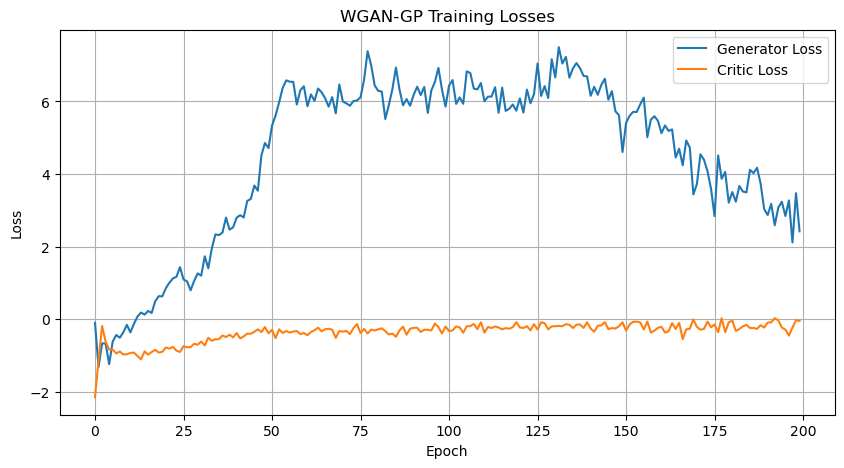

In [246]:
# Train the model
best_model_wgangp_zee.train_model(dataloader, n_epochs=200) # 200 epochs for better performance since 100 epochs did not yield good results in a previous run

# Plot training curves
best_model_wgangp_zee.plot_losses()

In [247]:
# Save model
torch.save(best_model_wgangp_zee.state_dict(), 'best_model_wgangp_zee.pth')

In [248]:
# Load model
best_model_wgangp_zee.load_state_dict(torch.load('best_model_wgangp_zee.pth'))

<All keys matched successfully>

Generator Loss does not stabilize at all, even after training the model for 200 epochs... let's see how it performs.

In [249]:
# Generate synthetic data
Zee_best_wganGP_generated = best_model_wgangp_zee.generate(10000)
# Transform data into pd dataframe
Zee_best_wganGP_generated = pd.DataFrame(Zee_best_wganGP_generated, columns=X_zee.columns)
# Binazrize Q1 and Q2
Zee_best_wganGP_generated = Q1Q2_correction(Zee_best_wganGP_generated)
Zee_best_wganGP_generated.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,0.519825,-0.714610,-0.777964,-1.0,0.162705,0.312428,0.963385,1.0
1,-1.104712,0.591199,-0.717681,-1.0,1.988120,1.205624,0.973503,1.0
2,2.266711,0.352751,1.620334,1.0,-0.965077,-0.596191,-0.039959,-1.0
3,1.938396,-0.249302,-0.119340,-1.0,-0.149816,0.459879,-1.584926,-1.0
4,1.666573,-0.880523,-0.688663,1.0,1.920289,-1.112550,0.765015,-1.0


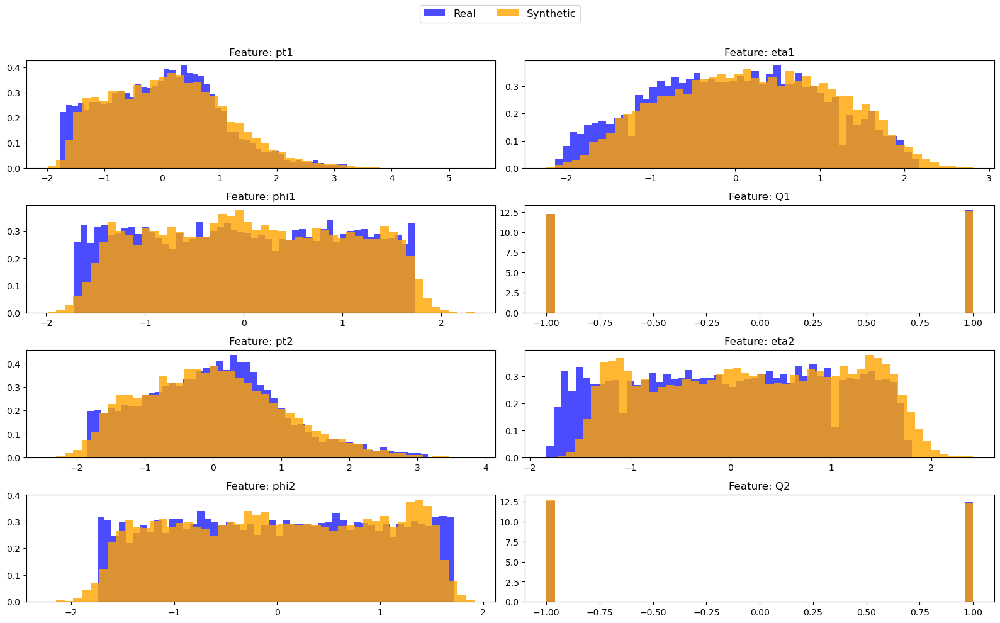

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.098568,0.043776,1.051721e-08,0.072202,1.569442e-03
1,eta1,0.191193,0.070535,6.507581e-22,0.143097,5.999770e-03
2,phi1,0.081458,0.048568,1.293666e-10,0.072735,2.545667e-03
3,Q1,0.001875,0.000937,1.000000e+00,0.001875,4.198373e-07
4,pt2,0.051171,0.030795,1.588146e-04,0.041207,1.325449e-03
5,eta2,0.223198,0.090695,5.846956e-36,0.170706,8.654660e-03
6,phi2,0.026477,0.026049,2.321607e-03,0.024625,2.194264e-04
7,Q2,0.015314,0.007657,9.299729e-01,0.015314,1.122837e-04
8,OVERALL,0.086157,0.039877,NaN,0.067720,2.553390e-03


In [250]:
overall_performance(X_zee, Zee_best_wganGP_generated)

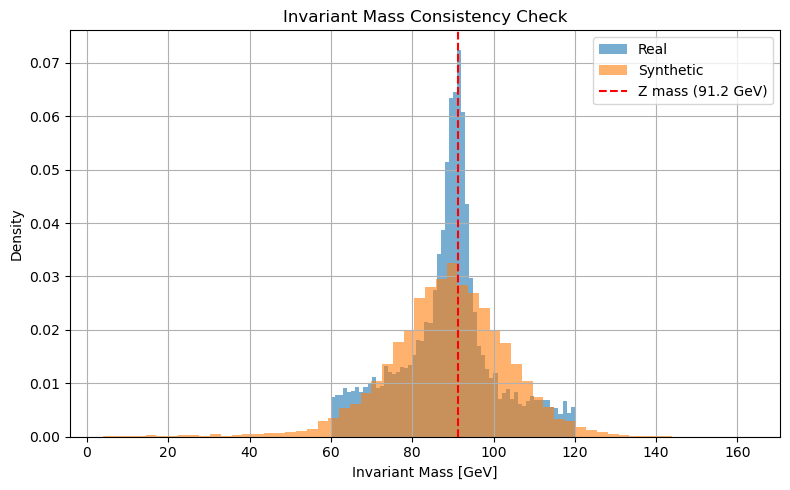

In [251]:
plot_invariant_mass_comparison(invert_preprocessing(X_zee, scaler=scaler_zee), invert_preprocessing(Zee_best_wganGP_generated, scaler=scaler_zee))

#### **Early Stopping**

Overall performance of the model is not bad at all, but the oscillating Generator Loss is quite worrisome. Hence, we will try early-stopping the training after 120 epochs, before the loss rises again.

c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:49: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_G = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_C = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:99: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(self.device.type == 'cuda')):
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `tor

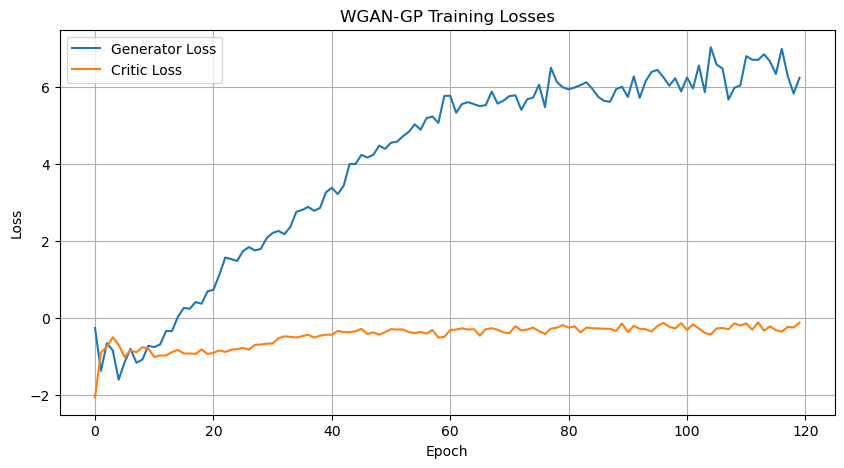

In [252]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess the data
tensor_data = torch.tensor(X_zee.values, dtype=torch.float32)
dataloader = DataLoader(TensorDataset(tensor_data), batch_size=best_params_zee_wganpgp[5], shuffle=True)

# Instantiate the model with best parameters
best_model_wgangp_zee_120 = WGANGP(
    data_dim=X_zee.shape[1],
    latent_dim=best_params_zee_wganpgp[0],
    hidden_dim=best_params_zee_wganpgp[1],
    lr=best_params_zee_wganpgp[2],
    lambda_gp=best_params_zee_wganpgp[3],
    n_critic=best_params_zee_wganpgp[4],
    device=device
)

# Set optimizer betas from best_params
best_model_wgangp_zee_120.optimizer_G = torch.optim.Adam(best_model_wgangp_zee_120.generator.parameters(), lr=best_params_zee_wganpgp[2], betas=best_params_zee_wganpgp[6])
best_model_wgangp_zee_120.optimizer_C = torch.optim.Adam(best_model_wgangp_zee_120.critic.parameters(), lr=best_params_zee_wganpgp[2], betas=best_params_zee_wganpgp[6])

# Train the model
best_model_wgangp_zee_120.train_model(dataloader, n_epochs=120)

# Plot training curves
best_model_wgangp_zee_120.plot_losses()

In [253]:
# Save model
torch.save(best_model_wgangp_zee_120.state_dict(), 'best_model_wgangp_zee_140.pth')

In [254]:
# Load model
best_model_wgangp_zee_120.load_state_dict(torch.load('best_model_wgangp_zee_140.pth'))

<All keys matched successfully>

In [255]:
# Generate synthetic data
Zee_best_wganGP_generated_120 = best_model_wgangp_zee_120.generate(10000)
# Transform data into pd dataframe
Zee_best_wganGP_generated_120 = pd.DataFrame(Zee_best_wganGP_generated_120, columns=X_zee.columns)
# Binazrize Q1 and Q2
Zee_best_wganGP_generated_120 = Q1Q2_correction(Zee_best_wganGP_generated_120)
Zee_best_wganGP_generated_120.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,-1.554413,-0.964527,0.133777,-1.0,-1.178591,-1.138744,-1.630976,-1.0
1,-1.786702,0.151115,-1.509489,-1.0,-0.579537,0.090492,0.259589,1.0
2,-0.629449,0.463296,-0.246299,-1.0,-1.063551,1.991241,1.555367,1.0
3,-0.504276,1.637879,0.679470,1.0,0.667135,0.867034,-1.172566,1.0
4,0.643812,0.913388,-0.449515,1.0,0.561293,1.301456,1.202252,-1.0


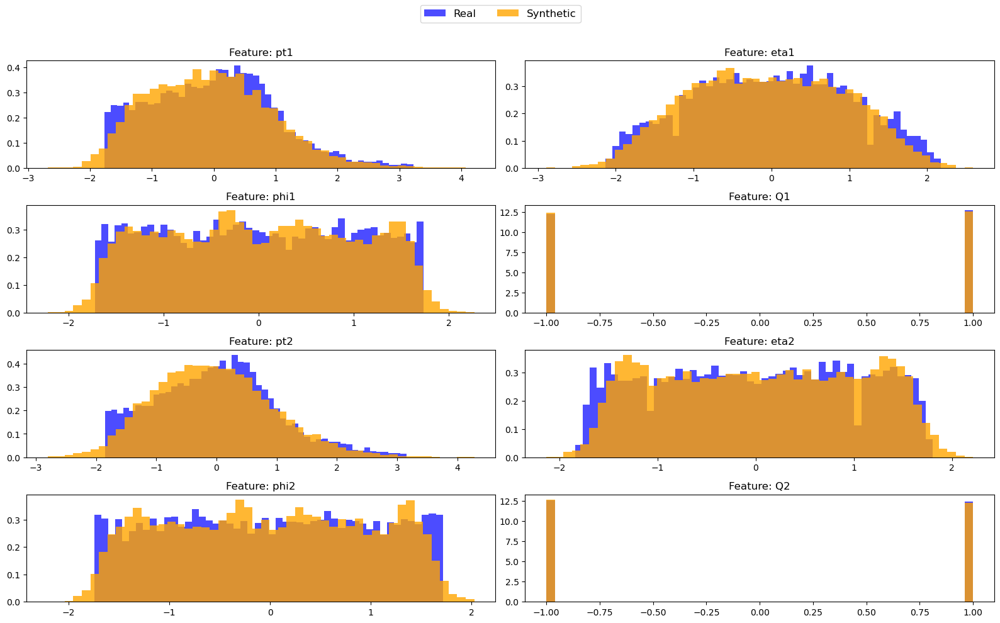

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.075666,0.046200,1.203661e-09,0.063113,0.001993
1,eta1,0.059141,0.026739,1.615799e-03,0.044567,0.000786
2,phi1,0.026578,0.016023,1.540671e-01,0.021658,0.000272
3,Q1,0.013075,0.006537,9.825298e-01,0.013075,0.000084
4,pt2,0.071492,0.041532,7.051898e-08,0.056439,0.002051
5,eta2,0.054005,0.036718,2.981775e-06,0.044305,0.000561
6,phi2,0.029079,0.019463,4.575794e-02,0.024323,0.000284
7,Q2,0.009514,0.004757,9.998448e-01,0.009514,0.000045
8,OVERALL,0.042319,0.024746,NaN,0.034624,0.000759


In [256]:
overall_performance(X_zee, Zee_best_wganGP_generated_120)

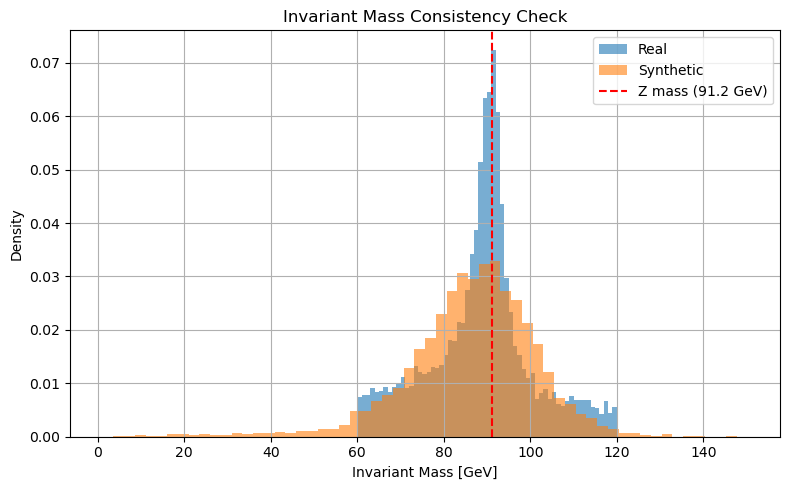

In [257]:
plot_invariant_mass_comparison(invert_preprocessing(X_zee, scaler=scaler_zee), invert_preprocessing(Zee_best_wganGP_generated_120, scaler=scaler_zee))

This final model generates synthetic data with a low Wasserstein distance, with distributions overlapping by nearly 92%. However, the one before, trained over 200 epochs, has an even lower Wassertein (around 0.043).

### **Final considerations on WGAN**

The WGAN algorithm immediately performed better than VAEs, leading to promising results. By adopting a more sophisticated method, which adds a gradient penalty to its architecture, and by properly dealing with Q1 and Q2, our results get even better, and consistent from the physical point of view!

## **6. MULTILAYEAR PERCEPTRON**

In this section we build an MLP using sk-learn library. 

We consider many regularization methods and, in order to find the best hyperparameters, we use RandomizedSearchCV.

In [87]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.model_selection import train_test_split

from joblib import dump, load
from scipy.stats import loguniform, uniform

In [88]:
# Load the two filtered datasets and merge them in a single dataframe
file_path_1 = "X_zee_transformed.csv"
file_path_2 = "X_zmumu_transformed.csv"

df_zee = pd.read_csv(file_path_1)
df_zmumu = pd.read_csv(file_path_2)

#i want to add a column "class" to the dataframes, Zee = 0 and Zmumu = 1
df_zee['class'] = 0
df_zmumu['class'] = 1
# Concatenate the two dataframes
df = pd.concat([df_zee, df_zmumu], ignore_index=True)

df


,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,0.177194,-0.001386,-0.419895,-1.0,-0.351921,0.946419,1.248808,1.0,0
1,2.722571,-0.341359,0.512196,1.0,-0.020006,-0.193734,-0.821204,1.0,0
2,-0.558061,0.257011,-0.875983,1.0,-1.508119,-1.132987,0.828152,-1.0,0
3,1.571933,0.033978,-1.276944,1.0,0.797695,-0.278185,1.058832,-1.0,0
4,-0.536604,1.163964,-0.581479,-1.0,-0.292643,-0.154709,0.925425,1.0,0
...,...,...,...,...,...,...,...,...,...
19553,0.097466,-1.111943,-0.801328,1.0,0.439080,-1.412259,0.622981,-1.0,1
19554,0.003028,-1.396998,-1.230212,1.0,0.202758,-0.951007,0.291821,-1.0,1
19555,0.196649,0.217617,1.704645,-1.0,0.770755,-1.079685,-0.569242,1.0,1
19556,0.143048,-0.849182,-0.950016,-1.0,-0.525879,-1.118171,0.327554,1.0,1


In [89]:
#split the dataset into train validation and test
# Split the data into features and target variable
features = df.drop(columns=['class'])
target = df['class']

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(features, target, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.4, random_state=42)




In [90]:
X_train.shape, X_val.shape, X_test.shape

((13690, 8), (3520, 8), (2348, 8))

In [91]:
X_train

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
13105,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0
15648,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0
18461,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0
18890,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0
2357,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0
...,...,...,...,...,...,...,...,...
11284,-2.474643,-0.865976,-1.604952,1.0,2.526983,-0.158936,-0.001202,-1.0
11964,0.921192,-0.111949,-0.807645,-1.0,-0.465002,0.567157,0.517795,1.0
5390,-0.686498,2.103217,0.797017,-1.0,0.117564,0.808543,-1.056071,1.0
860,-0.190317,-0.406786,-0.889847,-1.0,2.624384,0.172033,0.409258,1.0


In [92]:
X_val

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
6545,-0.581996,0.030003,-0.051064,1.0,1.754207,-0.426913,1.469519,-1.0
12195,0.543149,1.044617,0.921303,1.0,0.466710,0.754793,-1.136610,-1.0
15010,0.839948,0.664891,0.799327,1.0,0.582701,0.979979,-1.202485,-1.0
13052,-0.016243,0.286800,-1.380729,-1.0,1.052448,0.927689,-0.138095,1.0
16582,-0.673705,-0.515826,0.146219,-1.0,-0.737092,1.262369,-1.885105,1.0
...,...,...,...,...,...,...,...,...
18551,0.363782,-0.944076,-0.029347,-1.0,-0.061290,-0.296037,1.444173,1.0
16591,0.414879,-1.504227,0.522179,1.0,0.429493,-1.911646,-1.333506,-1.0
5900,0.444453,-0.331255,-1.619972,1.0,0.846061,-0.534111,0.140186,-1.0
18961,-0.014112,1.142112,-1.593591,1.0,-0.000661,0.900316,-0.153530,-1.0


In [93]:
X_test

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
16836,0.580964,-0.522737,1.530187,1.0,0.297217,-0.478408,-0.421612,-1.0
1027,-1.317591,0.514578,0.814842,1.0,-0.042216,0.359091,-1.263507,1.0
1084,-0.441720,1.839769,0.677356,-1.0,0.488968,1.144050,-1.483612,1.0
1768,0.509863,0.401944,1.079197,1.0,0.050517,0.181007,-0.744476,-1.0
3208,0.258242,1.082801,1.311752,-1.0,0.798902,0.703641,-0.400988,1.0
...,...,...,...,...,...,...,...,...
1254,-1.226443,0.342563,-1.302141,1.0,-0.299047,1.375420,0.438231,1.0
17109,0.851928,1.436455,1.822908,1.0,-2.717918,-0.841982,-0.334208,-1.0
6366,0.596176,0.020976,-1.000210,-1.0,0.488251,-0.294463,0.747017,1.0
19261,-2.335437,-0.989703,1.348858,1.0,-1.952633,0.955414,-0.638359,-1.0


In [94]:
# Define the base model
mlp = MLPClassifier(random_state=42)

# Define parameter distributions (split by solver)
param_distributions = {
    'hidden_layer_sizes': [
        (50,), (100,), (200,),
        (50, 50), (100, 50), (200, 100),
        (100, 100), (150, 100, 50)
    ],
    'activation': ['relu', 'tanh', 'logistic'],
    'solver': ['adam', 'sgd'],
    'alpha': loguniform(1e-6, 1e-2), 
    'learning_rate_init': loguniform(1e-5, 1e-2),
    'batch_size': [32, 64, 128, 256],
    'early_stopping': [True],
    'max_iter': [500],  
    'n_iter_no_change': [10, 15],

    # Adam-specific parameters
    'beta_1': uniform(0.8, 0.199),  
    'beta_2': uniform(0.9, 0.0999), 

    # SGD-specific parameters
    'learning_rate': ['constant', 'invscaling', 'adaptive'],
    'momentum': uniform(0.8, 0.199),  
    'power_t': uniform(0.1, 0.8) 
}

# Configure RandomizedSearch
random_search = RandomizedSearchCV(
    estimator=mlp,
    param_distributions=param_distributions,
    n_iter=100,  # Total combinations to try
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42,
    verbose=2
)

# Execute search
random_search.fit(X_train, y_train)

# Results
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

# Save best model
mlp_best = random_search.best_estimator_
dump(mlp_best, 'best_mlp_model.joblib')

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters: {'activation': 'logistic', 'alpha': 9.749762207436125e-05, 'batch_size': 32, 'beta_1': 0.8294692990607266, 'beta_2': 0.9996742744563893, 'early_stopping': True, 'hidden_layer_sizes': (200,), 'learning_rate': 'constant', 'learning_rate_init': 0.008508340610643312, 'max_iter': 500, 'momentum': 0.881796365650328, 'n_iter_no_change': 10, 'power_t': 0.32291717138928916, 'solver': 'adam'}
Best score: 0.8672753834915996


['best_mlp_model.joblib']

In [95]:
# LOAD THE MODEL AND EVALUATE IT

mlp_best = load('best_mlp_model.joblib')
mlp_best

MLPClassifier(activation='logistic', alpha=9.749762207436125e-05, batch_size=32,
              beta_1=0.8294692990607266, beta_2=0.9996742744563893,
              early_stopping=True, hidden_layer_sizes=(200,),
              learning_rate_init=0.008508340610643312, max_iter=500,
              momentum=0.881796365650328, power_t=0.32291717138928916,
              random_state=42)

In [96]:
# Evaluate the model
train_score = mlp_best.score(X_train, y_train)
val_score = mlp_best.score(X_val, y_val)
test_score = mlp_best.score(X_test, y_test)
print("Training set score: ", train_score)
print("Validation set score: ", val_score)
print("Test set score: ", test_score)

Training set score:  0.8819576333089847
Validation set score:  0.8769886363636363
Test set score:  0.8803236797274276


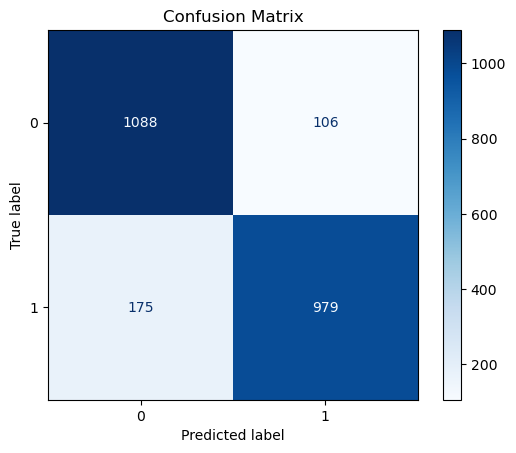

In [97]:
#i want to plot the confusion matrix
# Generate predictions
y_pred = mlp_best.predict(X_test)

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=mlp_best.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


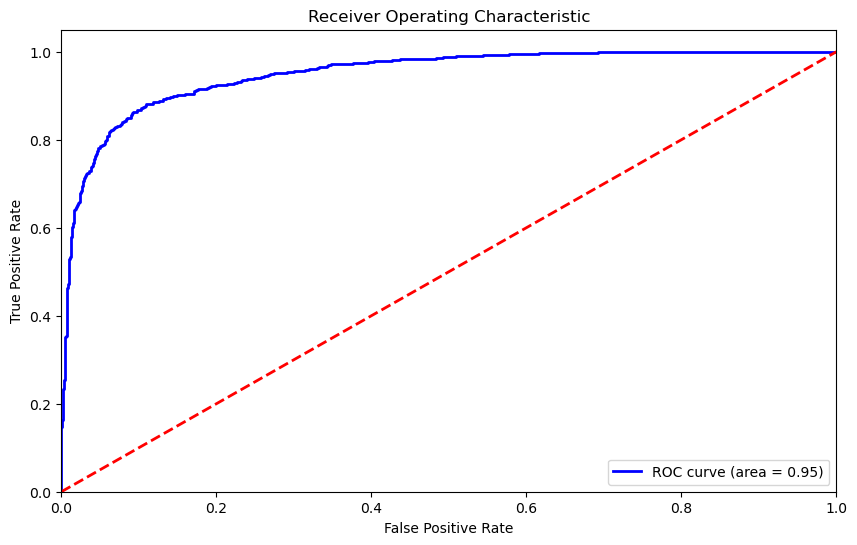

In [98]:
# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(y_test, mlp_best.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)
# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


## **7. TRAINING MLP WITH DATA AUGMENTATION**

We define a set of multipliers [0.5, 1.0, 1.5, 2.0] indicating the factor of augmentation (e.g. multiplier 0.5 over a 100 samples dataset imply 50 new samples -> 150 training dataset).

We train MLPs on augmented datasets using different techniques.

Hyperparameters are set as the optimal ones defined in previous section.

Data augmetnation techiniques tested:
- Mixup
- KNN augmentation
- Gaussian Mixture Models
- Forest Based synthesis
- Rule-Based Synthesis

In [99]:
multiplier_to_test = [0.5, 1.0, 1.5, 2.0]

### **MIXUP GENERATION**

Mixup is a data‐augmentation technique where new training examples are created by interpolating pairs of existing examples (both inputs and labels).

Given two samples $(x_i, y_i)$ and $(x_j, y_j)$, one draws from a Beta distribution a mixing coefficient $(\lambda \in [0,1])$ and forms a synthetic example:

$$
\tilde{x} = \lambda\,x_i + (1 - \lambda)\,x_j,
\qquad
\tilde{y} = \lambda\,y_i + (1 - \lambda)\,y_j.
$$


In [100]:
def mixup_binary_hardlabels_split(X_train, y_train, alpha, num_augmented_samples):
    # Ensure y_train is integer type
    y_train = y_train.astype(int)
    
    synthetic_X = []
    synthetic_y = []
    
    for _ in range(num_augmented_samples):
        # Randomly select two samples
        idx1, idx2 = np.random.choice(len(X_train), 2, replace=False)
        x1, y1 = X_train[idx1], y_train[idx1]
        x2, y2 = X_train[idx2], y_train[idx2]
        
        # Sample lambda from Beta distribution
        lam = np.random.beta(alpha, alpha)
        
        # Interpolate features
        x_new = lam * x1 + (1 - lam) * x2
        
        # Assign class based on dominant contribution (lambda >= 0.5)
        y_new = y1 if lam >= 0.5 else y2
        
        synthetic_X.append(x_new)
        synthetic_y.append(y_new)
    
    # Convert synthetic data to numpy arrays
    synthetic_X = np.array(synthetic_X)
    synthetic_y = np.array(synthetic_y, dtype=int)
    
    # Combine original and synthetic data
    augmented_X = np.concatenate([X_train, synthetic_X], axis=0)
    augmented_y = np.concatenate([y_train, synthetic_y], axis=0)
    
    return augmented_X, augmented_y

In [101]:
from sklearn.model_selection import StratifiedKFold


In [102]:
# Optimization parameters
best_multiplier = 0
best_score = 0

# Assuming we have feature names for DataFrame reconstruction
feature_names = X_train.columns.tolist() if hasattr(X_train, 'columns') else [f'feature_{i}' for i in range(X_train.shape[1])]

# Main optimization loop
for multiplier in multiplier_to_test:
    # Generate augmented data using numpy arrays
    num_samples = int(multiplier * len(X_train))
    X_augmented, y_augmented = mixup_binary_hardlabels_split(
        X_train.values if hasattr(X_train, 'values') else X_train,
        y_train.values if hasattr(y_train, 'values') else y_train,
        alpha=0.2,
        num_augmented_samples=num_samples
    )
    
    print(f"Initial length: {len(X_train)}; Multiplier: {multiplier}; "
          f"Augmented samples: {num_samples}; Total length: {len(X_augmented)}")

    # Scale the augmented data
    scaler = StandardScaler()
    X_augmented_scaled = scaler.fit_transform(X_augmented)

    # Load the best model fresh for each iteration
    mlp_best_mixup = load('best_mlp_model.joblib')
    
    # Train on augmented data
    mlp_best_mixup.fit(X_augmented_scaled, y_augmented)

    # Calculate scores
    train_score = mlp_best_mixup.score(X_augmented_scaled, y_augmented)
    val_score = mlp_best_mixup.score(X_val, y_val)
    test_score = mlp_best_mixup.score(X_test, y_test)

    print(f"Training score: {train_score:.4f}")
    print(f"Validation score: {val_score:.4f}")
    print(f"Test score: {test_score:.4f}")

    # Update best parameters - NOTE: Using test score for selection might be problematic
    if val_score > best_score:
        best_score = test_score
        best_multiplier = multiplier
        
        # Store augmented data as DataFrame
        augmented_df_mixup = pd.DataFrame(X_augmented, columns=feature_names)
        augmented_df_mixup['class'] = y_augmented
        
        # Clone the best model
        from sklearn.base import clone
        best_model_mixup = clone(mlp_best_mixup)
        best_model_mixup.fit(X_augmented_scaled, y_augmented)

    print("\n" + "="*50 + "\n")

print(f"Best multiplier: {best_multiplier} with test score: {best_score:.4f}")
print("Augmented DataFrame shape:", augmented_df_mixup.shape)
augmented_df_mixup.head()

Initial length: 13690; Multiplier: 0.5; Augmented samples: 6845; Total length: 20535


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Training score: 0.8608
Validation score: 0.8710
Test score: 0.8850


Initial length: 13690; Multiplier: 1.0; Augmented samples: 13690; Total length: 27380


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Training score: 0.8604
Validation score: 0.8585
Test score: 0.8727


Initial length: 13690; Multiplier: 1.5; Augmented samples: 20535; Total length: 34225


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Training score: 0.8529
Validation score: 0.8545
Test score: 0.8637


Initial length: 13690; Multiplier: 2.0; Augmented samples: 27380; Total length: 41070
Training score: 0.8491
Validation score: 0.8605
Test score: 0.8693


Best multiplier: 0.5 with test score: 0.8850
Augmented DataFrame shape: (20535, 9)


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0


In [103]:
# Outlier detection using Z-score
z_scores_mixup = np.abs(zscore(augmented_df_mixup))
outliers_z_mixup = (z_scores_mixup > 3).sum(axis=0)
outliers_z_mixup

pt1      152
eta1       0
phi1       0
Q1         0
pt2      159
eta2       0
phi2       0
Q2         0
class      0
dtype: int64

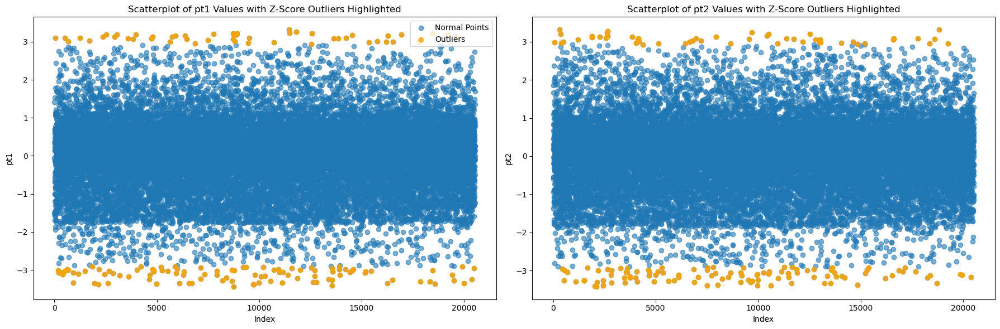

In [104]:
# Scatterplots for Event, pt1, and pt2 with Z-score outliers highlighted
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=False)

# Convert z_scores to a DataFrame for easier indexing
z_scores_df = pd.DataFrame(z_scores_mixup, columns=augmented_df_mixup.columns)

columns = ['pt1', 'pt2']
for i, col in enumerate(columns):
    # Identify outliers based on Z-score
    outlier_indices = z_scores_df[col] > 3
    
    # Plot all points
    axes[i].scatter(augmented_df_mixup.index, augmented_df_mixup[col], label='Normal Points', alpha=0.6)
    
    # Highlight outliers
    axes[i].scatter(augmented_df_mixup.index[outlier_indices], augmented_df_mixup[col][outlier_indices], color='orange', label='Outliers', alpha=0.8)
    
    axes[i].set_title(f'Scatterplot of {col} Values with Z-Score Outliers Highlighted')
    axes[i].set_xlabel('Index')
    axes[i].set_ylabel(col)

axes[0].legend()  # Add legend to the first subplot
plt.tight_layout()
plt.show()

In [105]:
# 3. Remove outliers detected using z-score statistics
z_scores_mixup = np.abs(zscore(augmented_df_mixup[['pt1', 'pt2']]))
mask_mixup = (z_scores_mixup < 3).all(axis=1)
augmented_df_mixup_filtered = augmented_df_mixup[mask_mixup]
augmented_df_mixup_filtered.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0


In [106]:
X_train_augmented_mixup_filtered, y_train_augmented_mixup_filtered = augmented_df_mixup_filtered.drop(columns=['class']).values, augmented_df_mixup_filtered['class'].values
X_train_augmented_mixup_filtered_scaled = scaler.transform(X_train_augmented_mixup_filtered)

In [107]:
best_model_mixup_filtered = load('best_mlp_model.joblib')

In [108]:
best_model_mixup_filtered.fit(X_train_augmented_mixup_filtered_scaled, y_train_augmented_mixup_filtered)

train_score_mixup_filtered = best_model_mixup_filtered.score(X_train_augmented_mixup_filtered, y_train_augmented_mixup_filtered)
print("Training set score after augmentation: ", train_score_mixup_filtered)
# Evaluate the model on the validation set
val_score_mixup_filtered = best_model_mixup_filtered.score(X_val, y_val)
print("Validation set score after augmentation: ", val_score_mixup_filtered)
# Evaluate the model on the test set
test_score_mixup_filtered = best_model_mixup_filtered.score(X_test, y_test)
print("Test set score after augmentation: ", test_score_mixup_filtered)

Training set score after augmentation:  0.8477046993131393
Validation set score after augmentation:  0.8494318181818182
Test set score after augmentation:  0.8517887563884157


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


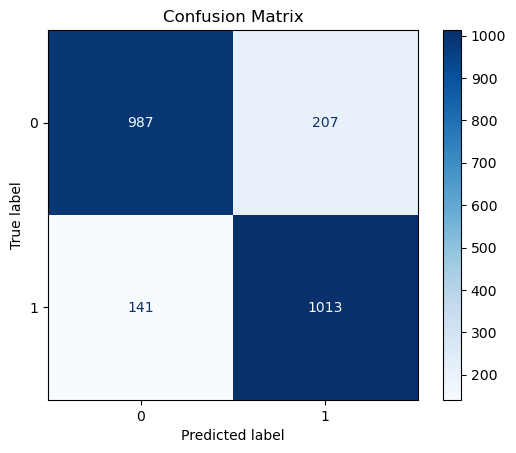

In [109]:
# Generate predictions
y_pred = best_model_mixup_filtered.predict(X_test)
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model_mixup_filtered.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


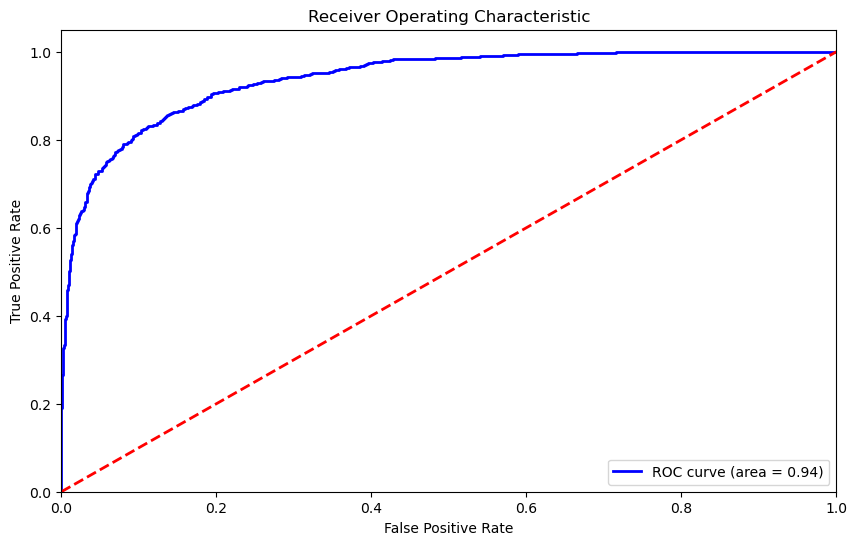

In [110]:
# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(y_test, best_model_mixup_filtered.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)
# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


### **KNN AUGMENTATION**

KNN Augmentation is a data‐augmentation technique in machine learning where synthetic examples are generated by interpolating each sample with its nearest neighbors. Concretely, given a dataset of samples $(x_i, y_i)$, for each sample $x_i$:

1. Find the set of its \(K\) nearest neighbors $\{x_{j_1}, x_{j_2}, \dots, x_{j_K}\}$ in the input space (e.g., by Euclidean distance).
2. Randomly select one neighbor $(x_j, y_j)$ from this set.
3. Draw a mixing coefficient $\lambda \in [0,1]$ (often sampled from a Beta distribution $\mathrm{Beta}(\alpha,\alpha)$).
4. Form a synthetic example:
   
   $$
   \tilde{x} = \lambda\,x_i + (1 - \lambda)\,x_j,
   \qquad
   \tilde{y} = \lambda\,y_i + (1 - \lambda)\,y_j.
   $$

By interpolating each sample only with one of its \(K\) nearest neighbors, KNN Augmentation encourages the model to be locally consistent in regions of high data density. This helps improve generalization, especially when classes are clustered, and can mitigate overfitting by effectively exploring the manifold on which the data lie.


In [111]:
from sklearn.neighbors import NearestNeighbors

In [112]:
def knn_binary_hardlabels_split(X_train, y_train, k, alpha, num_augmented_samples):


    X_train = X_train.values  # Convert DataFrame to numpy array
    y_train = y_train.values  # Convert Series to numpy array

    # Convert to numpy arrays if they're DataFrames
    if hasattr(X_train, 'values'):
        X_train = X_train.values
    if hasattr(y_train, 'values'):
        y_train = y_train.values
    
    y_train = y_train.astype(int)
    
    # Find k+1 neighbors (including self)
    nbrs = NearestNeighbors(n_neighbors=k+1).fit(X_train)
    _, indices = nbrs.kneighbors(X_train)

    synthetic_X = []
    synthetic_y = []

    for _ in range(num_augmented_samples):
        # Random base sample (using numpy indexing)
        base_idx = np.random.randint(len(X_train))
        # Get nearest neighbors (excluding self)
        neighbor_indices = indices[base_idx][1:].astype(int)  # Ensure integer indices
        neighbor_idx = np.random.choice(neighbor_indices)

        # Use numpy array indexing
        x_base, y_base = X_train[base_idx], y_train[base_idx]
        x_neighbor, y_neighbor = X_train[neighbor_idx], y_train[neighbor_idx]

        lam = np.random.beta(alpha, alpha)
        x_new = lam * x_base + (1 - lam) * x_neighbor
        y_new = y_base if lam >= 0.5 else y_neighbor

        synthetic_X.append(x_new)
        synthetic_y.append(y_new)

    synthetic_X = np.array(synthetic_X)
    synthetic_y = np.array(synthetic_y, dtype=int)
    
    return (
        np.concatenate([X_train, synthetic_X]),
        np.concatenate([y_train, synthetic_y])
    )

In [113]:
# Optimization loop adapted for array workflow
best_multiplier = 0
best_score = 0
k_value = 5
alpha_value = 0.2

for multiplier in multiplier_to_test:
    num_samples = int(multiplier * len(X_train))
    X_aug, y_aug = knn_binary_hardlabels_split(
        X_train, y_train,
        k=k_value,
        alpha=alpha_value,
        num_augmented_samples=num_samples
    )

    print(f"Initial: {len(X_train)}, Multiplier: {multiplier}, "
          f"New samples: {num_samples}, Total: {len(X_aug)}")

    # Scale data
    X_aug_scaled = scaler.fit_transform(X_aug)

    # Load fresh model
    mlp = load('best_mlp_model.joblib')
    mlp.fit(X_aug_scaled, y_aug)

    # Calculate scores
    train_score = mlp.score(X_aug_scaled, y_aug)
    val_score = mlp.score(X_val, y_val)
    test_score = mlp.score(X_test, y_test)

    print(f"Train: {train_score:.4f}, Val: {val_score:.4f}, Test: {test_score:.4f}")

    if val_score > best_score:
        best_score = val_score
        best_multiplier = multiplier
        # Store as DataFrame if needed (requires feature names)
        augmented_df_knn = pd.DataFrame(X_aug, columns=feature_names)
        augmented_df_knn['class'] = y_aug
        best_model = clone(mlp)


print(f"Best KNN multiplier: {best_multiplier} with val score: {best_score:.4f}")
print("Augmented DataFrame shape:", augmented_df_knn.shape)
augmented_df_knn.head()

Initial: 13690, Multiplier: 0.5, New samples: 6845, Total: 20535


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Train: 0.8935, Val: 0.8815, Test: 0.8944
Initial: 13690, Multiplier: 1.0, New samples: 13690, Total: 27380


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Train: 0.8962, Val: 0.8827, Test: 0.8893
Initial: 13690, Multiplier: 1.5, New samples: 20535, Total: 34225


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Train: 0.8923, Val: 0.8793, Test: 0.8863
Initial: 13690, Multiplier: 2.0, New samples: 27380, Total: 41070
Train: 0.8950, Val: 0.8741, Test: 0.8829
Best KNN multiplier: 1.0 with val score: 0.8827
Augmented DataFrame shape: (27380, 9)


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0


In [114]:
# Outlier detection using Z-score
z_scores_knn = np.abs(zscore(augmented_df_knn))
outliers_z_knn = (z_scores_knn > 3).sum(axis=0)
outliers_z_knn

pt1      179
eta1       0
phi1       0
Q1         0
pt2      205
eta2       0
phi2       0
Q2         0
class      0
dtype: int64

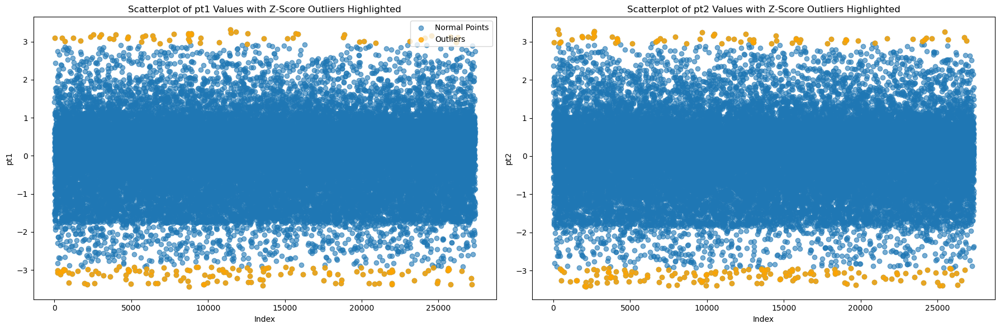

In [115]:
# Scatterplots for Event, pt1, and pt2 with Z-score outliers highlighted
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=False)

# Convert z_scores to a DataFrame for easier indexing
z_scores_df = pd.DataFrame(z_scores_knn, columns=augmented_df_knn.columns)

columns = ['pt1', 'pt2']
for i, col in enumerate(columns):
    # Identify outliers based on Z-score
    outlier_indices = z_scores_df[col] > 3
    
    # Plot all points
    axes[i].scatter(augmented_df_knn.index, augmented_df_knn[col], label='Normal Points', alpha=0.6)
    
    # Highlight outliers
    axes[i].scatter(augmented_df_knn.index[outlier_indices], augmented_df_knn[col][outlier_indices], color='orange', label='Outliers', alpha=0.8)
    
    axes[i].set_title(f'Scatterplot of {col} Values with Z-Score Outliers Highlighted')
    axes[i].set_xlabel('Index')
    axes[i].set_ylabel(col)

axes[0].legend()  # Add legend to the first subplot
plt.tight_layout()
plt.show()

In [116]:
# 3. Remove outliers detected using z-score statistics
z_scores_knn = np.abs(zscore(augmented_df_knn[['pt1', 'pt2']]))
mask_knn = (z_scores_knn < 3).all(axis=1)
augmented_df_knn_filtered = augmented_df_knn[mask_knn]
augmented_df_knn_filtered.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0


In [117]:
X_train_augmented_knn_filtered, y_train_augmented_knn_filtered = augmented_df_knn_filtered.drop(columns=['class']).values, augmented_df_knn_filtered['class'].values
X_train_augmented_knn_filtered_scaled = scaler.transform(X_train_augmented_knn_filtered)

In [118]:
best_model_knn_filtered = load('best_mlp_model.joblib')

In [119]:
best_model_knn_filtered.fit(X_train_augmented_knn_filtered_scaled, y_train_augmented_knn_filtered)

train_score_knn_filtered = best_model_knn_filtered.score(X_train_augmented_knn_filtered, y_train_augmented_knn_filtered)
print("Training set score after augmentation: ", train_score_knn_filtered)
# Evaluate the model on the validation set
val_score_knn_filtered = best_model_knn_filtered.score(X_val, y_val)
print("Validation set score after augmentation: ", val_score_knn_filtered)
# Evaluate the model on the test set
test_score_knn_filtered = best_model_knn_filtered.score(X_test, y_test)
print("Test set score after augmentation: ", test_score_knn_filtered)

Training set score after augmentation:  0.8769299122514718
Validation set score after augmentation:  0.8732954545454545
Test set score after augmentation:  0.8773424190800682


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


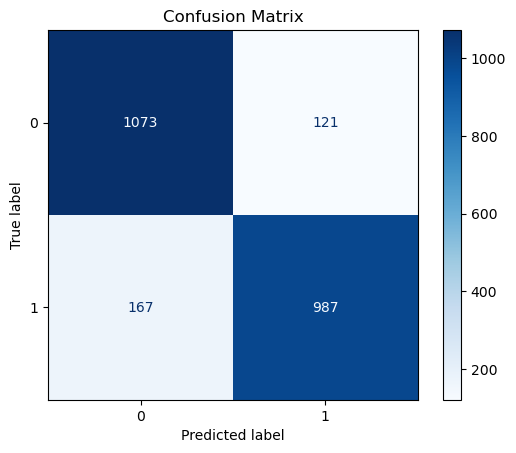

In [121]:
# Generate predictions
y_pred = best_model_knn_filtered.predict(X_test)
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model_knn_filtered.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


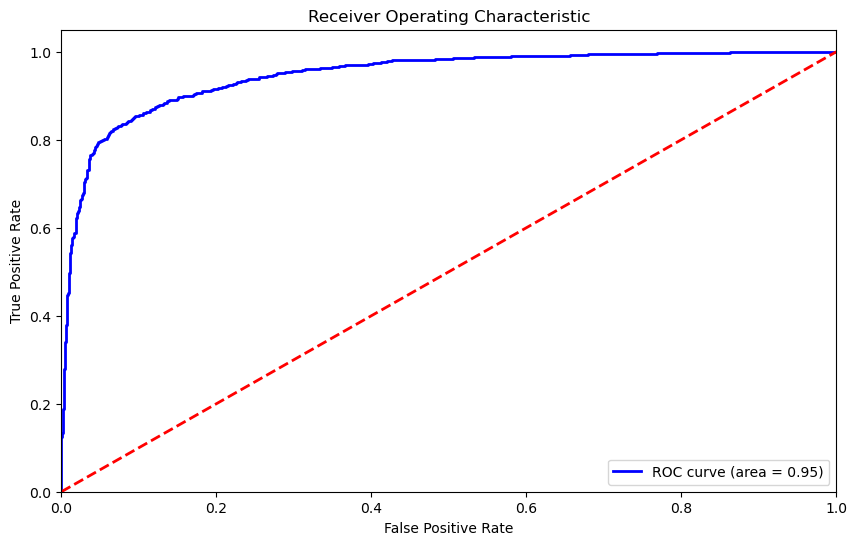

In [122]:
# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(y_test, best_model_knn_filtered.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)
# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


### **GAUSSIAN MIXTURE MODELS (Class-Specific)**

Gaussian Mixture Model (GMM) Augmentation is a data‐augmentation technique where synthetic examples are generated by fitting a Gaussian mixture to the data distribution of each class and then sampling new points. Concretely, for each class \(c\):

1. Let \(\{x_i^{(c)}\}\) be the training samples belonging to class \(c\).
2. Fit a GMM with \(K\) components to this class’s data:
   $$
   p(x \mid c) = \sum_{k=1}^{K} \pi_{k}^{(c)} \,\mathcal{N}\bigl(x \mid \mu_{k}^{(c)}, \Sigma_{k}^{(c)}\bigr),
   $$
   where \(\pi_{k}^{(c)}\) are the mixing proportions, \(\mu_{k}^{(c)}\) the means, and \(\Sigma_{k}^{(c)}\) the covariances.
3. To generate a synthetic example \((\tilde{x}, \tilde{y} = c)\):
   $$
   \begin{aligned}
   &\text{Draw a component index } z \sim \mathrm{Categorical}\bigl(\pi_{1}^{(c)}, \dots, \pi_{K}^{(c)}\bigr), \\
   &\text{Draw } \tilde{x} \sim \mathcal{N}\bigl(\mu_{z}^{(c)}, \Sigma_{z}^{(c)}\bigr), 
   \quad \tilde{y} = c.
   \end{aligned}
   $$

By sampling \(\tilde{x}\) from the learned Gaussian mixture for each class, GMM Augmentation produces realistic, class‐conditioned synthetic data that lies on the underlying data manifold. This can improve generalization, especially when the original dataset is small or imbalanced.



In [123]:
from sklearn.mixture import GaussianMixture


In [124]:
def gmm_binary_hardlabels_split(X_train, y_train, n_components, num_augmented_samples, random_state=None):
    # Convert to numpy arrays if pandas objects
    if hasattr(X_train, 'values'):
        X_train = X_train.values
    if hasattr(y_train, 'values'):
        y_train = y_train.values
    
    y_train = y_train.astype(int)
    features = X_train.shape[1]
    
    # Split data by class
    class_0_mask = y_train == 0
    class_1_mask = y_train == 1
    
    synthetic_X = []
    synthetic_y = []

    for class_label in [0, 1]:
        # Get class data
        X_class = X_train[y_train == class_label]
        if len(X_class) == 0:
            continue

        # Calculate proportional sampling
        class_prop = len(X_class) / len(X_train)
        num_class_samples = int(num_augmented_samples * class_prop)
        if num_class_samples == 0:
            continue

        # Adaptive component selection
        n_components_adj = min(n_components, len(X_class))
        if n_components_adj < 1:
            continue

        # Fit and sample from GMM
        gmm = GaussianMixture(n_components=n_components_adj, random_state=random_state)
        gmm.fit(X_class)
        X_synth, _ = gmm.sample(num_class_samples)

        synthetic_X.append(X_synth)
        synthetic_y.append(np.full(num_class_samples, class_label))

    # Combine synthetic data
    if synthetic_X:
        synthetic_X = np.vstack(synthetic_X)
        synthetic_y = np.concatenate(synthetic_y)
    else:
        synthetic_X = np.empty((0, features))
        synthetic_y = np.empty(0, dtype=int)

    return (
        np.concatenate([X_train, synthetic_X]),
        np.concatenate([y_train, synthetic_y])
    )

In [125]:
# Optimization parameters
best_multiplier = 0
best_score = 0
n_components = 2
feature_names = X_train.columns.tolist() if hasattr(X_train, 'columns') else [f'feature_{i}' for i in range(X_train.shape[1])]

# Convert data to numpy arrays if using pandas
X_train_array = X_train.values if hasattr(X_train, 'values') else X_train
y_train_array = y_train.values if hasattr(y_train, 'values') else y_train

for multiplier in multiplier_to_test:
    num_samples = int(multiplier * len(X_train_array))
    
    # Generate augmented data
    X_aug, y_aug = gmm_binary_hardlabels_split(
        X_train_array,
        y_train_array,
        n_components=n_components,
        num_augmented_samples=num_samples,
        random_state=42
    )
    
    print(f"Initial: {len(X_train_array)}, Multiplier: {multiplier}, "
          f"New samples: {num_samples}, Total: {len(X_aug)}")

    # Scale data
    X_aug_scaled = scaler.fit_transform(X_aug)

    # Load fresh model
    mlp = load('best_mlp_model.joblib')
    mlp.fit(X_aug_scaled, y_aug)

    # Evaluate
    train_score = mlp.score(X_aug_scaled, y_aug)
    val_score = mlp.score(X_val, y_val)
    test_score = mlp.score(X_test, y_test)

    print(f"Train: {train_score:.4f}, Val: {val_score:.4f}, Test: {test_score:.4f}")

    if val_score > best_score:
        best_score = val_score
        best_multiplier = multiplier
        
        # Store as DataFrame if needed
        augmented_df_gmm = pd.DataFrame(X_aug, columns=feature_names)
        augmented_df_gmm['class'] = y_aug
        best_model = clone(mlp)

print(f"Best GMM multiplier: {best_multiplier} with val score: {best_score:.4f}")
augmented_df_gmm.head()

Initial: 13690, Multiplier: 0.5, New samples: 6845, Total: 20535


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Train: 0.8552, Val: 0.8582, Test: 0.8701
Initial: 13690, Multiplier: 1.0, New samples: 13690, Total: 27380


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Train: 0.8686, Val: 0.8639, Test: 0.8680
Initial: 13690, Multiplier: 1.5, New samples: 20535, Total: 34225


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Train: 0.8556, Val: 0.7955, Test: 0.7909
Initial: 13690, Multiplier: 2.0, New samples: 27380, Total: 41070
Train: 0.8770, Val: 0.8278, Test: 0.8284
Best GMM multiplier: 1.0 with val score: 0.8639


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0


In [126]:
# Outlier detection using Z-score
z_scores_gmm = np.abs(zscore(augmented_df_gmm))
outliers_z_gmm = (z_scores_gmm > 3).sum(axis=0)
outliers_z_gmm

pt1      130
eta1      37
phi1      32
Q1        15
pt2      137
eta2      28
phi2      43
Q2        13
class      0
dtype: int64

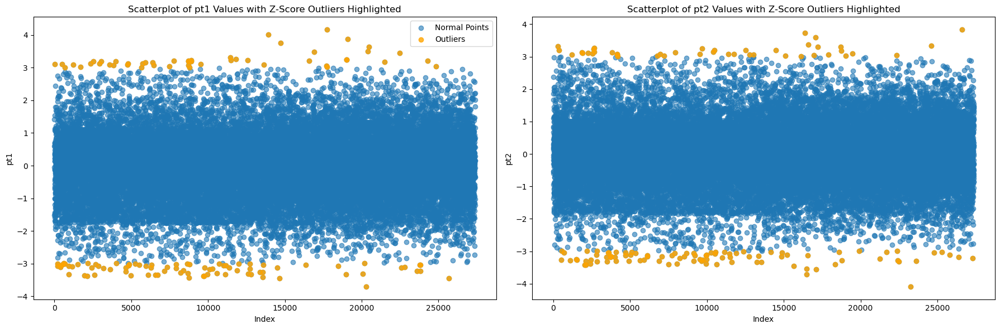

In [127]:
# Scatterplots for Event, pt1, and pt2 with Z-score outliers highlighted
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=False)

# Convert z_scores to a DataFrame for easier indexing
z_scores_df = pd.DataFrame(z_scores_gmm, columns=augmented_df_gmm.columns)

columns = ['pt1', 'pt2']
for i, col in enumerate(columns):
    # Identify outliers based on Z-score
    outlier_indices = z_scores_df[col] > 3
    
    # Plot all points
    axes[i].scatter(augmented_df_gmm.index, augmented_df_gmm[col], label='Normal Points', alpha=0.6)
    
    # Highlight outliers
    axes[i].scatter(augmented_df_gmm.index[outlier_indices], augmented_df_gmm[col][outlier_indices], color='orange', label='Outliers', alpha=0.8)
    
    axes[i].set_title(f'Scatterplot of {col} Values with Z-Score Outliers Highlighted')
    axes[i].set_xlabel('Index')
    axes[i].set_ylabel(col)

axes[0].legend()  # Add legend to the first subplot
plt.tight_layout()
plt.show()

In [128]:
# 3. Remove outliers detected using z-score statistics
z_scores_gmm = np.abs(zscore(augmented_df_gmm[['pt1', 'pt2']]))
mask_gmm = (z_scores_gmm < 3).all(axis=1)
augmented_df_gmm_filtered = augmented_df_gmm[mask_gmm]
augmented_df_gmm_filtered.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0


In [129]:
X_train_augmented_gmm_filtered, y_train_augmented_gmm_filtered = augmented_df_gmm_filtered.drop(columns=['class']).values, augmented_df_gmm_filtered['class'].values
X_train_augmented_gmm_filtered_scaled = scaler.transform(X_train_augmented_gmm_filtered)

In [130]:
best_model_gmm_filtered = load('best_mlp_model.joblib')

In [131]:
best_model_gmm_filtered.fit(X_train_augmented_gmm_filtered_scaled, y_train_augmented_gmm_filtered)

train_score_gmm_filtered = best_model_gmm_filtered.score(X_train_augmented_gmm_filtered, y_train_augmented_gmm_filtered)
print("Training set score after augmentation: ", train_score_gmm_filtered)
# Evaluate the model on the validation set
val_score_gmm_filtered = best_model_gmm_filtered.score(X_val, y_val)
print("Validation set score after augmentation: ", val_score_gmm_filtered)
# Evaluate the model on the test set
test_score_gmm_filtered = best_model_gmm_filtered.score(X_test, y_test)
print("Test set score after augmentation: ", test_score_gmm_filtered)

Training set score after augmentation:  0.8732991629484863
Validation set score after augmentation:  0.8613636363636363
Test set score after augmentation:  0.8603066439522998


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


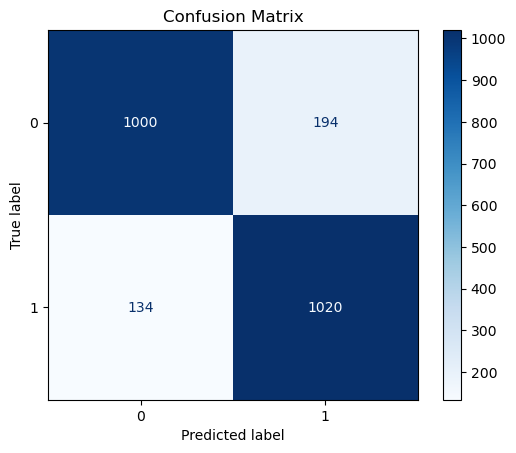

In [133]:
# Generate predictions
y_pred = best_model_gmm_filtered.predict(X_test)
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model_gmm_filtered.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


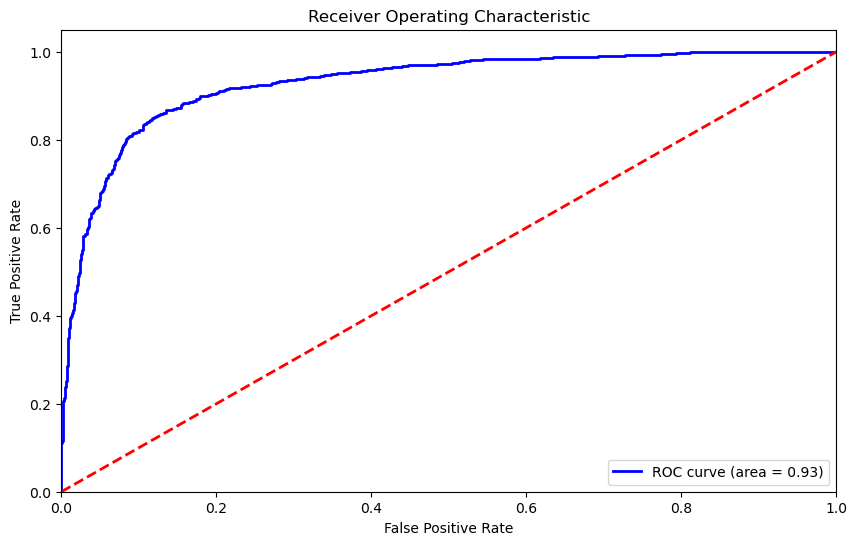

In [135]:
# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(y_test, best_model_gmm_filtered.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)
# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


### **FOREST-BASED SYNTHESIS**

Forest-Based Augmentation is a data augmentation technique that generates synthetic examples using the structure of a trained ensemble of decision trees (e.g., a random forest).


Let $\{(x_i, y_i)\}$ be the original dataset and $\mathcal{F} = \{T_1, T_2, \dots, T_T\}$ be a random forest trained on this data. For each tree $T_t$:
- Partitions feature space into disjoint leaves $\mathcal{L}^{(t)}$
- For leaf $\ell \in \mathcal{L}^{(t)}$:
  - Compute empirical mean $\mu_{\ell}^{(t)}$
  - Compute empirical covariance $\Sigma_{\ell}^{(t)}$



To generate $(\tilde{x}, \tilde{y})$:

1. **Select tree**  
   $t \sim \text{Uniform}(\{1,\dots,T\})$  
   
2. **Sample leaf**  
   $\ell \sim p_t(\ell) = \dfrac{\left|\{x_i : x_i \in \ell\}\right|}{\sum\limits_{\ell' \in \mathcal{L}^{(t)}} \left|\{x_i : x_i \in \ell'\}\right|}$  
   (Probability proportional to leaf occupancy)

3. **Draw features**  
   $\tilde{x} \sim \mathcal{N}\left(\mu_{\ell}^{(t)},\,\Sigma_{\ell}^{(t)}\right)$  
   (Multivariate Gaussian distribution)

4. **Assign label**  
   $\tilde{y} = \underset{\text{mode}}{\operatorname{argmax}}\bigl\{y_i : x_i \in \ell\bigr\}$  
   (Majority class in leaf)



A synthetic point $(\tilde{x}, \tilde{y})$ is generated by:
$$
\begin{aligned}
t &\sim \text{Uniform}(\{1,\dots,T\}) \\
\ell &\sim \text{Categorical}(p_t) \\
\tilde{x} &\sim \mathcal{N}\left(\mu_{\ell}^{(t)},\,\Sigma_{\ell}^{(t)}\right) \\
\tilde{y} &= \underset{\text{mode}}{\operatorname{argmax}}\{y_i : x_i \in \ell\}
\end{aligned}
$$


In [136]:
from sklearn.ensemble import RandomForestClassifier


In [ ]:
def forest_binary_hardlabels_split(X_train, y_train, num_trees, alpha, num_augmented_samples, random_state=None):
    # Convert to numpy arrays if pandas objects
    if hasattr(X_train, 'values'):
        X_train = X_train.values
    if hasattr(y_train, 'values'):
        y_train = y_train.values
        
    y_train = y_train.astype(int)
    features = X_train.shape[1]
    
    synthetic_X = []
    synthetic_y = []

    for class_label in [0, 1]:
        # Get class data
        class_mask = y_train == class_label
        X_class = X_train[class_mask]
        if len(X_class) < 2:
            continue

        # Calculate proportional sampling
        class_prop = len(X_class) / len(X_train)
        num_class_samples = int(num_augmented_samples * class_prop)
        if num_class_samples == 0:
            continue

        # Train class-specific forest
        rf = RandomForestClassifier(n_estimators=num_trees, random_state=random_state)
        rf.fit(X_class, np.full(len(X_class), class_label))  # Dummy labels

        # Generate synthetic samples
        samples_generated = 0
        while samples_generated < num_class_samples:
            tree = np.random.choice(rf.estimators_)
            leaf_ids = tree.apply(X_class)
            unique_leaves, counts = np.unique(leaf_ids, return_counts=True)
            valid_leaves = unique_leaves[counts >= 2]

            if valid_leaves.size == 0:
                continue

            # Leaf-based interpolation
            leaf = np.random.choice(valid_leaves)
            candidates = np.where(leaf_ids == leaf)[0]
            if len(candidates) < 2:
                continue
                
            i1, i2 = np.random.choice(candidates, 2, replace=False)
            lam = np.random.beta(alpha, alpha)
            x_new = lam * X_class[i1] + (1 - lam) * X_class[i2]
            
            synthetic_X.append(x_new)
            synthetic_y.append(class_label)
            samples_generated += 1

    # Combine synthetic data
    if synthetic_X:
        synthetic_X = np.array(synthetic_X)
        synthetic_y = np.array(synthetic_y, dtype=int)
    else:
        synthetic_X = np.empty((0, features))
        synthetic_y = np.empty(0, dtype=int)

    return (
        np.concatenate([X_train, synthetic_X]),
        np.concatenate([y_train, synthetic_y])
    )

In [138]:
# Optimization parameters
best_multiplier = 0
best_score = 0
num_trees = 50

# Convert to numpy arrays
X_train_array = X_train.values if hasattr(X_train, 'values') else X_train
y_train_array = y_train.values if hasattr(y_train, 'values') else y_train

for multiplier in multiplier_to_test:
    num_samples = int(multiplier * len(X_train_array))
    
    # Generate augmented data
    X_aug, y_aug = forest_binary_hardlabels_split(
        X_train_array,
        y_train_array,
        num_trees=num_trees,
        alpha=0.2,
        num_augmented_samples=num_samples,
        random_state=42
    )
    
    print(f"Initial: {len(X_train_array)}, Multiplier: {multiplier}, "
          f"New samples: {num_samples}, Total: {len(X_aug)}")

    # Scale data
    X_aug_scaled = scaler.fit_transform(X_aug)

    # Load fresh model
    mlp = load('best_mlp_model.joblib')
    mlp.fit(X_aug_scaled, y_aug)

    # Evaluate
    train_score = mlp.score(X_aug_scaled, y_aug)
    val_score = mlp.score(X_val, y_val)
    test_score = mlp.score(X_test, y_test)

    print(f"Train: {train_score:.4f}, Val: {val_score:.4f}, Test: {test_score:.4f}")

    if val_score > best_score:
        best_score = val_score
        best_multiplier = multiplier
        
        # Store as DataFrame if needed
        augmented_df_forest = pd.DataFrame(X_aug, columns=feature_names)
        augmented_df_forest['class'] = y_aug
        best_model = clone(mlp)

print(f"Best Forest multiplier: {best_multiplier} with val score: {best_score:.4f}")
augmented_df_forest.head()

Initial: 13690, Multiplier: 0.5, New samples: 6845, Total: 20535


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Train: 0.8605, Val: 0.8636, Test: 0.8697
Initial: 13690, Multiplier: 1.0, New samples: 13690, Total: 27380


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Train: 0.8690, Val: 0.8642, Test: 0.8765
Initial: 13690, Multiplier: 1.5, New samples: 20535, Total: 34225


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Train: 0.8581, Val: 0.8693, Test: 0.8773
Initial: 13690, Multiplier: 2.0, New samples: 27380, Total: 41070
Train: 0.8574, Val: 0.8605, Test: 0.8684
Best Forest multiplier: 1.5 with val score: 0.8693


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0


In [139]:
# Outlier detection using Z-score
z_scores_forest = np.abs(zscore(augmented_df_forest))
outliers_z_forest = (z_scores_forest > 3).sum(axis=0)
outliers_z_forest

pt1      254
eta1       0
phi1       0
Q1         0
pt2      293
eta2       7
phi2       0
Q2         0
class      0
dtype: int64

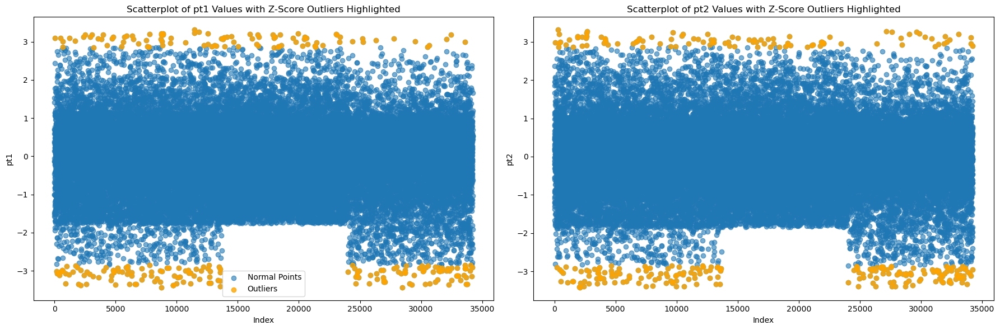

In [140]:
# Scatterplots for Event, pt1, and pt2 with Z-score outliers highlighted
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=False)

# Convert z_scores to a DataFrame for easier indexing
z_scores_df = pd.DataFrame(z_scores_forest, columns=augmented_df_forest.columns)

columns = ['pt1', 'pt2']
for i, col in enumerate(columns):
    # Identify outliers based on Z-score
    outlier_indices = z_scores_df[col] > 3
    
    # Plot all points
    axes[i].scatter(augmented_df_forest.index, augmented_df_forest[col], label='Normal Points', alpha=0.6)
    
    # Highlight outliers
    axes[i].scatter(augmented_df_forest.index[outlier_indices], augmented_df_forest[col][outlier_indices], color='orange', label='Outliers', alpha=0.8)
    
    axes[i].set_title(f'Scatterplot of {col} Values with Z-Score Outliers Highlighted')
    axes[i].set_xlabel('Index')
    axes[i].set_ylabel(col)

axes[0].legend()  # Add legend to the first subplot
plt.tight_layout()
plt.show()

In [141]:
# 3. Remove outliers detected using z-score statistics
z_scores_forest = np.abs(zscore(augmented_df_forest[['pt1', 'pt2']]))
mask_forest = (z_scores_forest < 3).all(axis=1)
augmented_df_forest_filtered = augmented_df_forest[mask_forest]
augmented_df_forest_filtered.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0


In [142]:
X_train_augmented_forest_filtered, y_train_augmented_forest_filtered = augmented_df_forest_filtered.drop(columns=['class']).values, augmented_df_forest_filtered['class'].values
X_train_augmented_forest_filtered_scaled = scaler.transform(X_train_augmented_forest_filtered)

In [143]:
best_model_forests_filtered = load('best_mlp_model.joblib')

In [144]:
best_model_forests_filtered.fit(X_train_augmented_forest_filtered_scaled, y_train_augmented_forest_filtered)

train_score_forests_filtered = best_model_forests_filtered.score(X_train_augmented_forest_filtered, y_train_augmented_forest_filtered)
print("Training set score after augmentation: ", train_score_forests_filtered)
# Evaluate the model on the validation set
val_score_forests_filtered = best_model_forests_filtered.score(X_val, y_val)
print("Validation set score after augmentation: ", val_score_forests_filtered)
# Evaluate the model on the test set
test_score_forests_filtered = best_model_forests_filtered.score(X_test, y_test)
print("Test set score after augmentation: ", test_score_forests_filtered)

Training set score after augmentation:  0.8452705910277711
Validation set score after augmentation:  0.8556818181818182
Test set score after augmentation:  0.870954003407155


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


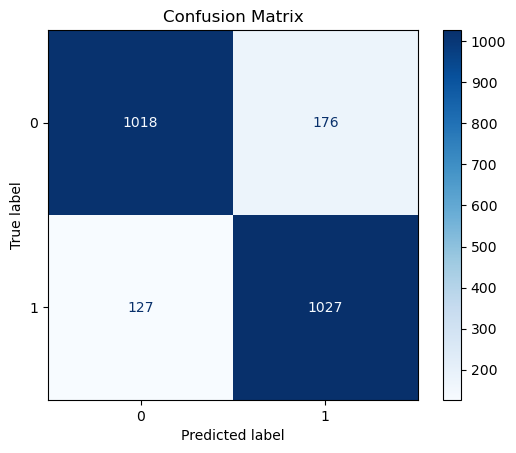

In [146]:
# Generate predictions
y_pred = best_model_forests_filtered.predict(X_test)
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model_forests_filtered.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


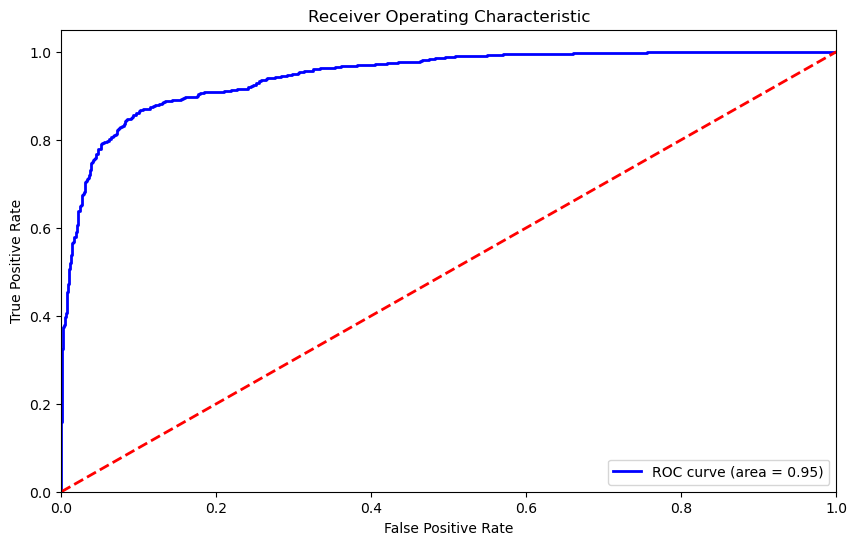

In [147]:
# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(y_test, best_model_forests_filtered.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)
# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


### **RULE-BASED SYNTHESIS**

Rule‐Based Synthesis is a data‐augmentation technique where synthetic examples are generated by applying predefined transformation rules or heuristics to existing samples. Concretely, let \((x_i, y_i)\) be an original sample and let $\mathcal{R} = \{r_1, r_2, \dots, r_M\}$ be a set of transformation rules. Each rule $r \in \mathcal{R}$ is a deterministic or semi‐deterministic function that modifies \(x_i\) while preserving its label (or adjusting it if necessary). Formally:

$$
\tilde{x} = r(x_i), 
\qquad 
\tilde{y} = y_i,
\quad
r \in \mathcal{R}.
$$

In practice, the procedure is:

1. **Select** an original sample $(x_i, y_i)$.  
2. **Choose** a rule \(r\) (either uniformly at random or according to some strategy).  
3. **Compute** $\tilde{x} = r(x_i)$ and set $\tilde{y} = y_i$.  
4. **Add** $(\tilde{x}, \tilde{y})$ to the augmented dataset.  


For this particular case we implemented it with this features:
- **Rules are dynamically learned** from decision tree paths rather than being predefined  
- For each class (binary 0/1), a decision tree partitions the feature space into hyperrectangles defined by:  
  \[
  \mathcal{R}_{\text{class}} = \bigcup_{\text{leaves}} \left\{ (f_j, \text{op}, \tau) \mid \text{op} \in \{ \leq, > \} \right\}
  \]
- **Transformations combine noise injection and constraint projection**:  
  1. Inject Gaussian noise: \(\tilde{x}_{\text{noisy}} = x_i + \mathcal{N}(0, \sigma)\)  
  2. Project onto rule boundaries:  
     \[
     \tilde{x}_j = 
     \begin{cases} 
     \tau & \text{if } (f_j, \leq, \tau) \in \mathcal{R}_{\text{leaf}} \text{ and } \tilde{x}_{\text{noisy},j} > \tau \\
     \tau + \epsilon & \text{if } (f_j, >, \tau) \in \mathcal{R}_{\text{leaf}} \text{ and } \tilde{x}_{\text{noisy},j} \leq \tau \\
     \tilde{x}_{\text{noisy},j} & \text{otherwise}
     \end{cases}
     \]
- **Label preservation** is guaranteed through class-specific rule application

In [148]:
from sklearn.tree import DecisionTreeClassifier, _tree
from collections import defaultdict


In [149]:
def rule_binary_hardlabels_split(X_train, y_train, rule_depth, noise_std, num_augmented_samples, random_state=None):
    # Convert to numpy arrays if pandas objects
    if hasattr(X_train, 'values'):
        X_train = X_train.values
    if hasattr(y_train, 'values'):
        y_train = y_train.values
        
    y_train = y_train.astype(int)
    n_features = X_train.shape[1]
    np.random.seed(random_state)

    synthetic_X = []
    synthetic_y = []

    for class_label in [0, 1]:
        class_mask = y_train == class_label
        X_class = X_train[class_mask]
        if len(X_class) < 2:
            continue

        # Train interpretable rule tree
        tree = DecisionTreeClassifier(max_depth=rule_depth, random_state=random_state)
        tree.fit(X_class, np.full(len(X_class), class_label))

        # Extract decision paths using feature indices
        leaf_ids = tree.apply(X_class)
        node_rules = defaultdict(list)

        tree_ = tree.tree_
        def recurse(node, path):
            if tree_.feature[node] == _tree.TREE_UNDEFINED:
                leaf_id = node
                node_rules[leaf_id] = path
                return
            feat_idx = tree_.feature[node]  # Use feature index instead of name
            threshold = tree_.threshold[node]
            recurse(tree_.children_left[node], path + [(feat_idx, '<=', threshold)])
            recurse(tree_.children_right[node], path + [(feat_idx, '>', threshold)])

        recurse(0, [])

        # Calculate proportional sampling
        class_prop = len(X_class) / len(X_train)
        num_class_samples = int(num_augmented_samples * class_prop)

        # Generate samples per leaf
        unique_leaves, counts = np.unique(leaf_ids, return_counts=True)
        for leaf_id, count in zip(unique_leaves, counts):
            leaf_mask = (leaf_ids == leaf_id)
            X_leaf = X_class[leaf_mask]

            if len(X_leaf) == 0:
                continue

            rule_weight = count / len(X_class)
            num_rule_samples = int(num_class_samples * rule_weight)

            for _ in range(num_rule_samples):
                base_sample = X_leaf[np.random.choice(len(X_leaf))]
                noisy_sample = base_sample + np.random.normal(0, noise_std, base_sample.shape)

                # Enforce rule constraints using feature indices
                for (feat_idx, op, thresh) in node_rules[leaf_id]:
                    if op == '<=' and noisy_sample[feat_idx] > thresh:
                        noisy_sample[feat_idx] = thresh
                    elif op == '>' and noisy_sample[feat_idx] <= thresh:
                        noisy_sample[feat_idx] = thresh + 1e-6

                synthetic_X.append(noisy_sample)
                synthetic_y.append(class_label)

    # Combine synthetic data
    if synthetic_X:
        synthetic_X = np.array(synthetic_X)
        synthetic_y = np.array(synthetic_y, dtype=int)
    else:
        synthetic_X = np.empty((0, n_features))
        synthetic_y = np.empty(0, dtype=int)

    return (
        np.concatenate([X_train, synthetic_X]),
        np.concatenate([y_train, synthetic_y])
    )

In [150]:
# Optimization parameters
best_multiplier = 0
best_score = 0
rule_depth = 3
noise_std = 0.1

# Convert to numpy arrays
X_train_array = X_train.values if hasattr(X_train, 'values') else X_train
y_train_array = y_train.values if hasattr(y_train, 'values') else y_train

for multiplier in multiplier_to_test:
    num_samples = int(multiplier * len(X_train_array))
    
    # Generate augmented data
    X_aug, y_aug = rule_binary_hardlabels_split(
        X_train_array,
        y_train_array,
        rule_depth=rule_depth,
        noise_std=noise_std,
        num_augmented_samples=num_samples,
        random_state=42
    )
    
    print(f"Initial: {len(X_train_array)}, Multiplier: {multiplier}, "
          f"New samples: {num_samples}, Total: {len(X_aug)}")

    # Scale data
    X_aug_scaled = scaler.fit_transform(X_aug)

    # Load fresh model
    mlp = load('best_mlp_model.joblib')
    mlp.fit(X_aug_scaled, y_aug)

    # Evaluate
    train_score = mlp.score(X_aug_scaled, y_aug)
    val_score = mlp.score(X_val, y_val)
    test_score = mlp.score(X_test, y_test)

    print(f"Train: {train_score:.4f}, Val: {val_score:.4f}, Test: {test_score:.4f}")

    if val_score > best_score:
        best_score = val_score
        best_multiplier = multiplier
        
        # Store as DataFrame if needed
        augmented_df_rb = pd.DataFrame(X_aug, columns=feature_names)
        augmented_df_rb['class'] = y_aug
        best_model = clone(mlp)

print(f"Best Rule multiplier: {best_multiplier} with val score: {best_score:.4f}")
augmented_df_rb.head()

Initial: 13690, Multiplier: 0.5, New samples: 6845, Total: 20535


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Train: 0.8660, Val: 0.8662, Test: 0.8778
Initial: 13690, Multiplier: 1.0, New samples: 13690, Total: 27380


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Train: 0.8564, Val: 0.8628, Test: 0.8675
Initial: 13690, Multiplier: 1.5, New samples: 20535, Total: 34225


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


Train: 0.8633, Val: 0.8656, Test: 0.8735
Initial: 13690, Multiplier: 2.0, New samples: 27380, Total: 41070
Train: 0.8640, Val: 0.8722, Test: 0.8769
Best Rule multiplier: 2.0 with val score: 0.8722


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0


In [151]:
z_scores_rb = np.abs(zscore(augmented_df_rb))
outliers_z_rb = (z_scores_rb > 3).sum(axis=0)
outliers_z_rb

pt1      274
eta1       0
phi1       0
Q1         0
pt2      290
eta2       4
phi2       0
Q2         0
class      0
dtype: int64

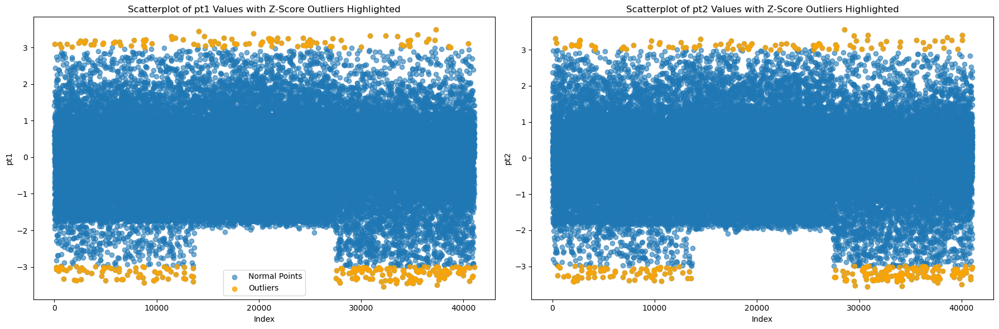

In [152]:
# Scatterplots for Event, pt1, and pt2 with Z-score outliers highlighted
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=False)

# Convert z_scores to a DataFrame for easier indexing
z_scores_df = pd.DataFrame(z_scores_rb, columns=augmented_df_rb.columns)

columns = ['pt1', 'pt2']
for i, col in enumerate(columns):
    # Identify outliers based on Z-score
    outlier_indices = z_scores_df[col] > 3
    
    # Plot all points
    axes[i].scatter(augmented_df_rb.index, augmented_df_rb[col], label='Normal Points', alpha=0.6)
    
    # Highlight outliers
    axes[i].scatter(augmented_df_rb.index[outlier_indices], augmented_df_rb[col][outlier_indices], color='orange', label='Outliers', alpha=0.8)
    
    axes[i].set_title(f'Scatterplot of {col} Values with Z-Score Outliers Highlighted')
    axes[i].set_xlabel('Index')
    axes[i].set_ylabel(col)

axes[0].legend()  # Add legend to the first subplot
plt.tight_layout()
plt.show()

In [153]:
# 3. Remove outliers detected using z-score statistics
z_scores_rb = np.abs(zscore(augmented_df_rb[['pt1', 'pt2']]))
mask_rb = (z_scores_rb < 3).all(axis=1)
augmented_df_rb_filtered = augmented_df_rb[mask_rb]
augmented_df_rb_filtered.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0


In [154]:
X_train_augmented_rb_filtered, y_train_augmented_rb_filtered = augmented_df_rb_filtered.drop(columns=['class']).values, augmented_df_rb_filtered['class'].values
X_train_augmented_rb_filtered_scaled = scaler.transform(X_train_augmented_rb_filtered)

In [155]:
best_model_rb_filtered = load('best_mlp_model.joblib')

In [156]:
best_model_rb_filtered.fit(X_train_augmented_rb_filtered_scaled, y_train_augmented_rb_filtered)

train_score_rb_filtered = best_model_rb_filtered.score(X_train_augmented_rb_filtered, y_train_augmented_rb_filtered)
print("Training set score after augmentation: ", train_score_rb_filtered)
# Evaluate the model on the validation set
val_score_rb_filtered = best_model_rb_filtered.score(X_val, y_val)
print("Validation set score after augmentation: ", val_score_rb_filtered)
# Evaluate the model on the test set
test_score_rb_filtered = best_model_rb_filtered.score(X_test, y_test)
print("Test set score after augmentation: ", test_score_rb_filtered)

Training set score after augmentation:  0.8637743392315096
Validation set score after augmentation:  0.8701704545454545
Test set score after augmentation:  0.883304940374787


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


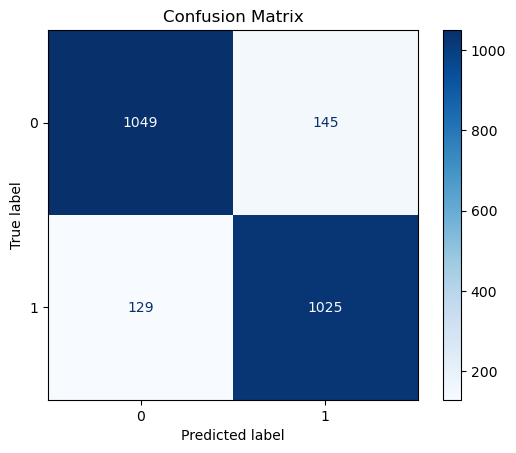

In [157]:
# Generate predictions
y_pred = best_model_rb_filtered.predict(X_test)
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model_rb_filtered.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


c:\Users\tommy\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(


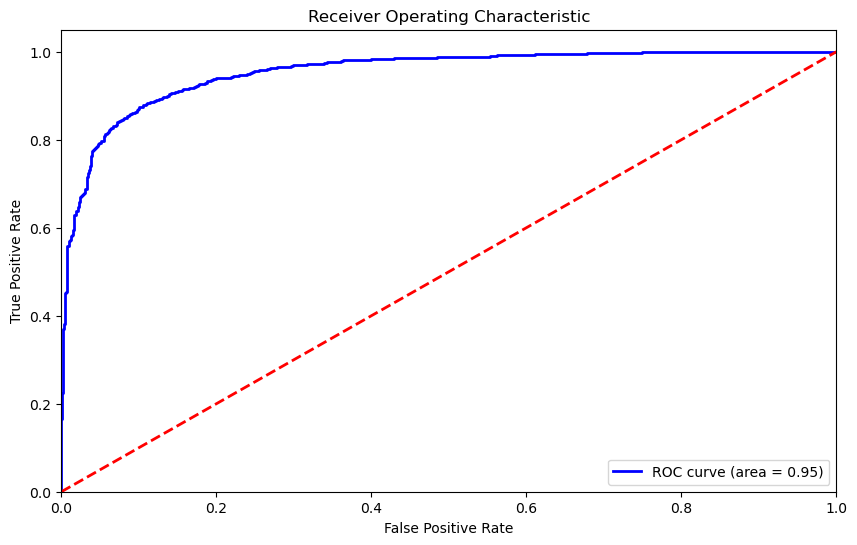

In [158]:
# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(y_test, best_model_rb_filtered.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)
# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


### **DATA AUGMENTATION USING WGAN**

In this section we tried to generate new data with phisic meaningful quantities in order to see if a data augmentation based on the data generated by a WGAN could have better results than mixup data augmentation.


In [159]:
from torch.utils.data import DataLoader, TensorDataset
import torch
from WGAN_architecture import *
from WGAN_GP_architecture_parallelized_v2 import *
from EBGAN_architecture import *
from PerformanceMeasures import *
from VAE_architecture import Q1Q2_correction
from PreprocessingPipeline import Preprocessor
random.seed(42)
prep = Preprocessor(log_transform_threshold=1.0)

#### **ZMUMU**

In this section we train our WGAN model to reproduce the data for the Zmumu decay.

The training data for the WGAN is made up of data relative to Zmumu decay coming from the training dataset of our MLP.

In [160]:
X_zmumu_train_scaled = X_train[y_train == 1]
X_zmumu_train_scaled

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
13105,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0
15648,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0
18461,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0
18890,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0
16403,-0.140427,-0.679308,1.020669,-1.0,0.455251,0.109181,-1.022141,1.0
...,...,...,...,...,...,...,...,...
14423,0.386422,-1.206243,-0.466655,1.0,0.803613,-1.952355,1.051891,-1.0
16850,-0.348962,-1.240054,-0.565854,-1.0,-2.487039,0.793396,1.099423,1.0
11284,-2.474643,-0.865976,-1.604952,1.0,2.526983,-0.158936,-0.001202,-1.0
11964,0.921192,-0.111949,-0.807645,-1.0,-0.465002,0.567157,0.517795,1.0


In [161]:
tensor_data_zmumu_train = torch.tensor(X_zmumu_train_scaled.values, dtype=torch.float32)
dataloader_zmumu_train = DataLoader(TensorDataset(tensor_data_zmumu_train), batch_size=64, shuffle=True)

In [162]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
wgangp_zmumu_generator = WGANGP(data_dim=X_zmumu_train_scaled.shape[1], device=device)
wgangp_zmumu_generator.train_model(dataloader_zmumu_train, n_epochs=100)

c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:49: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_G = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_C = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:99: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(self.device.type == 'cuda')):
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `tor

In [163]:
import torch
torch.multiprocessing.set_sharing_strategy('file_system')  # Add this

In [164]:
#hyperparameter tuning

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
best_params_zmumu_wganpgp_generator, results_zmumu_wgang_generator = tune_wgangp_hyperparameters(
    data=X_zmumu_train_scaled,
    latent_dims=[64, 128],
    hidden_dims=[64, 128, 256],
    lrs=[1e-4, 5e-5],
    lambda_gps=[5, 10, 20],
    n_critics=[5, 10],
    batch_sizes=[64, 128, 256],
    betas_list=[(0.0, 0.9), (0.5, 0.9)],
    eval_fn=lambda model: eval_fn_wasserstein(model, real_data=X_zmumu_train_scaled),
    search_mode='random',
    device=device
)


Best config: latent_dim=64, hidden_dim=256, lr=0.0001, lambda_gp=20, n_critic=10, batch_size=64, betas=(0.0, 0.9)
Best score: 0.2069


In [165]:
best_params_zmumu_wganpgp_generator = (64, 256, 1e-4, 5, 10, 64, (0.0, 0.9))

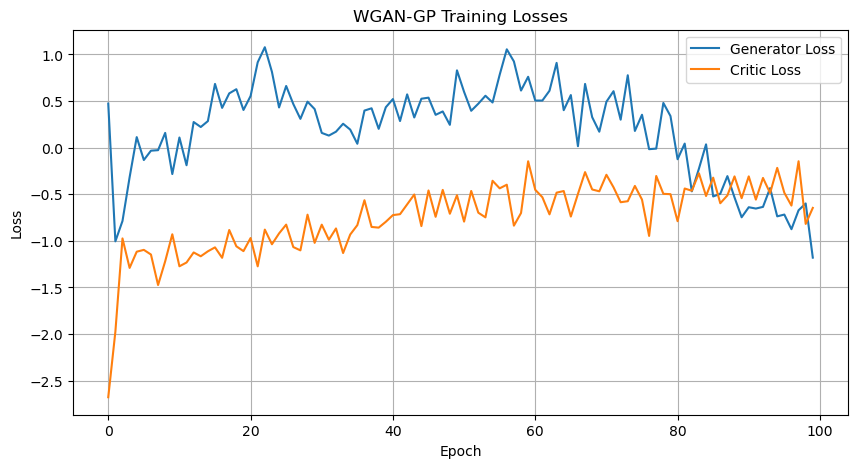

In [166]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess the data
dataloader_zmumu_train = DataLoader(TensorDataset(tensor_data_zmumu_train), batch_size=best_params_zmumu_wganpgp_generator[5], shuffle=True)

# Instantiate the model with best parameters
best_model_wgangp_zmumu_generator = WGANGP(
    data_dim=X_zmumu_train_scaled.shape[1],
    latent_dim=best_params_zmumu_wganpgp_generator[0],
    hidden_dim=best_params_zmumu_wganpgp_generator[1],
    lr=best_params_zmumu_wganpgp_generator[2],
    lambda_gp=best_params_zmumu_wganpgp_generator[3],
    n_critic=best_params_zmumu_wganpgp_generator[4],
    device=device
)

# Set optimizer betas from best_params
best_model_wgangp_zmumu_generator.optimizer_G = torch.optim.Adam(best_model_wgangp_zmumu_generator.generator.parameters(), lr=best_params_zmumu_wganpgp_generator[2], betas=best_params_zmumu_wganpgp_generator[6])
best_model_wgangp_zmumu_generator.optimizer_C = torch.optim.Adam(best_model_wgangp_zmumu_generator.critic.parameters(), lr=best_params_zmumu_wganpgp_generator[2], betas=best_params_zmumu_wganpgp_generator[6])

# Train the model
best_model_wgangp_zmumu_generator.train_model(dataloader_zmumu_train, n_epochs=100)

# Plot training curves
best_model_wgangp_zmumu_generator.plot_losses()

In [167]:
# Generate synthetic data
Zmumu_best_wganGP_augmentation = best_model_wgangp_zmumu_generator.generate(10000)
# Transform data into pd dataframe
Zmumu_best_wganGP_augmentation = pd.DataFrame(Zmumu_best_wganGP_augmentation, columns=X_zmumu_train_scaled.columns)
# Binazrize Q1 and Q2
Zmumu_best_wganGP_augmentation = Q1Q2_correction(Zmumu_best_wganGP_augmentation)
Zmumu_best_wganGP_augmentation.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,0.783235,0.795379,-1.331346,1.0,-0.519976,0.172575,0.109761,-1.0
1,0.488085,-1.131215,-1.237149,1.0,1.092208,-2.959446,0.428248,-1.0
2,-0.410476,-1.026680,0.388627,1.0,-0.285125,-0.376713,-1.304824,-1.0
3,-0.605380,-1.344228,0.694176,-1.0,-0.253137,-0.070139,0.562729,1.0
4,1.162713,-0.479347,-0.363226,-1.0,0.700850,-0.556258,1.123203,1.0


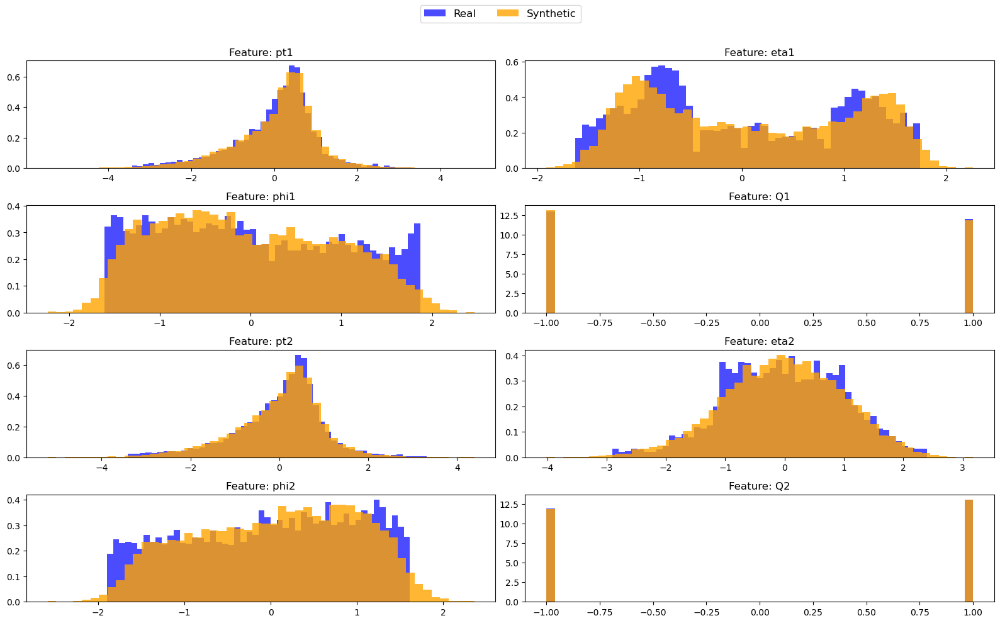

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.049318,0.033882,1.776810e-04,0.040976,0.000937
1,eta1,0.077123,0.054751,5.387132e-11,0.066593,0.001229
2,phi1,0.071056,0.040351,3.608480e-06,0.061109,0.002199
3,Q1,0.012374,0.006187,9.974779e-01,0.012374,0.000073
4,pt2,0.035295,0.015673,2.691739e-01,0.022895,0.000404
5,eta2,0.036714,0.023199,2.506736e-02,0.030601,0.000613
6,phi2,0.075168,0.044503,2.069679e-07,0.065059,0.002487
7,Q2,0.001877,0.000938,1.000000e+00,0.001877,-0.000001
8,OVERALL,0.044865,0.027436,NaN,0.037685,0.000993


In [168]:
overall_performance(X_zmumu_train_scaled, Zmumu_best_wganGP_augmentation)

#### **ZEE**

In this section we train our WGAN model to reproduce the data for the Zee decay.

The training data for the WGAN is made up of data relative to Zee decay coming from the training dataset of our MLP.

In [169]:
X_zee_train_scaled = X_train[y_train == 0]
X_zee_train_scaled

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
2357,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0
4664,0.705874,-1.324340,1.633599,-1.0,-0.034212,-0.389557,-0.422580,1.0
7275,-1.578396,-0.346079,0.369703,-1.0,-0.539732,-1.676560,-1.510492,-1.0
4127,0.355689,1.875630,1.184444,-1.0,1.100394,1.276639,-0.575266,1.0
5707,0.141115,-0.954221,-0.184094,-1.0,0.167613,-1.477398,1.505983,1.0
...,...,...,...,...,...,...,...,...
8322,0.710498,-0.851028,-1.327504,1.0,0.426693,-0.411330,0.373786,-1.0
4426,-0.180586,-0.660875,0.100617,-1.0,0.075299,0.252240,-1.708344,1.0
6265,0.367719,0.376767,1.476307,1.0,0.671112,0.567156,-0.436075,-1.0
5390,-0.686498,2.103217,0.797017,-1.0,0.117564,0.808543,-1.056071,1.0


In [170]:
tensor_data_zee_train = torch.tensor(X_zee_train_scaled.values, dtype=torch.float32)
dataloader_zee_train = DataLoader(TensorDataset(tensor_data_zee_train), batch_size=64, shuffle=True)

In [171]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
wgangp_zee_generator = WGANGP(data_dim=X_zee_train_scaled.shape[1], device=device)
wgangp_zee_generator.train_model(dataloader_zee_train, n_epochs=100)

c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:49: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_G = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler_C = torch.cuda.amp.GradScaler(enabled=(self.device.type == 'cuda'))
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:99: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(self.device.type == 'cuda')):
c:\Users\tommy\Desktop\ML report\WGAN_GP_architecture_parallelized_v2.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `tor

In [172]:
#hyperparameter tuning

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
best_params_zee_wganpgp_generator, results_zee_wgang_generator = tune_wgangp_hyperparameters(
    data=X_zee_train_scaled,
    latent_dims=[64, 128],
    hidden_dims=[64, 128, 256],
    lrs=[1e-4, 5e-5],
    lambda_gps=[5, 10, 20],
    n_critics=[5, 10],
    batch_sizes=[64, 128, 256],
    betas_list=[(0.0, 0.9), (0.5, 0.9)],
    eval_fn=lambda model: eval_fn_wasserstein(model, real_data=X_zee_train_scaled),
    search_mode='random',
    device=device
)


Best config: latent_dim=64, hidden_dim=256, lr=0.0001, lambda_gp=20, n_critic=10, batch_size=64, betas=(0.0, 0.9)
Best score: 0.2131


In [173]:
best_params_zee_wganpgp_generator= (64, 128, 1e-4, 5, 10, 256, (0.0, 0.9))

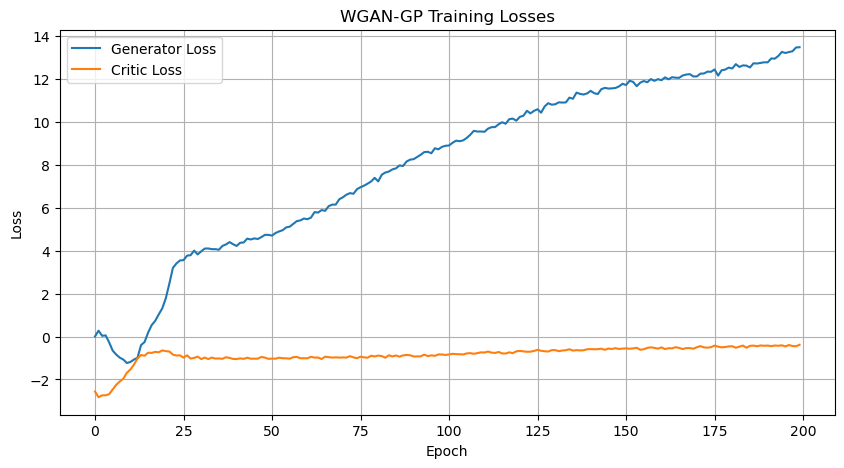

In [174]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Preprocess the data
dataloader_zee_train = DataLoader(TensorDataset(tensor_data_zee_train), batch_size=best_params_zee_wganpgp_generator[5], shuffle=True)

# Instantiate the model with best parameters
best_model_wgangp_zee_generator = WGANGP(
    data_dim=X_zee_train_scaled.shape[1],
    latent_dim=best_params_zee_wganpgp_generator[0],
    hidden_dim=best_params_zee_wganpgp_generator[1],
    lr=best_params_zee_wganpgp_generator[2],
    lambda_gp=best_params_zee_wganpgp_generator[3],
    n_critic=best_params_zee_wganpgp_generator[4],
    device=device
)

# Set optimizer betas from best_params
best_model_wgangp_zee_generator.optimizer_G = torch.optim.Adam(best_model_wgangp_zee_generator.generator.parameters(), lr=best_params_zee_wganpgp_generator[2], betas=best_params_zee_wganpgp_generator[6])
best_model_wgangp_zee_generator.optimizer_C = torch.optim.Adam(best_model_wgangp_zee_generator.critic.parameters(), lr=best_params_zee_wganpgp_generator[2], betas=best_params_zee_wganpgp_generator[6])

# Train the model
best_model_wgangp_zee_generator.train_model(dataloader_zee_train, n_epochs=200)

# Plot training curves
best_model_wgangp_zee_generator.plot_losses()

In [175]:
# Generate synthetic data
Zee_best_wganGP_augmentation = best_model_wgangp_zee_generator.generate(10000)
# Transform data into pd dataframe
Zee_best_wganGP_augmentation = pd.DataFrame(Zee_best_wganGP_augmentation, columns=X_zee_train_scaled.columns)
# Binazrize Q1 and Q2
Zee_best_wganGP_augmentation = Q1Q2_correction(Zee_best_wganGP_augmentation)
Zee_best_wganGP_augmentation

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,-0.775296,0.075685,-0.981864,1.0,1.282089,0.103323,0.645109,-1.0
1,0.351908,-1.038461,-1.254896,1.0,1.691476,-1.134395,0.493176,-1.0
2,-1.694429,0.390621,0.627935,-1.0,-0.880024,-1.089253,-1.126149,1.0
3,-0.733557,-0.261128,1.434462,-1.0,-1.642006,-1.676835,-0.180939,1.0
4,0.158902,-0.416436,-0.672369,1.0,-0.000491,0.746213,0.871120,-1.0
...,...,...,...,...,...,...,...,...
9995,-0.281128,-0.981919,-0.859952,-1.0,0.928996,-0.590653,0.902576,1.0
9996,1.423690,0.459554,-1.000904,-1.0,0.436429,0.288769,-1.095630,1.0
9997,0.836575,0.584680,0.291531,-1.0,-2.028042,1.546049,-1.008515,-1.0
9998,0.016189,1.144379,1.252178,1.0,-0.397332,0.422189,0.164281,1.0


In [176]:
#check if Q1 and Q2 are binarized
#i want to see all q1 values in a vector
Zee_best_wganGP_augmentation["Q1"].unique()


array([ 1., -1.], dtype=float32)

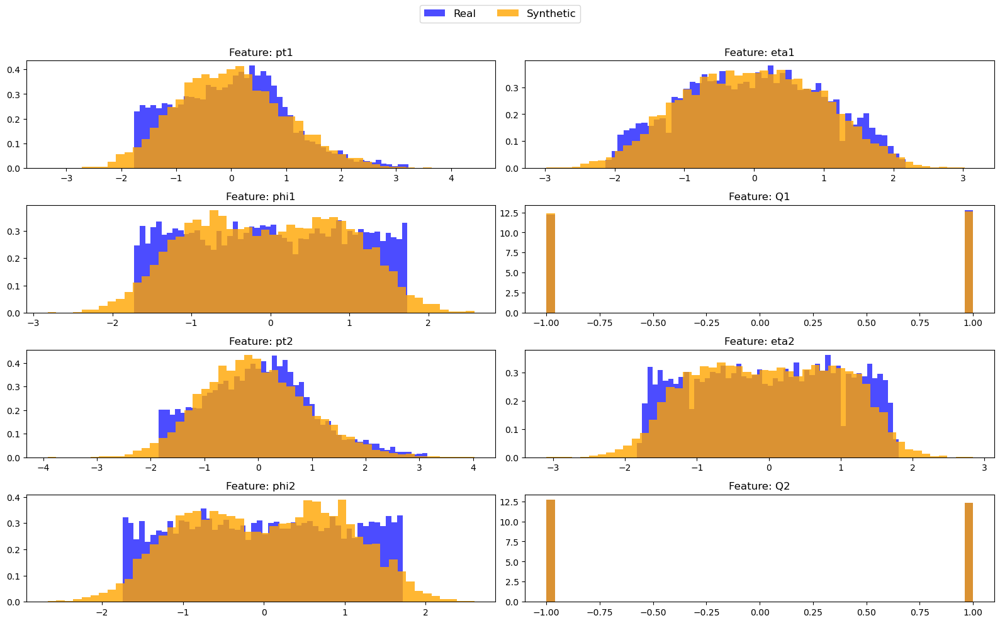

,feature,wasserstein,ks_statistic,p_value,energy_distance,mmd
0,pt1,0.068020,0.037741,1.744178e-05,0.053430,0.002447
1,eta1,0.044420,0.022821,2.806075e-02,0.032710,0.000797
2,phi1,0.077837,0.045087,1.210772e-07,0.064416,0.002976
3,Q1,0.009118,0.004559,9.999944e-01,0.009118,0.000042
4,pt2,0.087262,0.053514,1.365153e-10,0.070299,0.002731
5,eta2,0.056117,0.031991,4.616296e-04,0.044827,0.001461
6,phi2,0.071901,0.042324,8.709776e-07,0.058203,0.002380
7,Q2,0.004055,0.002027,1.000000e+00,0.004055,0.000009
8,OVERALL,0.052341,0.030008,NaN,0.042132,0.001605


In [177]:
overall_performance(X_zee_train_scaled, Zee_best_wganGP_augmentation)

#### **20% AUGMENTATION VIA WGAN**


We firstly tried to augment our dataset by approximately the 20%.

After creating new data from the WGANs, we filtered the new augmented dataset since the WGAN-generated data had some outliers and our model was trained to classify cleaned data.

We followed the filtering approach also used  in the EDA section.

In [178]:
#generate synthetic data
Zmumu_best_wganGP_augmentation_20 = best_model_wgangp_zmumu_generator.generate(1400)
# Transform data into pd dataframe
Zmumu_best_wganGP_augmentation_20 = pd.DataFrame(Zmumu_best_wganGP_augmentation_20, columns=X_zmumu_train_scaled.columns)
# Binazrize Q1 and Q2
Zmumu_best_wganGP_augmentation_20 = Q1Q2_correction(Zmumu_best_wganGP_augmentation_20)

y_zmumu_train_augmented_wganGP_20 = np.ones(len(Zmumu_best_wganGP_augmentation_20))

Zee_best_wganGP_augmentation_20 = best_model_wgangp_zee_generator.generate(1400)
# Transform data into pd dataframe
Zee_best_wganGP_augmentation_20 = pd.DataFrame(Zee_best_wganGP_augmentation_20, columns=X_zee_train_scaled.columns)
# Binazrize Q1 and Q2
Zee_best_wganGP_augmentation_20 = Q1Q2_correction(Zee_best_wganGP_augmentation_20)

y_zee_train_augmented_wganGP_20 = np.zeros(len(Zee_best_wganGP_augmentation_20))

#i want to add the new data to the training set
X_train_augmented_wganGP_20 = pd.concat([X_train, Zmumu_best_wganGP_augmentation_20, Zee_best_wganGP_augmentation_20], ignore_index=True)


In [179]:
X_train_augmented_wganGP_20 

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0
...,...,...,...,...,...,...,...,...
16485,-0.750252,-0.693136,-1.371204,-1.0,-0.046624,-0.804191,0.329627,1.0
16486,0.860156,0.269048,-0.405016,1.0,-0.596391,-0.435723,1.257983,-1.0
16487,1.205067,-0.737444,0.929633,1.0,-0.945440,0.059662,-0.856356,-1.0
16488,-0.944878,-0.712482,0.588035,1.0,-0.458824,-0.386316,-0.802035,1.0


In [180]:
#y of training set is obtained by concatenating the y of the original training set and the y of the augmented data
y_train_augmented_wganGP_20 = np.concatenate((y_train, y_zmumu_train_augmented_wganGP_20, y_zee_train_augmented_wganGP_20))
len(y_train_augmented_wganGP_20)


16490

In [181]:
#merge X and y
train_augmented_wganGP_20 = pd.DataFrame(X_train_augmented_wganGP_20)
train_augmented_wganGP_20["class"] = y_train_augmented_wganGP_20
train_augmented_wganGP_20.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1.0
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1.0
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1.0
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1.0
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0.0


In [182]:
# Outlier detection using Z-score
z_scores = np.abs(zscore(train_augmented_wganGP_20))
outliers_z = (z_scores > 3).sum(axis=0)
outliers_z

pt1      123
eta1       0
phi1       0
Q1         0
pt2      119
eta2       4
phi2       0
Q2         0
class      0
dtype: int64

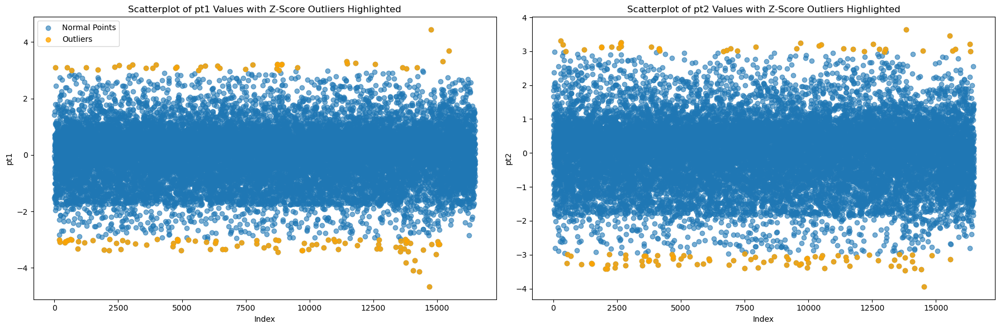

In [183]:
# Scatterplots for Event, pt1, and pt2 with Z-score outliers highlighted
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=False)

# Convert z_scores to a DataFrame for easier indexing
z_scores_df = pd.DataFrame(z_scores, columns=train_augmented_wganGP_20.columns)

columns = ['pt1', 'pt2']
for i, col in enumerate(columns):
    # Identify outliers based on Z-score
    outlier_indices = z_scores_df[col] > 3
    
    # Plot all points
    axes[i].scatter(train_augmented_wganGP_20.index, train_augmented_wganGP_20[col], label='Normal Points', alpha=0.6)
    
    # Highlight outliers
    axes[i].scatter(train_augmented_wganGP_20.index[outlier_indices], train_augmented_wganGP_20[col][outlier_indices], color='orange', label='Outliers', alpha=0.8)
    
    axes[i].set_title(f'Scatterplot of {col} Values with Z-Score Outliers Highlighted')
    axes[i].set_xlabel('Index')
    axes[i].set_ylabel(col)

axes[0].legend()  # Add legend to the first subplot
plt.tight_layout()
plt.show()

In [184]:
# 3. Remove outliers detected using z-score statistics
z_scores_zmumu = np.abs(zscore(train_augmented_wganGP_20[['pt1', 'pt2']]))
mask_zmumu = (z_scores_zmumu < 3).all(axis=1)
train_augmented_wganGP_20 = train_augmented_wganGP_20[mask_zmumu]

train_augmented_wganGP_20

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1.0
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1.0
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1.0
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1.0
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0.0
...,...,...,...,...,...,...,...,...,...
16485,-0.750252,-0.693136,-1.371204,-1.0,-0.046624,-0.804191,0.329627,1.0,0.0
16486,0.860156,0.269048,-0.405016,1.0,-0.596391,-0.435723,1.257983,-1.0,0.0
16487,1.205067,-0.737444,0.929633,1.0,-0.945440,0.059662,-0.856356,-1.0,0.0
16488,-0.944878,-0.712482,0.588035,1.0,-0.458824,-0.386316,-0.802035,1.0,0.0


In [185]:
# load mlp wgan 20

mlp_wgan_20 = load('best_mlp_model.joblib')


In [186]:
mlp_wgan_20.fit(X_train_augmented_wganGP_20, y_train_augmented_wganGP_20)

MLPClassifier(activation='logistic', alpha=9.749762207436125e-05, batch_size=32,
              beta_1=0.8294692990607266, beta_2=0.9996742744563893,
              early_stopping=True, hidden_layer_sizes=(200,),
              learning_rate_init=0.008508340610643312, max_iter=500,
              momentum=0.881796365650328, power_t=0.32291717138928916,
              random_state=42)

In [187]:
#i want to evaluate the model on the augmented training set
train_score_wgan_20 = mlp_wgan_20.score(X_train_augmented_wganGP_20, y_train_augmented_wganGP_20)
val_score_wgan_20 = mlp_wgan_20.score(X_val, y_val)
test_score_wgan_20 = mlp_wgan_20.score(X_test, y_test)
print("Training set score: ", train_score_wgan_20)
print("Validation set score: ", val_score_wgan_20)
print("Test set score: ", test_score_wgan_20)

Training set score:  0.869981807155852
Validation set score:  0.8747159090909091
Test set score:  0.8816013628620102


In [188]:
print(type(X_train_augmented_wganGP_20))
print(type(X_val))
print(type(X_test))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


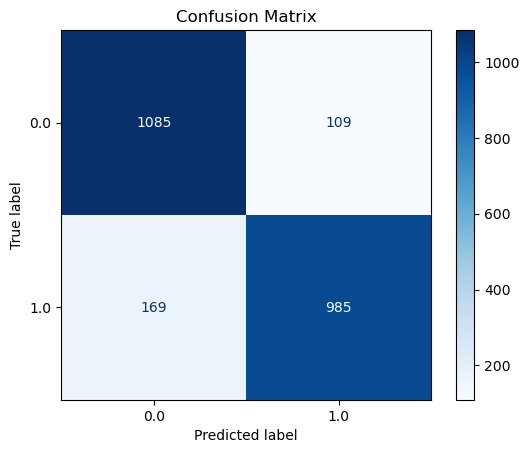

In [189]:
# Generate predictions
y_pred_wgan_20 = mlp_wgan_20.predict(X_test)
# Compute confusion matrix
cm_wgan_20 = confusion_matrix(y_test, y_pred_wgan_20)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_wgan_20, display_labels=mlp_wgan_20.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


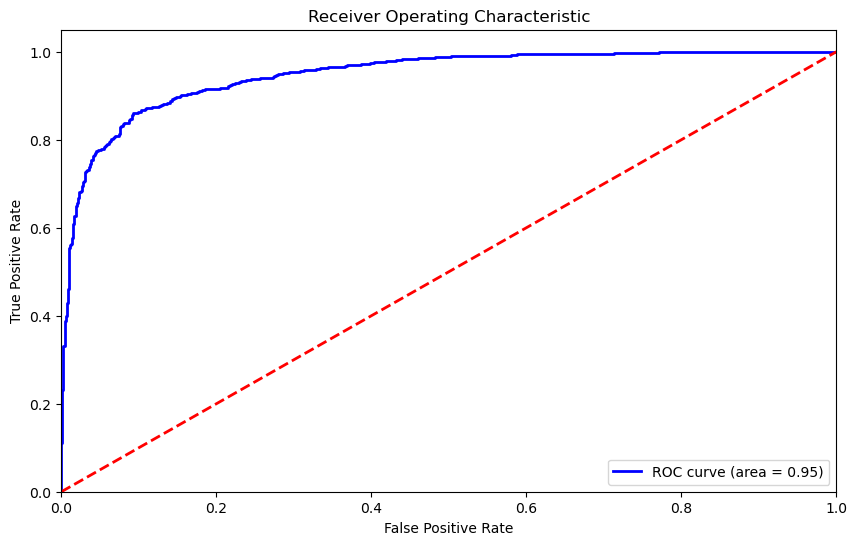

In [190]:
# Compute ROC curve and ROC area
fpr_wgan_20, tpr_wgan_20, thresholds_wgan_20 = roc_curve(y_test, mlp_wgan_20.predict_proba(X_test)[:, 1])
roc_auc_wgan_20 = auc(fpr_wgan_20, tpr_wgan_20)
# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr_wgan_20, tpr_wgan_20, color='blue', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc_wgan_20))
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

old model had a small improvement (like 0.001) in performance with a 20% add of synthetic data


#### **50% AUGMENTATION**

We firstly tried to augment our dataset by approximately the 50%.

After creating new data from the WGANs, we filtered the new augmented dataset since the WGAN-generated data had some outliers and our model was trained to classify cleaned data.

We followed the filtering approach also used  in the EDA section.

In [191]:
#we try to add 50% of training set size (i.e. 3500 zmumu and 3500 zee) to the training set
#generate synthetic data
Zmumu_best_wganGP_augmentation_50 = best_model_wgangp_zmumu_generator.generate(3500)
# Transform data into pd dataframe
Zmumu_best_wganGP_augmentation_50 = pd.DataFrame(Zmumu_best_wganGP_augmentation_50, columns=X_zmumu_train_scaled.columns)
# Binazrize Q1 and Q2
Zmumu_best_wganGP_augmentation_50 = Q1Q2_correction(Zmumu_best_wganGP_augmentation_50)

y_zmumu_train_augmented_wganGP_50 = np.ones(len(Zmumu_best_wganGP_augmentation_50))

Zee_best_wganGP_augmentation_50 = best_model_wgangp_zee_generator.generate(3500)
# Transform data into pd dataframe
Zee_best_wganGP_augmentation_50 = pd.DataFrame(Zee_best_wganGP_augmentation_50, columns=X_zee_train_scaled.columns)
# Binazrize Q1 and Q2
Zee_best_wganGP_augmentation_50 = Q1Q2_correction(Zee_best_wganGP_augmentation_50)

y_zee_train_augmented_wganGP_50 = np.zeros(len(Zee_best_wganGP_augmentation_50))

#i want to add the new data to the training set
X_train_augmented_wganGP_50 = pd.concat([X_train, Zmumu_best_wganGP_augmentation_50, Zee_best_wganGP_augmentation_50], ignore_index=True)
X_train_augmented_wganGP_50

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0
...,...,...,...,...,...,...,...,...
20685,0.897984,-0.724863,-1.633288,-1.0,-0.264746,-1.501431,0.298864,1.0
20686,0.307205,0.502355,1.424003,1.0,0.776774,0.445123,-0.222656,-1.0
20687,-0.669826,0.238387,0.041453,1.0,-2.295547,1.163539,0.161312,-1.0
20688,0.510028,1.554114,-0.258641,1.0,1.078021,2.267302,-0.747440,-1.0


In [192]:
y_train_augmented_wganGP_50 = np.concatenate((y_train, y_zmumu_train_augmented_wganGP_50, y_zee_train_augmented_wganGP_50))
len(y_train_augmented_wganGP_50)

20690

In [193]:
#merge X and y
train_augmented_wganGP_50 = pd.DataFrame(X_train_augmented_wganGP_50)
train_augmented_wganGP_50["class"] = y_train_augmented_wganGP_50
train_augmented_wganGP_50

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1.0
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1.0
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1.0
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1.0
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0.0
...,...,...,...,...,...,...,...,...,...
20685,0.897984,-0.724863,-1.633288,-1.0,-0.264746,-1.501431,0.298864,1.0,0.0
20686,0.307205,0.502355,1.424003,1.0,0.776774,0.445123,-0.222656,-1.0,0.0
20687,-0.669826,0.238387,0.041453,1.0,-2.295547,1.163539,0.161312,-1.0,0.0
20688,0.510028,1.554114,-0.258641,1.0,1.078021,2.267302,-0.747440,-1.0,0.0


In [194]:
# Outlier detection using Z-score
z_scores = np.abs(zscore(train_augmented_wganGP_50))
outliers_z = (z_scores > 3).sum(axis=0)
outliers_z

pt1      151
eta1       2
phi1       0
Q1         0
pt2      147
eta2      10
phi2       1
Q2         0
class      0
dtype: int64

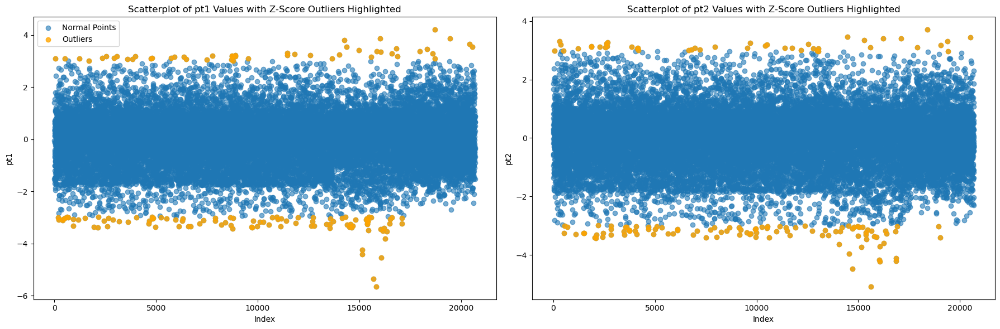

In [195]:
# Scatterplots for Event, pt1, and pt2 with Z-score outliers highlighted
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=False)

# Convert z_scores to a DataFrame for easier indexing
z_scores_df = pd.DataFrame(z_scores, columns=train_augmented_wganGP_50.columns)

columns = ['pt1', 'pt2']
for i, col in enumerate(columns):
    # Identify outliers based on Z-score
    outlier_indices = z_scores_df[col] > 3
    
    # Plot all points
    axes[i].scatter(train_augmented_wganGP_50.index, train_augmented_wganGP_50[col], label='Normal Points', alpha=0.6)
    
    # Highlight outliers
    axes[i].scatter(train_augmented_wganGP_50.index[outlier_indices], train_augmented_wganGP_50[col][outlier_indices], color='orange', label='Outliers', alpha=0.8)
    
    axes[i].set_title(f'Scatterplot of {col} Values with Z-Score Outliers Highlighted')
    axes[i].set_xlabel('Index')
    axes[i].set_ylabel(col)

axes[0].legend()  # Add legend to the first subplot
plt.tight_layout()
plt.show()

In [196]:
# 3. Remove outliers detected using z-score statistics
z_scores_zmumu = np.abs(zscore(train_augmented_wganGP_50[['pt1', 'pt2']]))
mask_zmumu = (z_scores_zmumu < 3).all(axis=1)
train_augmented_wganGP_50 = train_augmented_wganGP_50[mask_zmumu]

train_augmented_wganGP_50

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1.0
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1.0
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1.0
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1.0
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0.0
...,...,...,...,...,...,...,...,...,...
20685,0.897984,-0.724863,-1.633288,-1.0,-0.264746,-1.501431,0.298864,1.0,0.0
20686,0.307205,0.502355,1.424003,1.0,0.776774,0.445123,-0.222656,-1.0,0.0
20687,-0.669826,0.238387,0.041453,1.0,-2.295547,1.163539,0.161312,-1.0,0.0
20688,0.510028,1.554114,-0.258641,1.0,1.078021,2.267302,-0.747440,-1.0,0.0


In [197]:
mlp_wgan_50 = load('best_mlp_model.joblib')

In [198]:
mlp_wgan_50.fit(X_train_augmented_wganGP_50, y_train_augmented_wganGP_50)

MLPClassifier(activation='logistic', alpha=9.749762207436125e-05, batch_size=32,
              beta_1=0.8294692990607266, beta_2=0.9996742744563893,
              early_stopping=True, hidden_layer_sizes=(200,),
              learning_rate_init=0.008508340610643312, max_iter=500,
              momentum=0.881796365650328, power_t=0.32291717138928916,
              random_state=42)

In [199]:
#i want to evaluate the model on the augmented training set
train_score_wgan_50 = mlp_wgan_50.score(X_train_augmented_wganGP_50, y_train_augmented_wganGP_50)
val_score_wgan_50 = mlp_wgan_50.score(X_val, y_val)
test_score_wgan_50 = mlp_wgan_50.score(X_test, y_test)
print("Training set score: ", train_score_wgan_50)
print("Validation set score: ", val_score_wgan_50)
print("Test set score: ", test_score_wgan_50)

Training set score:  0.8524407926534557
Validation set score:  0.8590909090909091
Test set score:  0.8641396933560477


In [200]:
print(type(X_train_augmented_wganGP_50))
print(type(X_val))
print(type(X_test))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


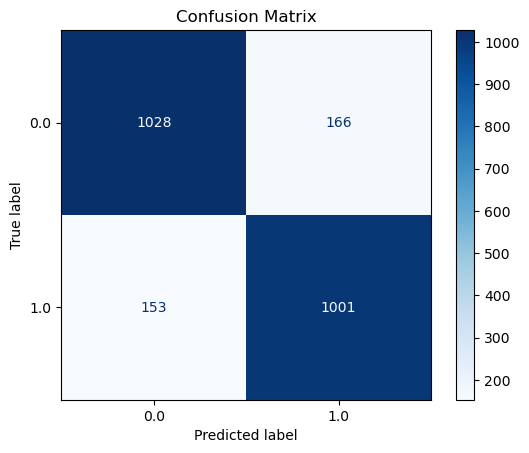

In [201]:
# Generate predictions
y_pred_wgan_50 = mlp_wgan_50.predict(X_test)
# Compute confusion matrix
cm_wgan_50 = confusion_matrix(y_test, y_pred_wgan_50)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_wgan_50, display_labels=mlp_wgan_50.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()


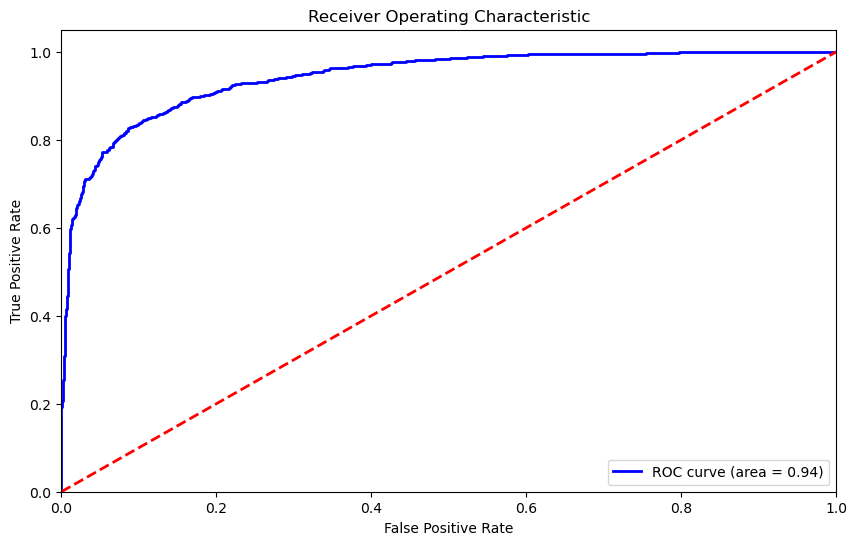

In [202]:
# Compute ROC curve and ROC area
fpr_wgan_50, tpr_wgan_50, thresholds_wgan_50 = roc_curve(y_test, mlp_wgan_50.predict_proba(X_test)[:, 1])
roc_auc_wgan_50 = auc(fpr_wgan_50, tpr_wgan_50)
# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr_wgan_50, tpr_wgan_50, color='blue', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc_wgan_50))
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

adding 50% of new data didn't work better than 20%

### **BEST DATA AUGMENTATION TECHNIQUE**

Taking all outputs from both non augmented data and augmented dataset (both with and without filtration) find the best model.

Watch the validation score of each model. If there is a tie or two models have similar performances, inspect also the testing scores.

In [203]:
val_scores = [
    
    ("val_score", val_score),  # standard MLP no augmentation

    ("val_score_mixup_filtered", val_score_mixup_filtered),  # mixup augmentation
    ("val_score_knn_filtered", val_score_knn_filtered),  # KNN augmentation
    ("val_score_gmm_filtered", val_score_gmm_filtered),  # GMM augmentation
    ("val_score_forest_filtered", val_score_forests_filtered),  # Random Forest augmentation
    ("val_score_rule_filtered", val_score_rb_filtered),  # Rule-based augmentation
    ("val_score_wgan_20", val_score_wgan_20),  # WGAN augmentation with 20% of training set size
    ("val_score_wgan_50", val_score_wgan_50)  # WGAN augmentation with 50% of training set size
]
sorted_vals = sorted(val_scores, key=lambda x: x[1], reverse=True)
names_validation = [name for name, value in sorted_vals]
values_validation = [value for name, value in sorted_vals]

print("Sorted Names:", names_validation)
print("Sorted Values:", values_validation)

Sorted Names: ['val_score_wgan_20', 'val_score_knn_filtered', 'val_score', 'val_score_rule_filtered', 'val_score_gmm_filtered', 'val_score_wgan_50', 'val_score_forest_filtered', 'val_score_mixup_filtered']
Sorted Values: [0.8747159090909091, 0.8732954545454545, 0.8721590909090909, 0.8701704545454545, 0.8613636363636363, 0.8590909090909091, 0.8556818181818182, 0.8494318181818182]


In [204]:
test_scores = [
    
    ("test_score", test_score),  # standard MLP no augmentation
    
    ("test_score_mixup_filtered", test_score_mixup_filtered),  # mixup augmentation
    ("test_score_knn_filtered", test_score_knn_filtered),  # KNN augmentation
    ("test_score_gmm_filtered", test_score_gmm_filtered),  # GMM augmentation
    ("test_score_forest_filtered", test_score_forests_filtered),  # Random Forest augmentation
    ("test_score_rule_filtered", test_score_rb_filtered),  # Rule-based augmentation
    ("test_score_wgan_20", test_score_wgan_20),  # WGAN augmentation with 20% of training set size
    ("test_score_wgan_50", test_score_wgan_50)  # WGAN augmentation with 50% of training set size
]
sorted_tests = sorted(test_scores, key=lambda x: x[1], reverse=True)
names_testidation = [name for name, testue in sorted_tests]
testues_testidation = [testue for name, testue in sorted_tests]

print("Sorted Names:", names_testidation)
print("Sorted testues:", testues_testidation)

Sorted Names: ['test_score_rule_filtered', 'test_score_wgan_20', 'test_score_knn_filtered', 'test_score', 'test_score_forest_filtered', 'test_score_wgan_50', 'test_score_gmm_filtered', 'test_score_mixup_filtered']
Sorted testues: [0.883304940374787, 0.8816013628620102, 0.8773424190800682, 0.876916524701874, 0.870954003407155, 0.8641396933560477, 0.8603066439522998, 0.8517887563884157]


The best data augmetnation technique is the RULE BASED SYNTHESIS one with validation score 0.8701 and validation score 0.8833

Mixup D.A. + filtration is the best combination

In [258]:
# save  best augmented dataset (mixup filtered)

augmented_df_mixup_filtered.to_csv('best_data_augm.csv', index=False)

## **8. TENSORFLOW MLP WITH DROPOUT**

Given the MLP trained before with sk-learn, we wanted to implement also the dropout regularization technique but it is not available in sk-learn library.

So we need to change from sk-learn to tensorflow: create an MLP using TF with hyperparameters equal to the best ones found in sk-learn section.

In [206]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras_tuner import RandomSearch
import keras_tuner


In [207]:
class MLPHyperModel(keras_tuner.HyperModel):
    def __init__(self, input_shape):
        super().__init__()
        self.input_shape = input_shape

    def build(self, hp):
        model = keras.Sequential()

        # 1. Hidden Layer Configuration (Single Source of Truth)
        hidden_layer_choice = hp.Choice('hidden_layer_sizes', [
            '50', '100', '200',
            '50-50', '100-50', '200-100',
            '100-100', '150-100-50'
        ])
        hidden_layers = [int(units) for units in hidden_layer_choice.split('-')]

        # 2. Shared Hyperparameters (Defined Once)
        activation = hp.Choice('activation', ['relu', 'tanh', 'sigmoid'])
        alpha = hp.Float('alpha', 1e-6, 1e-2, sampling='log')
        dropout_rate = hp.Choice('dropout_rate', [0.0, 0.1, 0.2, 0.3, 0.4, 0.5])

        # 3. Layer Construction Loop (No Redundancy)
        for i, units in enumerate(hidden_layers):
            # First layer specifies input shape
            if i == 0:
                model.add(layers.Dense(
                    units,
                    activation=activation,
                    kernel_regularizer=keras.regularizers.l2(alpha),
                    input_shape=self.input_shape
                ))
            else:
                model.add(layers.Dense(
                    units,
                    activation=activation,
                    kernel_regularizer=keras.regularizers.l2(alpha)
                ))
            model.add(layers.Dropout(dropout_rate))

        # 4. Output Layer
        model.add(layers.Dense(1, activation='sigmoid'))

        # 5. Optimizer Configuration (Conditional Logic)
        optimizer_type = hp.Choice('optimizer', ['adam', 'sgd'])
        learning_rate = hp.Float('learning_rate_init', 1e-5, 1e-2, sampling='log')
        
        if optimizer_type == 'adam':
            optimizer = keras.optimizers.Adam(
                learning_rate=learning_rate,
                beta_1=hp.Float('beta_1', 0.8, 0.999),
                beta_2=hp.Float('beta_2', 0.9, 0.9999)
            )
        else:
            optimizer = keras.optimizers.SGD(
                learning_rate=learning_rate,
                momentum=hp.Float('momentum', 0.8, 0.999),
                nesterov=True
            )

        model.compile(
            optimizer=optimizer,
            loss='binary_crossentropy',
            metrics=['accuracy']
        )
        return model

    def fit(self, hp, model, x, y, **kwargs):
        batch_size = hp.Choice('batch_size', [32, 64, 128, 256])
        return model.fit(
            x, y,
            batch_size=batch_size,
            **kwargs
        )

### **MLP WITH DROPOUT ON FILTERED DATASET**

In [208]:
# Clean previous tuning results to ensure fresh start
import shutil

shutil.rmtree('keras_tuner/mlp_tuning', ignore_errors=True)


In [209]:
tuner = RandomSearch(
    MLPHyperModel(input_shape=(X_train.shape[1],)),
    objective='val_accuracy',
    max_trials=100,
    directory='keras_tuner',
    project_name='mlp_tuning'
)


c:\Users\tommy\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [210]:
# Early stopping callback
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)


In [211]:
tuner = RandomSearch(
    MLPHyperModel(input_shape=(X_train.shape[1],)),
    objective='val_accuracy',
    max_trials=100,
    directory='keras_tuner',
    project_name='mlp_tuning'
)


In [212]:
# Run hyperparameter search
tuner.search(
    X_train, y_train,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping],
    epochs=100
)

# Now retrieve best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]


print("\nBest Hyperparameters:")
print("-"*20)
print(f"Hidden Layers: {best_hps.get('hidden_layer_sizes')}")
print(f"Activation: {best_hps.get('activation')}")
print(f"L2 Regularization (alpha): {best_hps.get('alpha'):.2e}")
print(f"Dropout Rate: {best_hps.get('dropout_rate')}")
print(f"Optimizer: {best_hps.get('optimizer')}")
print(f"Learning Rate: {best_hps.get('learning_rate_init'):.2e}")

# For optimizer-specific parameters
if best_hps.get('optimizer') == 'adam':
    print(f"Adam Beta1: {best_hps.get('beta_1')}")
    print(f"Adam Beta2: {best_hps.get('beta_2')}")
else:
    print(f"SGD Momentum: {best_hps.get('momentum')}")

print(f"Batch Size: {best_hps.get('batch_size')}")

Trial 100 Complete [00h 00m 25s]
val_accuracy: 0.6923295259475708

Best val_accuracy So Far: 0.8982954621315002
Total elapsed time: 00h 50m 01s

Best Hyperparameters:
--------------------
Hidden Layers: 100-100
Activation: relu
L2 Regularization (alpha): 1.58e-04
Dropout Rate: 0.2
Optimizer: adam
Learning Rate: 2.63e-03
Adam Beta1: 0.939463978793933
Adam Beta2: 0.94871128653837
Batch Size: 64


In [213]:
# Get and save best model without optimizer
best_model = tuner.get_best_models(num_models=1)[0]
best_model.save('best_mlp_TF.h5', save_format="tf", include_optimizer=False)


c:\Users\tommy\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\tommy\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [214]:
# Load model without optimizer (for inference)
best_model = keras.models.load_model('best_mlp_TF.h5', compile=False)


In [215]:
# If needed for further training, recompile
best_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)


In [216]:
# Evaluation function
def evaluate_model(model, X_train, y_train, X_val, y_val, X_test, y_test):
    results = {
        'train': model.evaluate(X_train, y_train, verbose=0),
        'val': model.evaluate(X_val, y_val, verbose=0),
        'test': model.evaluate(X_test, y_test, verbose=0)
    }
    print(f"Training Accuracy: {results['train'][1]:.4f}")
    print(f"Validation Accuracy: {results['val'][1]:.4f}")
    print(f"Test Accuracy: {results['test'][1]:.4f}")
    return results


In [217]:
# Evaluate the model
model_results = evaluate_model(
    best_model,
    X_train, y_train,
    X_val, y_val,
    X_test, y_test
)


Training Accuracy: 0.8939
Validation Accuracy: 0.8983
Test Accuracy: 0.8952


In [218]:
# validation and test scores
val_score_dropout = model_results['val'][1]
test_score_dropout = model_results['test'][1]
print("Validation set score: ", val_score_dropout)
print("Test set score: ", test_score_dropout)

Validation set score:  0.8982954621315002
Test set score:  0.8952299952507019


In [219]:
# Visualization functions
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, np.round(y_pred))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap='Blues')
    plt.title('Confusion Matrix')
    plt.show()

def plot_roc_curve(y_true, y_pred):
    fpr, tpr, _ = roc_curve(y_true, y_pred)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(10, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, 
             label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()


74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


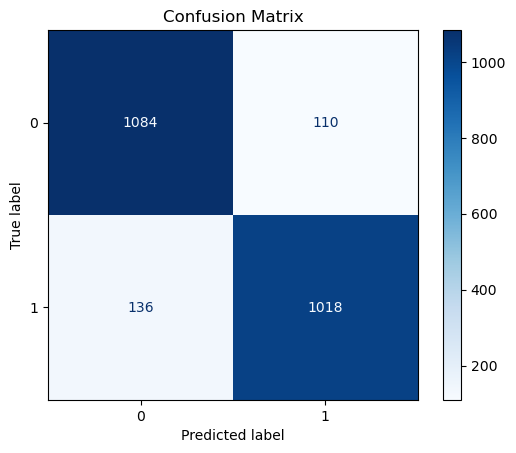

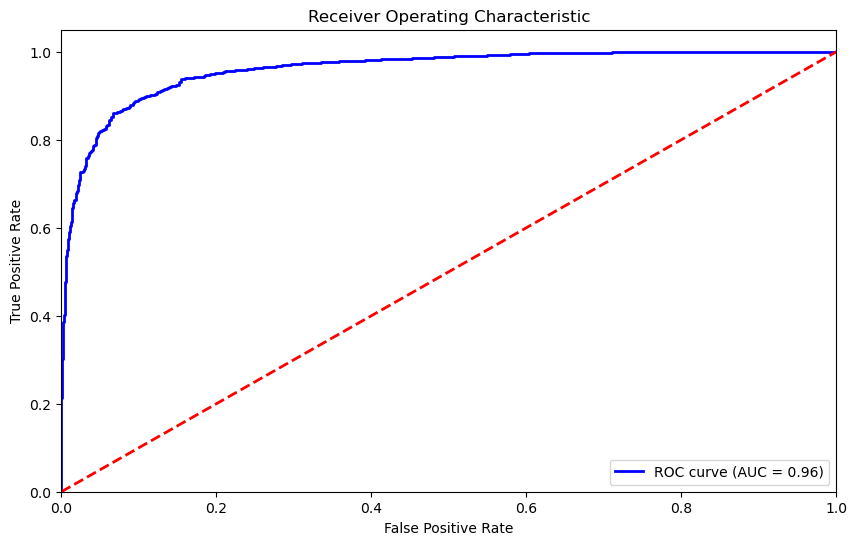

In [220]:
# Generate predictions and plots
y_pred = best_model.predict(X_test)
plot_confusion_matrix(y_test, y_pred)
plot_roc_curve(y_test, y_pred)


### **MLP WITH DROPOUT + DATA AUGMENTATION**

Given the MLP model trained in previous section using tensorflow in order to implement dropout, in the same way train an MLP on the dataset augmented using dropout.

In [259]:
augmented_df = pd.read_csv('best_data_augm.csv')
augmented_df.head()

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2,class
0,-0.048229,1.185286,-0.102776,-1.0,-0.937663,-0.724183,1.149472,1.0,1
1,1.414187,0.678416,0.228183,-1.0,0.315572,0.983723,-1.347318,1.0,1
2,-1.516547,-0.853938,-0.269088,-1.0,-1.370515,1.471178,1.212606,1.0,1
3,0.592590,-0.116408,-1.556461,-1.0,0.667746,-0.581234,-0.149559,1.0,1
4,0.386476,1.984040,-0.221010,-1.0,1.850310,1.436636,-1.424675,-1.0,0


In [260]:
X_train_augmented, y_train_augmented = augmented_df.drop(columns=['class']), augmented_df['class']
X_train_augmented

,pt1,eta1,phi1,Q1,pt2,eta2,phi2,Q2
0,-0.048229,1.185286,-0.102776,-1.000000,-0.937663,-0.724183,1.149472,1.000000
1,1.414187,0.678416,0.228183,-1.000000,0.315572,0.983723,-1.347318,1.000000
2,-1.516547,-0.853938,-0.269088,-1.000000,-1.370515,1.471178,1.212606,1.000000
3,0.592590,-0.116408,-1.556461,-1.000000,0.667746,-0.581234,-0.149559,1.000000
4,0.386476,1.984040,-0.221010,-1.000000,1.850310,1.436636,-1.424675,-1.000000
...,...,...,...,...,...,...,...,...
20232,-1.234187,-1.362952,-0.228264,-1.000000,1.649462,-1.496541,1.236666,-0.993577
20233,-0.494261,-0.285422,-1.044230,-1.000000,-0.401589,0.983109,0.821528,1.000000
20234,0.889490,-0.230100,-0.308781,1.000000,-0.023636,0.166795,1.106085,-1.000000
20235,1.360914,-0.027756,-1.119037,-0.670198,-0.792582,-0.440034,-0.037224,0.670198


In [261]:
# Clean previous augmented tuning results
shutil.rmtree('keras_tuner/mlp_tuning_augmented', ignore_errors=True)


In [262]:
# Create new tuner for augmented data
augmented_tuner = RandomSearch(
    MLPHyperModel(input_shape=(X_train_augmented.shape[1],)),
    objective='val_accuracy',
    max_trials=100,
    directory='keras_tuner',
    project_name='mlp_tuning_augmented'
)


c:\Users\tommy\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [263]:
# Run hyperparameter search on augmented data
augmented_tuner.search(
    X_train_augmented, y_train_augmented,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping],
    epochs=100
)


Trial 100 Complete [00h 00m 18s]
val_accuracy: 0.5039772987365723

Best val_accuracy So Far: 0.8855113387107849
Total elapsed time: 01h 06m 47s


In [264]:
# Retrieve best hyperparameters for augmented model
augmented_best_hps = augmented_tuner.get_best_hyperparameters(num_trials=1)[0]

print("\nBest Hyperparameters for Augmented Model:")
print("=========================================")
print(f"Hidden Layers: {augmented_best_hps.get('hidden_layer_sizes')}")
print(f"Activation: {augmented_best_hps.get('activation')}")
print(f"L2 Regularization (alpha): {augmented_best_hps.get('alpha'):.2e}")
print(f"Dropout Rate: {augmented_best_hps.get('dropout_rate')}")
print(f"Optimizer: {augmented_best_hps.get('optimizer')}")
print(f"Learning Rate: {augmented_best_hps.get('learning_rate_init'):.2e}")



Best Hyperparameters for Augmented Model:
Hidden Layers: 100-100
Activation: relu
L2 Regularization (alpha): 2.65e-06
Dropout Rate: 0.1
Optimizer: adam
Learning Rate: 5.87e-03


In [265]:
if augmented_best_hps.get('optimizer') == 'adam':
    print(f"Adam Beta1: {augmented_best_hps.get('beta_1')}")
    print(f"Adam Beta2: {augmented_best_hps.get('beta_2')}")
else:
    print(f"SGD Momentum: {augmented_best_hps.get('momentum')}")

print(f"Batch Size: {augmented_best_hps.get('batch_size')}")


Adam Beta1: 0.8407028168776272
Adam Beta2: 0.9509702931260666
Batch Size: 32


In [266]:
# Get and save augmented model
augmented_best_model = augmented_tuner.get_best_models(num_models=1)[0]
augmented_best_model.save('best_mlp_TF_augmented.h5', save_format="tf", include_optimizer=False)


c:\Users\tommy\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\tommy\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [267]:
# Load augmented model for evaluation
augmented_best_model = keras.models.load_model('best_mlp_TF_augmented.h5', compile=False)


In [268]:
# Recompile if needed for further training
augmented_best_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)


In [269]:
# Evaluate the augmented model

augmented_model_results = evaluate_model(
    augmented_best_model,
    X_train_augmented, y_train_augmented,
    X_val, y_val,
    X_test, y_test
)


Training Accuracy: 0.8708
Validation Accuracy: 0.8855
Test Accuracy: 0.8786


In [270]:
# validation and test scores
val_score_dropout_augm = augmented_model_results['val'][1]
test_score_dropout_augm = augmented_model_results['test'][1]
print("Validation set score: ", val_score_dropout_augm)
print("Test set score: ", test_score_dropout_augm)

Validation set score:  0.8855113387107849
Test set score:  0.8786200881004333


74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


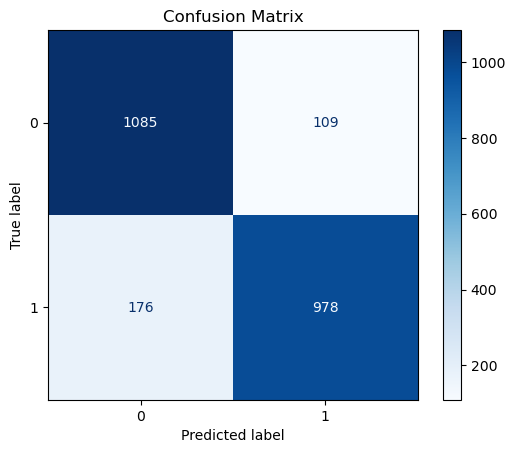

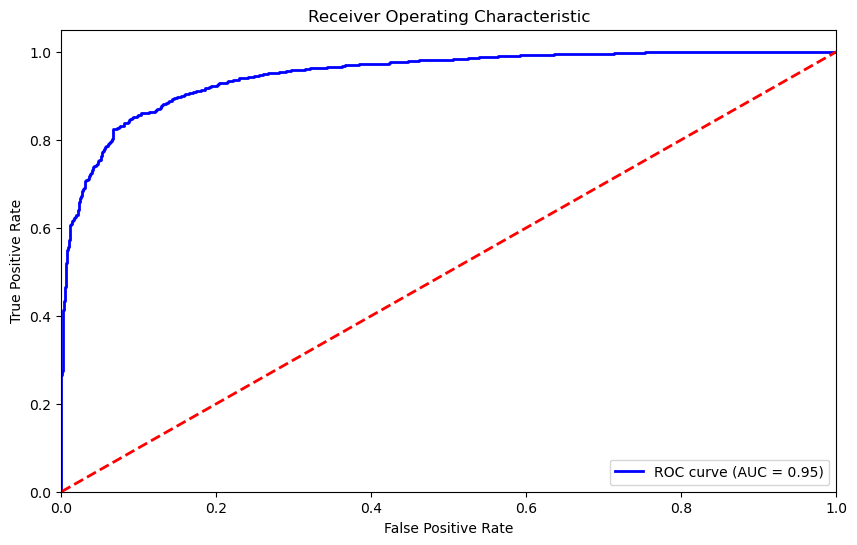

In [271]:
# Generate predictions and plots for augmented model
augmented_y_pred = augmented_best_model.predict(X_test)
plot_confusion_matrix(y_test, augmented_y_pred)
plot_roc_curve(y_test, augmented_y_pred)


## **9. GLOBALLY BEST MODEL**

As done with the best data aumentation inspection, check the validation score of all models (knn augmentation + filtration; dropout; dropout + data augmentation; W-GAN augmentation).

If there is a tie or a not clear best model check the test score

In [274]:
val_scores = [
    ("val_score_knn_filtered", val_score_knn_filtered),  # KNN augmentation
    ("val_score_dropout", val_score_dropout),  # Dropout augmentation
    ("val_score_dropout_augm", val_score_dropout_augm),  # Dropout augmentation on augmented data
    ("val_score_wgan_20", val_score_wgan_20),  # WGAN augmentation 20
    ("val_score_wgan_50", val_score_wgan_50)  # WGAN augmentation 50
]


sorted_vals = sorted(val_scores, key=lambda x: x[1], reverse=True)
names_validation = [name for name, value in sorted_vals]
values_validation = [value for name, value in sorted_vals]

print("Sorted Names:", names_validation)
print("Sorted Values:", values_validation)

Sorted Names: ['val_score_dropout', 'val_score_dropout_augm', 'val_score_wgan_20', 'val_score_knn_filtered', 'val_score_wgan_50']
Sorted Values: [0.8982954621315002, 0.8855113387107849, 0.8747159090909091, 0.8732954545454545, 0.8590909090909091]


In [273]:
test_scores = [
    ("test_score_knn_filtered", test_score_knn_filtered),  # KNN augmentation
    ("test_score_dropout", test_score_dropout),  # Dropout augmentation
    ("test_score_dropout_augm", test_score_dropout_augm),  # Dropout augmentation on augmented data
    ("test_score_wgan_20", test_score_wgan_20),  # WGAN augmentation 20
    ("test_score_wgan_50", test_score_wgan_50)  # WGAN augmentation 50
]


sorted_tests = sorted(test_scores, key=lambda x: x[1], reverse=True)
names_testidation = [name for name, testue in sorted_tests]
testues_testidation = [testue for name, testue in sorted_tests]

print("Sorted Names:", names_testidation)
print("Sorted testues:", testues_testidation)

Sorted Names: ['test_score_dropout', 'test_score_wgan_20', 'test_score_dropout_augm', 'test_score_knn_filtered', 'test_score_wgan_50']
Sorted testues: [0.8952299952507019, 0.8816013628620102, 0.8786200881004333, 0.8773424190800682, 0.8641396933560477]
